<hr style="border:2px solid gray">

##### Author  : SIVA VIKNESH 
##### Email   : siva.viknesh@sci.utah.edu / sivaviknesh14@gmail.com 
##### Address : SCI INSTITUTE, UNIVERSITY OF UTAH, SALT LAKE CITY, UTAH, USA 
<hr style="border:2px solid gray">

In [1]:
import os
import torch
import math
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.ticker as plticker
from mpl_toolkits.mplot3d import Axes3D
from scipy import integrate
plt.rcParams['lines.linewidth'] = 2
plt.rcParams.update({'font.size': 18})
plt.rcParams['figure.figsize'] = [12, 12]

import vtk
from vtk.util import numpy_support as VN
from itertools import combinations



Periodically-damped oscillator:  <br>
Paper: Harmonic Oscillators with Nonlinear Damping
$$
\begin{aligned}
\dot{x} & = y \\
\dot{y} & = -x +a y \hspace{1.5mm}\text{cos}(bx)  \\
\end{aligned}
$$

Parameters: \\(a\\), \\(b\\)

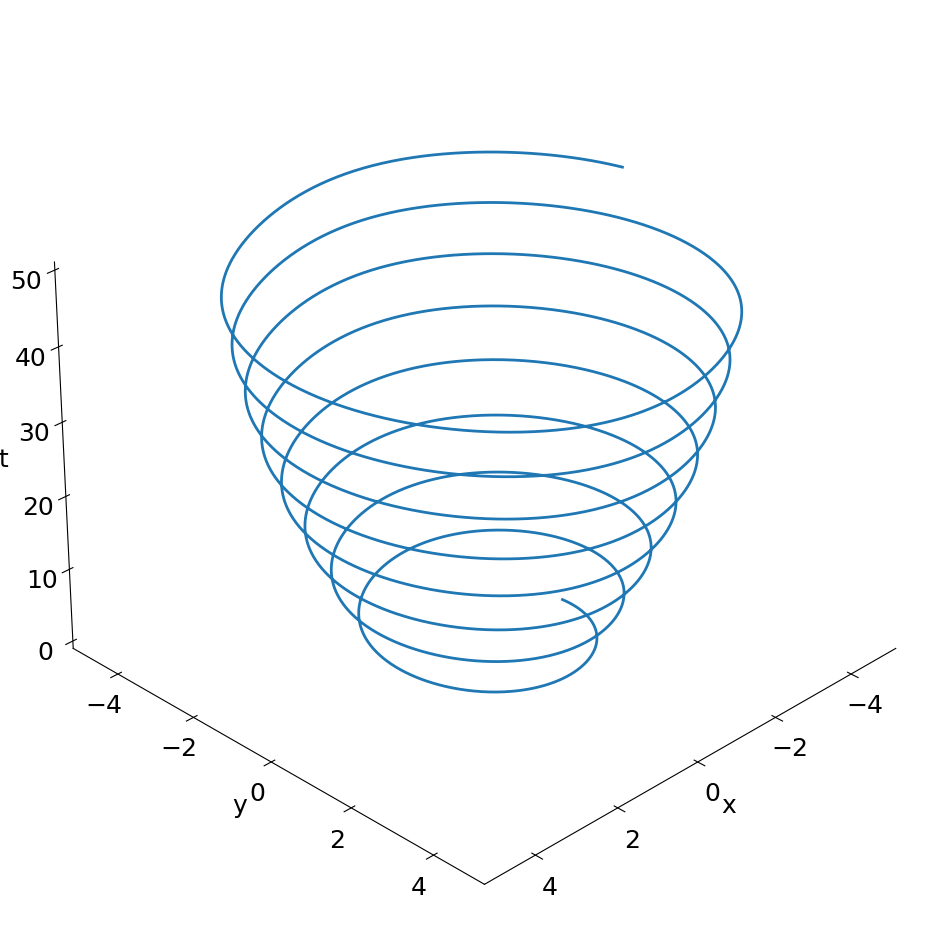

In [2]:
dt = 0.01
T = 50
t = np.arange(0,T+dt,dt)
a = -1.0
b =  0.1
c =  0.750


def oscillator_deriv(x_y, t0, a = a, b = b, c = c):
    x, y = x_y
    return [y, a*x +(b*y)*(np.cos(c*x))]

np.random.seed(123)
x0 = (-2, 0)
x_t = integrate.odeint(oscillator_deriv, x0, t, rtol=10**(-12),atol=10**(-12)*np.ones_like(x0))
x, y = x_t.T

# Create figure and 3D plot
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Plotting the data
ax.plot(x, y, t)

# Setting labels with Times New Roman font
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("t")

# Set limits for x and y axes
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)

# Remove background pane and borders
ax.xaxis.pane.fill = False  # Remove background pane for x-axis
ax.yaxis.pane.fill = False  # Remove background pane for y-axis
ax.zaxis.pane.fill = False  # Remove background pane for z-axis

# Turn off the pane borders
ax.xaxis.pane.set_edgecolor('none')  # No border for x-axis pane
ax.yaxis.pane.set_edgecolor('none')  # No border for y-axis pane
ax.zaxis.pane.set_edgecolor('none')  # No border for z-axis pane

# Remove grid
ax.grid(False)

ax.view_init(30, 45, 0)
# Save figure to a PDF file
plt.savefig('3d_plot.pdf', format='pdf', bbox_inches='tight')

# Display plot
plt.show()



In [3]:
# COMPUTING THE COMBINATIONS AMONG THE THREE CHOSEN TEMPORAL MODES

def POOL_DATA(yin, nVars, polyorder):
    n = yin.shape[0]
    yout = torch.zeros((n, 1)).to(processor)

    # poly order 0
    yout[:, 0] = torch.ones(n)

    # poly order 1
    for i in range(nVars):
        yout = torch.cat((yout, yin[:, i].reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 2
    if polyorder >= 2:
        for i in range(nVars):
            for j in range(i, nVars):
                yout = torch.cat((yout, (yin[:, i] * yin[:, j]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 3
    if polyorder >= 3:
        for i in range(nVars):
            for j in range(i, nVars):
                for k in range(j, nVars):
                    yout = torch.cat((yout, (yin[:, i] * yin[:, j] * yin[:, k]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    return yout

def DERIVATIVE(x, y, a, b, c):
    dxdt = y
    dydt = a*x + b*y*torch.cos(c*x)    
    return torch.vstack((dxdt, dydt)).T


AVAILABLE PROCESSOR: cuda 



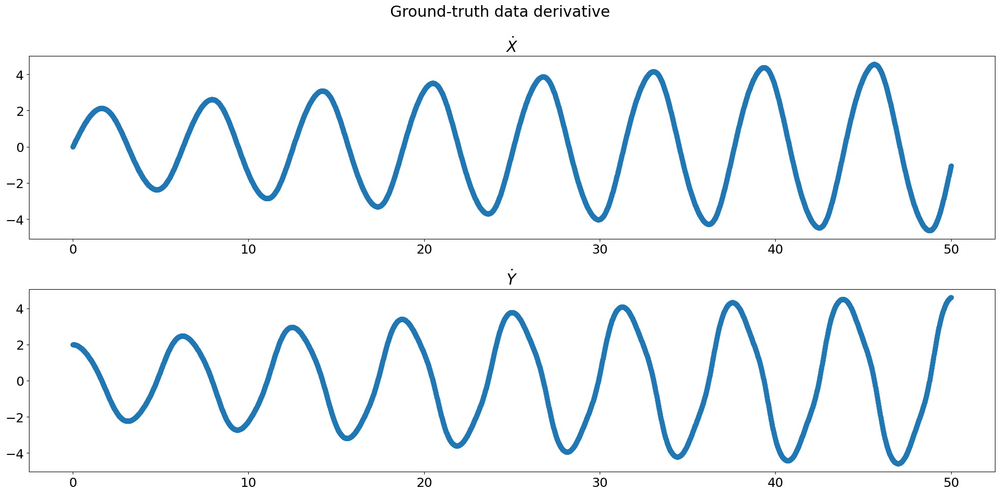

In [4]:
processor = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("AVAILABLE PROCESSOR:", processor, '\n')

N_modes  = 2
x_t      = torch.Tensor(x_t).to(processor)
x        = torch.Tensor(x).to(processor)
y        = torch.Tensor(y).to(processor)
t        = torch.Tensor(t).to(processor)

A_candidates    = POOL_DATA (x_t, 2, 1).to(processor)
A1A2_time_deriv = DERIVATIVE (x, y, a, b, c).to(processor)

# HYPERPARAMETERS FOR THE SINDy POD METHODOLOGY
Epochs        = 50000
learning_rate = 0.1
step_epoch    = 4000
decay_rate    = 0.50
tolerance     = 5e-3

fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data derivative')

ax[0].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 0].detach().cpu().numpy(), '-o') 
ax[0].set_title('$\dot{X}$')

ax[1].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 1].detach().cpu().numpy(), '-o') 
ax[1].set_title('$\dot{Y}$')

fig.tight_layout()
plt.show()


In [5]:
class SINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b
        
    def forward(self, x):
        output = torch.sin(self.b*x)
        return output
    
class COSINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b
        
    def forward(self, x):
        output = torch.cos(self.b*x)
        return output
    
class EXP_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.exp(self.b*x)
        return output

In [6]:
class ADAPTIVE_SINDy_MODEL(nn.Module):
    def __init__(self, a, asine, acosine, aexp, axsine, axcosine, axexp):
        super().__init__()    
        self.a        = a
        self.asine    = asine
        self.acosine  = acosine
        self.aexp     = aexp
        self.axsine   = axsine
        self.axcosine = axcosine
        self.axexp    = axexp
        
        self.sine     = SINE_TERM   (self.asine)
        self.cosine   = COSINE_TERM (self.acosine)
        self.exp      = EXP_TERM    (self.aexp)
        self.xsine    = SINE_TERM   (self.axsine)
        self.xcosine  = COSINE_TERM (self.axcosine)
        self.xexp     = EXP_TERM    (self.axexp)
        
    def forward(self, x):
        x1             = x [:, 1:]
        output_sine    = self.sine   (x1)
        output_cosine  = self.cosine (x1)
        output_exp     = self.exp    (x1)
        output_xsine   = self.xsine   (x1)
        output_xcosine = self.xcosine (x1)
        output_xexp    = self.xexp    (x1)
 
        output_xsine   = (output_xsine  [:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        output_xcosine = (output_xcosine[:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        output_xexp    = (output_xexp   [:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        
        output = torch.hstack((x, output_sine, output_cosine, output_exp, output_xsine, output_xcosine, output_xexp)) @ self.a
        return output


In [7]:
# AMPLITUDE COEFFICIENTS OF SINDy MODEL
COEFF_ADT   = torch.ones(21, N_modes, requires_grad= True, device= processor)

SINE_ADT    = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)
COSINE_ADT  = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)

XSINE_ADT   = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)
XCOSINE_ADT = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)

EXP_ADT     = torch.full((A_candidates.shape[1]-1, N_modes), -1.0, requires_grad= True, device= processor)
XEXP_ADT    = torch.full((A_candidates.shape[1]-1, N_modes), -1.0, requires_grad= True, device= processor)

In [8]:
# COEFFICIENTS OF SINDy MODEL
optim_COEFF_ADT = optim.Adam([COEFF_ADT, SINE_ADT, COSINE_ADT, EXP_ADT, XSINE_ADT, XCOSINE_ADT, XEXP_ADT], lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)

# WEIGHT FUNCTION OF SINDy MODEL
WEIGHTS  = Parameter(torch.ones_like(COEFF_ADT), requires_grad= True)
nn.init.normal_(WEIGHTS, mean=0, std=1)
Lambda   = Parameter(torch.tensor(1.0), requires_grad= True)

optim_weights = optim.Adam([WEIGHTS], lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_Lambda  = optim.Adam([Lambda],  lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)


# STEP DECAY DYNAMIC LEARNING RATE
scheduler_ADT     = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT, step_size=step_epoch, gamma=decay_rate)
scheduler_weights = torch.optim.lr_scheduler.StepLR(optim_weights,   step_size=step_epoch, gamma=decay_rate)
scheduler_LAMBDA  = torch.optim.lr_scheduler.StepLR(optim_Lambda,    step_size=step_epoch, gamma=decay_rate)


**Adaptive SINDy training**

In [9]:
# TEMPORAL MODE 1
A1_DT = ADAPTIVE_SINDy_MODEL(COEFF_ADT [:, 0], SINE_ADT [:, 0], COSINE_ADT[:, 0], EXP_ADT[:, 0], XSINE_ADT [:, 0], XCOSINE_ADT[:, 0], XEXP_ADT [:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = ADAPTIVE_SINDy_MODEL(COEFF_ADT [:, 1], SINE_ADT [:, 1], COSINE_ADT[:, 1], EXP_ADT[:, 1], XSINE_ADT [:, 1], XCOSINE_ADT[:, 1], XEXP_ADT [:, 1]).to(processor)

Loss_data     = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out  = A1_DT (A_candidates), A2_DT (A_candidates)
    output_data  = torch.stack((A1_out , A2_out), dim = 1)
    loss_epoch   = loss_function (A1A2_time_deriv, output_data) + torch.linalg.matrix_norm(torch.abs(WEIGHTS)*COEFF_ADT, ord =1)
    
    optim_COEFF_ADT.zero_grad()
    optim_Lambda.zero_grad()
    optim_weights.zero_grad()
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT.step()
        optim_Lambda.step()
        optim_weights.step()
        Loss_data [epoch] = loss_epoch.detach()
        COEFF_ADT   [torch.abs(COEFF_ADT)   <= tolerance] = 0.0
        SINE_ADT    [torch.abs(SINE_ADT)    <= tolerance] = 0.0
        COSINE_ADT  [torch.abs(COSINE_ADT)  <= tolerance] = 0.0
        XSINE_ADT   [torch.abs(XSINE_ADT)   <= tolerance] = 0.0
        XCOSINE_ADT [torch.abs(XCOSINE_ADT) <= tolerance] = 0.0
        EXP_ADT     [torch.abs(EXP_ADT)     <= tolerance] = 0.0
        XEXP_ADT    [torch.abs(XEXP_ADT)    <= tolerance] = 0.0
        
    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT.param_groups[0]['lr'])
    print ("*"*85)
       
    scheduler_ADT.step()
    scheduler_LAMBDA.step()
    scheduler_weights.step()

LOSS DATA, [EPOCH = 0 ]: 14023.087890625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 1921.542724609375
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 1109.6663818359375
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 3191.912109375
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 2674.02978515625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 1491.2374267578125
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 674.2218017578125
LEARNING RATE: 0.1
******************************************************

LOSS DATA, [EPOCH = 85 ]: 2.123955488204956
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 86 ]: 2.101471185684204
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 87 ]: 2.0211737155914307
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 88 ]: 2.012646436691284
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 89 ]: 1.9526982307434082
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 90 ]: 1.908806562423706
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 91 ]: 1.8655205965042114
LEARNING RATE: 0.1
****************************************

LOSS DATA, [EPOCH = 177 ]: 0.4836525022983551
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 178 ]: 0.4299440085887909
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 179 ]: 0.3945753574371338
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 180 ]: 0.4977690577507019
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 181 ]: 0.49725449085235596
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 182 ]: 0.48159313201904297
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 183 ]: 0.5014314651489258
LEARNING RATE: 0.1
***************************

LOSS DATA, [EPOCH = 278 ]: 0.26638728380203247
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 279 ]: 0.24232500791549683
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 280 ]: 0.24742259085178375
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 281 ]: 0.2700216472148895
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 282 ]: 0.2893122732639313
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 283 ]: 0.2600418031215668
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 284 ]: 0.28446686267852783
LEARNING RATE: 0.1
*************************

LOSS DATA, [EPOCH = 388 ]: 0.17422698438167572
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 389 ]: 0.17291352152824402
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 390 ]: 0.21237939596176147
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 391 ]: 0.17663368582725525
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 392 ]: 0.19377541542053223
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 393 ]: 0.23439234495162964
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 394 ]: 0.20604951679706573
LEARNING RATE: 0.1
**********************

LOSS DATA, [EPOCH = 491 ]: 0.19168847799301147
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 492 ]: 0.21255257725715637
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 493 ]: 0.1714262217283249
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 494 ]: 0.16515591740608215
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 495 ]: 0.17908522486686707
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 496 ]: 0.2032921463251114
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 497 ]: 0.21028189361095428
LEARNING RATE: 0.1
************************

LOSS DATA, [EPOCH = 599 ]: 0.13269305229187012
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 600 ]: 0.14994420111179352
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 601 ]: 0.12916481494903564
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 602 ]: 0.10788185894489288
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 603 ]: 0.10533344745635986
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 604 ]: 0.10752444714307785
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 605 ]: 0.13458015024662018
LEARNING RATE: 0.1
**********************

LOSS DATA, [EPOCH = 655 ]: 0.1749701052904129
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 656 ]: 0.1616343855857849
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 657 ]: 0.13073892891407013
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 658 ]: 0.12828563153743744
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 659 ]: 0.10870922356843948
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 660 ]: 0.15122255682945251
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 661 ]: 0.13436515629291534
LEARNING RATE: 0.1
************************

LOSS DATA, [EPOCH = 758 ]: 0.12537778913974762
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 759 ]: 0.10278122127056122
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 760 ]: 0.10841014981269836
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 761 ]: 0.07744210958480835
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 762 ]: 0.09538108855485916
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 763 ]: 0.08293679356575012
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 764 ]: 0.08071566373109818
LEARNING RATE: 0.1
**********************

LOSS DATA, [EPOCH = 812 ]: 0.06572609394788742
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 813 ]: 0.0867450088262558
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 814 ]: 0.13515232503414154
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 815 ]: 0.13251888751983643
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 816 ]: 0.116927370429039
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 817 ]: 0.08598680794239044
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 818 ]: 0.0892987921833992
LEARNING RATE: 0.1
**************************

LOSS DATA, [EPOCH = 918 ]: 0.09606879949569702
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 919 ]: 0.11420222371816635
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 920 ]: 0.10664738714694977
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 921 ]: 0.10294400900602341
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 922 ]: 0.08463983237743378
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 923 ]: 0.06238498166203499
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 924 ]: 0.06667601317167282
LEARNING RATE: 0.1
**********************

LOSS DATA, [EPOCH = 973 ]: 0.1047528088092804
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 974 ]: 0.12028089165687561
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 975 ]: 0.15257000923156738
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 976 ]: 0.12551379203796387
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 977 ]: 0.10235947370529175
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 978 ]: 0.11487866938114166
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 979 ]: 0.08716163784265518
LEARNING RATE: 0.1
***********************

LOSS DATA, [EPOCH = 1081 ]: 0.11565515398979187
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1082 ]: 0.11119718849658966
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1083 ]: 0.08015406876802444
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1084 ]: 0.06099030748009682
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1085 ]: 0.05772220715880394
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1086 ]: 0.09674280881881714
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1087 ]: 0.10161741077899933
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 1136 ]: 0.1061912477016449
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1137 ]: 0.1048612967133522
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1138 ]: 0.0971999317407608
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1139 ]: 0.10177496075630188
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1140 ]: 0.11470735818147659
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1141 ]: 0.08129127323627472
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1142 ]: 0.11155208200216293
LEARNING RATE: 0.1
******************

LOSS DATA, [EPOCH = 1191 ]: 0.08147183060646057
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1192 ]: 0.06134271249175072
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1193 ]: 0.06128986179828644
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1194 ]: 0.057631053030490875
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1195 ]: 0.07716605067253113
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1196 ]: 0.07796060293912888
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1197 ]: 0.07697878777980804
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 1247 ]: 0.05300004035234451
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1248 ]: 0.055025264620780945
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1249 ]: 0.06351388245820999
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1250 ]: 0.061251383274793625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1251 ]: 0.05930078774690628
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1252 ]: 0.05398038774728775
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1253 ]: 0.048150140792131424
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 1301 ]: 0.07973497360944748
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1302 ]: 0.07237309962511063
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1303 ]: 0.09298276901245117
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1304 ]: 0.0794471800327301
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1305 ]: 0.05435333400964737
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1306 ]: 0.044931598007678986
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1307 ]: 0.05678246542811394
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 1405 ]: 0.026743847876787186
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1406 ]: 0.04600801318883896
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1407 ]: 0.03998219966888428
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1408 ]: 0.04064038395881653
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1409 ]: 0.042446281760931015
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1410 ]: 0.03899509459733963
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1411 ]: 0.02836494706571102
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 1460 ]: 0.0341995432972908
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1461 ]: 0.043785497546195984
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1462 ]: 0.051747165620326996
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1463 ]: 0.0480085089802742
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1464 ]: 0.05614016205072403
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1465 ]: 0.04022873938083649
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1466 ]: 0.03506900370121002
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 1569 ]: 0.030976735055446625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1570 ]: 0.01150366198271513
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1571 ]: 0.017045538872480392
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1572 ]: 0.020833227783441544
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1573 ]: 0.02159992977976799
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1574 ]: 0.024732515215873718
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1575 ]: 0.020109854638576508
LEARNING RATE: 0.1
**********

LOSS DATA, [EPOCH = 1624 ]: 0.05573438107967377
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1625 ]: 0.05589408054947853
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1626 ]: 0.03383192792534828
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1627 ]: 0.04938387870788574
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1628 ]: 0.05221147462725639
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1629 ]: 0.06189736723899841
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1630 ]: 0.048662349581718445
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 1679 ]: 0.020867472514510155
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1680 ]: 0.0360480472445488
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1681 ]: 0.03651432320475578
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1682 ]: 0.03229784965515137
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1683 ]: 0.02804732322692871
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1684 ]: 0.04599699005484581
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1685 ]: 0.050584543496370316
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 1733 ]: 0.0244058296084404
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1734 ]: 0.0350043810904026
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1735 ]: 0.031469736248254776
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1736 ]: 0.02980094589293003
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1737 ]: 0.032868076115846634
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1738 ]: 0.031911276280879974
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1739 ]: 0.02596050128340721
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 1789 ]: 0.034356456249952316
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1790 ]: 0.043657656759023666
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1791 ]: 0.0403149276971817
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1792 ]: 0.04723638668656349
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1793 ]: 0.03247799351811409
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1794 ]: 0.04088395833969116
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1795 ]: 0.03653649985790253
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 1843 ]: 0.03818635642528534
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1844 ]: 0.040077269077301025
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1845 ]: 0.032113343477249146
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1846 ]: 0.03262228146195412
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1847 ]: 0.02708621323108673
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1848 ]: 0.03598413243889809
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1849 ]: 0.047192152589559555
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 1953 ]: 0.031524382531642914
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1954 ]: 0.0462985597550869
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1955 ]: 0.0547727569937706
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1956 ]: 0.05565105751156807
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1957 ]: 0.06270504742860794
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1958 ]: 0.050889551639556885
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1959 ]: 0.05054562911391258
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 2007 ]: 0.031982503831386566
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2008 ]: 0.037075161933898926
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2009 ]: 0.02649795264005661
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2010 ]: 0.018421176820993423
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2011 ]: 0.031032994389533997
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2012 ]: 0.04358638823032379
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2013 ]: 0.04615385830402374
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 2062 ]: 0.028299788013100624
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2063 ]: 0.017176641151309013
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2064 ]: 0.038365162909030914
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2065 ]: 0.03973082825541496
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2066 ]: 0.042677510529756546
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2067 ]: 0.03553718328475952
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2068 ]: 0.010005398653447628
LEARNING RATE: 0.1
**********

LOSS DATA, [EPOCH = 2117 ]: 0.032194584608078
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2118 ]: 0.048123493790626526
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2119 ]: 0.025722773745656013
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2120 ]: 0.0638938918709755
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2121 ]: 0.0501919649541378
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2122 ]: 0.04241645336151123
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2123 ]: 0.0382794551551342
LEARNING RATE: 0.1
******************

LOSS DATA, [EPOCH = 2172 ]: 0.03302345797419548
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2173 ]: 0.020849399268627167
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2174 ]: 0.030941234901547432
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2175 ]: 0.027544360607862473
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2176 ]: 0.033135369420051575
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2177 ]: 0.03847736492753029
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2178 ]: 0.03511524572968483
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 2278 ]: 0.027486929669976234
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2279 ]: 0.01626461371779442
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2280 ]: 0.03632646054029465
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2281 ]: 0.053541090339422226
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2282 ]: 0.04452436417341232
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2283 ]: 0.05227672681212425
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2284 ]: 0.026557009667158127
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 2332 ]: 0.018740300089120865
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2333 ]: 0.02913234755396843
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2334 ]: 0.035378847271203995
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2335 ]: 0.03553573787212372
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2336 ]: 0.03262391313910484
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2337 ]: 0.019617080688476562
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2338 ]: 0.03903781250119209
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 2387 ]: 0.03191998973488808
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2388 ]: 0.02442038059234619
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2389 ]: 0.04112045466899872
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2390 ]: 0.039327774196863174
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2391 ]: 0.029978187754750252
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2392 ]: 0.02796160988509655
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2393 ]: 0.030429042875766754
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 2443 ]: 0.026690712198615074
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2444 ]: 0.01293856743723154
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2445 ]: 0.027495384216308594
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2446 ]: 0.03014315292239189
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2447 ]: 0.03232993930578232
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2448 ]: 0.03128272667527199
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2449 ]: 0.01752435602247715
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 2498 ]: 0.31290388107299805
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2499 ]: 0.0429837703704834
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2500 ]: 0.34352174401283264
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2501 ]: 0.08996394276618958
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2502 ]: 0.14309123158454895
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2503 ]: 0.15068911015987396
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2504 ]: 0.07388494163751602
LEARNING RATE: 0.1
****************

LOSS DATA, [EPOCH = 2553 ]: 0.02653142623603344
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2554 ]: 0.020991917699575424
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2555 ]: 0.031267501413822174
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2556 ]: 0.01865875907242298
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2557 ]: 0.015336211770772934
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2558 ]: 0.02324591390788555
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2559 ]: 0.029407711699604988
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 2609 ]: 0.03980693221092224
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2610 ]: 0.05329364165663719
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2611 ]: 0.05440212041139603
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2612 ]: 0.05525771528482437
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2613 ]: 0.05433813855051994
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2614 ]: 0.07034824043512344
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2615 ]: 0.05312656611204147
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 2715 ]: 0.014611870981752872
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2716 ]: 0.021804872900247574
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2717 ]: 0.016805047169327736
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2718 ]: 0.019933337345719337
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2719 ]: 0.0248432494699955
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2720 ]: 0.01797686703503132
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2721 ]: 0.01824125461280346
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 2771 ]: 0.043855585157871246
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2772 ]: 0.03776386380195618
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2773 ]: 0.05791756883263588
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2774 ]: 0.061834875494241714
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2775 ]: 0.055596973747015
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2776 ]: 0.062045879662036896
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2777 ]: 0.04858117178082466
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 2877 ]: 0.03528887778520584
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2878 ]: 0.0473877377808094
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2879 ]: 0.029177090153098106
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2880 ]: 0.03555116802453995
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2881 ]: 0.03142162784934044
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2882 ]: 0.031345199793577194
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2883 ]: 0.027977686375379562
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 2932 ]: 0.04170677065849304
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2933 ]: 0.04218209534883499
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2934 ]: 0.03926776349544525
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2935 ]: 0.04654596373438835
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2936 ]: 0.04633212089538574
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2937 ]: 0.058114439249038696
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2938 ]: 0.0486290343105793
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 2987 ]: 0.07871013879776001
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2988 ]: 0.06948047876358032
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2989 ]: 0.043127790093421936
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2990 ]: 0.05400487780570984
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2991 ]: 0.06283868849277496
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2992 ]: 0.041352804750204086
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2993 ]: 0.038669805973768234
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 3043 ]: 0.02653808705508709
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3044 ]: 0.018951695412397385
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3045 ]: 0.02328484319150448
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3046 ]: 0.036061983555555344
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3047 ]: 0.02616039663553238
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3048 ]: 0.017381612211465836
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3049 ]: 0.026689548045396805
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 3098 ]: 0.013086039572954178
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3099 ]: 0.018438367173075676
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3100 ]: 0.023443670943379402
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3101 ]: 0.021415257826447487
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3102 ]: 0.014990917406976223
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3103 ]: 0.020846331492066383
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3104 ]: 0.016916165128350258
LEARNING RATE: 0.1
********

LOSS DATA, [EPOCH = 3154 ]: 0.03255624696612358
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3155 ]: 0.029241548851132393
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3156 ]: 0.010713542811572552
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3157 ]: 0.03234538063406944
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3158 ]: 0.04879135638475418
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3159 ]: 0.04335084185004234
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3160 ]: 0.04423294588923454
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 3209 ]: 0.03547140955924988
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3210 ]: 0.028804365545511246
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3211 ]: 0.026136761531233788
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3212 ]: 0.02426268719136715
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3213 ]: 0.027989370748400688
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3214 ]: 0.04030750319361687
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3215 ]: 0.046175383031368256
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 3264 ]: 0.032493021339178085
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3265 ]: 0.023706845939159393
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3266 ]: 0.02342272363603115
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3267 ]: 0.01408630982041359
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3268 ]: 0.0242319218814373
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3269 ]: 0.02920558676123619
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3270 ]: 0.028158482164144516
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 3318 ]: 0.04658184573054314
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3319 ]: 0.026658445596694946
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3320 ]: 0.03766472637653351
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3321 ]: 0.048816174268722534
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3322 ]: 0.0577683225274086
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3323 ]: 0.0520816408097744
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3324 ]: 0.02978978492319584
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 3373 ]: 0.04412881284952164
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3374 ]: 0.041286397725343704
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3375 ]: 0.04511161148548126
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3376 ]: 0.046739187091588974
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3377 ]: 0.05427609011530876
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3378 ]: 0.05034792050719261
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3379 ]: 0.03596200793981552
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 3476 ]: 0.02281084656715393
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3477 ]: 0.021215397864580154
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3478 ]: 0.02949208766222
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3479 ]: 0.0272053275257349
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3480 ]: 0.019600776955485344
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3481 ]: 0.022114668041467667
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3482 ]: 0.017900167033076286
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 3531 ]: 0.0335129052400589
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3532 ]: 0.02487049251794815
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3533 ]: 0.033124566078186035
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3534 ]: 0.03271576017141342
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3535 ]: 0.02332041598856449
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3536 ]: 0.019926853477954865
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3537 ]: 0.01973077468574047
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 3587 ]: 0.02461671084165573
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3588 ]: 0.0246092788875103
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3589 ]: 0.02096509002149105
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3590 ]: 0.017844069749116898
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3591 ]: 0.016669675707817078
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3592 ]: 0.0248792115598917
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3593 ]: 0.025267284363508224
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 3641 ]: 0.017820272594690323
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3642 ]: 0.021764766424894333
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3643 ]: 0.027036495506763458
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3644 ]: 0.01885623298585415
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3645 ]: 0.02908581867814064
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3646 ]: 0.03592358157038689
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3647 ]: 0.028645234182476997
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 3695 ]: 0.021240536123514175
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3696 ]: 0.0265714842826128
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3697 ]: 0.011265994980931282
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3698 ]: 0.011888934299349785
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3699 ]: 0.022019414231181145
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3700 ]: 0.011432629078626633
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3701 ]: 0.01453053206205368
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 3752 ]: 0.0164846982806921
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3753 ]: 0.014408113434910774
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3754 ]: 0.023196011781692505
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3755 ]: 0.02010689489543438
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3756 ]: 0.033621326088905334
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3757 ]: 0.01604972779750824
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3758 ]: 0.030300172045826912
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 3807 ]: 0.03865334764122963
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3808 ]: 0.054759763181209564
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3809 ]: 0.05546610802412033
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3810 ]: 0.03983039781451225
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3811 ]: 0.0394289530813694
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3812 ]: 0.054614197462797165
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3813 ]: 0.057611316442489624
LEARNING RATE: 0.1
*************

LOSS DATA, [EPOCH = 3862 ]: 0.030224619433283806
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3863 ]: 0.03852995112538338
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3864 ]: 0.044360071420669556
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3865 ]: 0.03610609099268913
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3866 ]: 0.020775141194462776
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3867 ]: 0.025593115016818047
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3868 ]: 0.04928869754076004
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 3918 ]: 0.03375953063368797
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3919 ]: 0.03402481973171234
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3920 ]: 0.03444233909249306
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3921 ]: 0.0499943345785141
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3922 ]: 0.05008519068360329
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3923 ]: 0.03767884150147438
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3924 ]: 0.030814098194241524
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 3973 ]: 0.04358495771884918
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3974 ]: 0.03598962724208832
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3975 ]: 0.013730819337069988
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3976 ]: 0.029622729867696762
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3977 ]: 0.031577106565237045
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3978 ]: 0.03949804604053497
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3979 ]: 0.03353475034236908
LEARNING RATE: 0.1
************

LOSS DATA, [EPOCH = 4028 ]: 0.01961645297706127
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4029 ]: 0.024553941562771797
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4030 ]: 0.022089876234531403
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4031 ]: 0.012137269601225853
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4032 ]: 0.008484953083097935
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4033 ]: 0.01934698410332203
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4034 ]: 0.024798767641186714
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 4084 ]: 0.01972120627760887
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4085 ]: 0.01628766767680645
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4086 ]: 0.005904411897063255
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4087 ]: 0.008369596675038338
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4088 ]: 0.009531592018902302
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4089 ]: 0.004673326388001442
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4090 ]: 0.00818292610347271
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 4140 ]: 0.00716089503839612
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4141 ]: 0.004182566422969103
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4142 ]: 0.00545104593038559
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4143 ]: 0.004879333544522524
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4144 ]: 0.00926344282925129
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4145 ]: 0.009975548833608627
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4146 ]: 0.008033973164856434
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 4194 ]: 0.007450916338711977
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4195 ]: 0.008426184765994549
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4196 ]: 0.005807566922158003
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4197 ]: 0.007414866704493761
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4198 ]: 0.008218098431825638
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4199 ]: 0.0032170331105589867
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4200 ]: 0.00549653684720397
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 4250 ]: 0.014746885746717453
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4251 ]: 0.009484495967626572
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4252 ]: 0.015053169801831245
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4253 ]: 0.011290673166513443
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4254 ]: 0.009225506335496902
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4255 ]: 0.01320664118975401
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4256 ]: 0.006354254670441151
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 4305 ]: 0.010688736103475094
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4306 ]: 0.008248506113886833
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4307 ]: 0.009643876925110817
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4308 ]: 0.008431131020188332
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4309 ]: 0.0097978999838233
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4310 ]: 0.005009990185499191
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4311 ]: 0.009193743579089642
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 4360 ]: 0.011331206187605858
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4361 ]: 0.012867552228271961
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4362 ]: 0.01399093959480524
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4363 ]: 0.011700844392180443
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4364 ]: 0.006325911730527878
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4365 ]: 0.010716299526393414
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4366 ]: 0.00897233933210373
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 4413 ]: 0.008226219564676285
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4414 ]: 0.009358824230730534
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4415 ]: 0.00756226247176528
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4416 ]: 0.007907352410256863
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4417 ]: 0.011139113456010818
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4418 ]: 0.00991828739643097
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4419 ]: 0.011480666697025299
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 4466 ]: 0.013799027539789677
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4467 ]: 0.01494633499532938
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4468 ]: 0.017141902819275856
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4469 ]: 0.007047729566693306
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4470 ]: 0.00891528744250536
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4471 ]: 0.015234698541462421
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4472 ]: 0.016418568789958954
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 4521 ]: 0.01009476650506258
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4522 ]: 0.014763720333576202
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4523 ]: 0.016049198806285858
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4524 ]: 0.014512532390654087
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4525 ]: 0.01317795179784298
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4526 ]: 0.01762104406952858
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4527 ]: 0.01541940402239561
LEARNING RATE: 0.05
*****

LOSS DATA, [EPOCH = 4577 ]: 0.004039483144879341
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4578 ]: 0.009252997115254402
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4579 ]: 0.013137091882526875
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4580 ]: 0.010967305861413479
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4581 ]: 0.009938268922269344
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4582 ]: 0.009493090212345123
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4583 ]: 0.00930666271597147
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 4633 ]: 0.01769137568771839
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4634 ]: 0.014971557073295116
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4635 ]: 0.01090145017951727
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4636 ]: 0.012940006330609322
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4637 ]: 0.018829626962542534
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4638 ]: 0.018844958394765854
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4639 ]: 0.011449454352259636
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 4687 ]: 0.006077112630009651
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4688 ]: 0.008391420356929302
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4689 ]: 0.0043738363310694695
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4690 ]: 0.008573716506361961
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4691 ]: 0.010004059411585331
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4692 ]: 0.00609923480078578
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4693 ]: 0.005912605673074722
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 4743 ]: 0.003884199308231473
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4744 ]: 0.0050506144762039185
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4745 ]: 0.007816141471266747
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4746 ]: 0.004741042386740446
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4747 ]: 0.005893325433135033
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4748 ]: 0.007519320584833622
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4749 ]: 0.0056852251291275024
LEARNING RATE: 0.05

LOSS DATA, [EPOCH = 4797 ]: 0.006224414333701134
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4798 ]: 0.007754966616630554
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4799 ]: 0.005281477235257626
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4800 ]: 0.010030931793153286
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4801 ]: 0.013249890878796577
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4802 ]: 0.013655540533363819
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4803 ]: 0.006724256090819836
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 4851 ]: 0.03137305751442909
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4852 ]: 0.030408019199967384
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4853 ]: 0.022065825760364532
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4854 ]: 0.016808493062853813
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4855 ]: 0.02567104995250702
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4856 ]: 0.01700817234814167
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4857 ]: 0.02344268560409546
LEARNING RATE: 0.05
*****

LOSS DATA, [EPOCH = 4907 ]: 0.013104129582643509
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4908 ]: 0.011367355473339558
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4909 ]: 0.012350034900009632
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4910 ]: 0.01151235681027174
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4911 ]: 0.005897287279367447
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4912 ]: 0.009588528424501419
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4913 ]: 0.014962843619287014
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 4963 ]: 0.003572920337319374
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4964 ]: 0.008266231045126915
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4965 ]: 0.00868568941950798
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4966 ]: 0.010180741548538208
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4967 ]: 0.004635347053408623
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4968 ]: 0.006196268834173679
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4969 ]: 0.010021399706602097
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 5018 ]: 0.022268714383244514
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5019 ]: 0.020779738202691078
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5020 ]: 0.01766071282327175
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5021 ]: 0.019027575850486755
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5022 ]: 0.01299363188445568
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5023 ]: 0.012604210525751114
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5024 ]: 0.011844868771731853
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5073 ]: 0.01455013733357191
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5074 ]: 0.018194423988461494
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5075 ]: 0.015395110473036766
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5076 ]: 0.015719037503004074
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5077 ]: 0.012602519243955612
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5078 ]: 0.01775309629738331
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5079 ]: 0.01729012094438076
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 5130 ]: 0.011750803329050541
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5131 ]: 0.004946919623762369
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5132 ]: 0.012188700959086418
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5133 ]: 0.01485727820545435
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5134 ]: 0.012653837911784649
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5135 ]: 0.006769078783690929
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5136 ]: 0.007856273092329502
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 5184 ]: 0.007023685611784458
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5185 ]: 0.009483380243182182
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5186 ]: 0.009963729418814182
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5187 ]: 0.004666583146899939
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5188 ]: 0.007862206548452377
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5189 ]: 0.015805544331669807
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5190 ]: 0.015865013003349304
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 5239 ]: 0.00499517098069191
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5240 ]: 0.014986603520810604
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5241 ]: 0.018546713516116142
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5242 ]: 0.014906126074492931
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5243 ]: 0.00418107770383358
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5244 ]: 0.01534014381468296
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5245 ]: 0.02924174815416336
LEARNING RATE: 0.05
*****

LOSS DATA, [EPOCH = 5295 ]: 0.011676399037241936
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5296 ]: 0.01461074035614729
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5297 ]: 0.012263594195246696
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5298 ]: 0.011751407757401466
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5299 ]: 0.007903165183961391
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5300 ]: 0.013865526765584946
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5301 ]: 0.01294698379933834
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5348 ]: 0.011404371820390224
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5349 ]: 0.017003966495394707
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5350 ]: 0.015621637925505638
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5351 ]: 0.016933584585785866
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5352 ]: 0.011755472049117088
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5353 ]: 0.012553620152175426
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5354 ]: 0.015615679323673248
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 5404 ]: 0.021441517397761345
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5405 ]: 0.016081327572464943
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5406 ]: 0.008725916966795921
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5407 ]: 0.010087796486914158
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5408 ]: 0.010632835328578949
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5409 ]: 0.010633728466928005
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5410 ]: 0.017667008563876152
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 5460 ]: 0.01681988313794136
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5461 ]: 0.017273804172873497
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5462 ]: 0.027578730136156082
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5463 ]: 0.02918347343802452
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5464 ]: 0.023732837289571762
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5465 ]: 0.015175944194197655
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5466 ]: 0.012823649682104588
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5516 ]: 0.0110514797270298
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5517 ]: 0.014860987663269043
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5518 ]: 0.016503240913152695
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5519 ]: 0.01158796064555645
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5520 ]: 0.010426788590848446
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5521 ]: 0.01347187627106905
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5522 ]: 0.013239956460893154
LEARNING RATE: 0.05
*****

LOSS DATA, [EPOCH = 5571 ]: 0.011818350292742252
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5572 ]: 0.016649745404720306
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5573 ]: 0.010375963523983955
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5574 ]: 0.0193774476647377
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5575 ]: 0.016484469175338745
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5576 ]: 0.024146994575858116
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5577 ]: 0.021404406055808067
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5627 ]: 0.019556434825062752
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5628 ]: 0.017371267080307007
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5629 ]: 0.008705263957381248
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5630 ]: 0.010411981493234634
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5631 ]: 0.009583636187016964
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5632 ]: 0.011928841471672058
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5633 ]: 0.008695722557604313
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 5681 ]: 0.004814040847122669
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5682 ]: 0.0056844656355679035
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5683 ]: 0.0025701927952468395
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5684 ]: 0.007704677525907755
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5685 ]: 0.009973665699362755
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5686 ]: 0.010041244328022003
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5687 ]: 0.0021298211067914963
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 5735 ]: 0.00868993904441595
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5736 ]: 0.014070726931095123
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5737 ]: 0.0128220459446311
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5738 ]: 0.01119717862457037
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5739 ]: 0.010540638118982315
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5740 ]: 0.009147348813712597
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5741 ]: 0.012353271245956421
LEARNING RATE: 0.05
*****

LOSS DATA, [EPOCH = 5792 ]: 0.01556804683059454
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5793 ]: 0.01510538812726736
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5794 ]: 0.015001513995230198
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5795 ]: 0.009898839518427849
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5796 ]: 0.009333835914731026
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5797 ]: 0.012862234376370907
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5798 ]: 0.013051827438175678
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5847 ]: 0.011913172900676727
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5848 ]: 0.009406590834259987
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5849 ]: 0.012264005839824677
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5850 ]: 0.0113302581012249
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5851 ]: 0.006606525741517544
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5852 ]: 0.0058040376752614975
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5853 ]: 0.01475114282220602
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5901 ]: 0.011050734668970108
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5902 ]: 0.00989419873803854
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5903 ]: 0.005664898082613945
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5904 ]: 0.01174987480044365
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5905 ]: 0.01806609518826008
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5906 ]: 0.015894103795289993
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5907 ]: 0.007705453783273697
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 5958 ]: 0.012375854887068272
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5959 ]: 0.01669638603925705
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5960 ]: 0.012161148712038994
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5961 ]: 0.013832617551088333
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5962 ]: 0.008618125692009926
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5963 ]: 0.018535487353801727
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5964 ]: 0.010064073838293552
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6013 ]: 0.014260133728384972
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6014 ]: 0.011951038613915443
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6015 ]: 0.014590064994990826
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6016 ]: 0.021633129566907883
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6017 ]: 0.017699144780635834
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6018 ]: 0.02041734755039215
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6019 ]: 0.008865469135344028
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6068 ]: 0.008176904171705246
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6069 ]: 0.014749541878700256
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6070 ]: 0.013858006335794926
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6071 ]: 0.006551773753017187
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6072 ]: 0.007919074967503548
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6073 ]: 0.013168967328965664
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6074 ]: 0.010790128260850906
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6124 ]: 0.013657488860189915
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6125 ]: 0.011242859065532684
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6126 ]: 0.017428606748580933
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6127 ]: 0.01976536214351654
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6128 ]: 0.019990140572190285
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6129 ]: 0.02028612419962883
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6130 ]: 0.010973089374601841
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 6179 ]: 0.010214868932962418
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6180 ]: 0.010305868461728096
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6181 ]: 0.01095388364046812
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6182 ]: 0.0094477329403162
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6183 ]: 0.007449859753251076
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6184 ]: 0.009642479941248894
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6185 ]: 0.010094944387674332
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 6233 ]: 0.015145406126976013
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6234 ]: 0.013224015012383461
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6235 ]: 0.012288547120988369
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6236 ]: 0.013237155973911285
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6237 ]: 0.007023496087640524
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6238 ]: 0.008769217878580093
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6239 ]: 0.007663097232580185
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6289 ]: 0.0063067288137972355
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6290 ]: 0.00748283788561821
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6291 ]: 0.011281781829893589
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6292 ]: 0.010046296752989292
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6293 ]: 0.0028945058584213257
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6294 ]: 0.0039748214185237885
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6295 ]: 0.004277744796127081
LEARNING RATE: 0.05

LOSS DATA, [EPOCH = 6344 ]: 0.020803209394216537
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6345 ]: 0.061518095433712006
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6346 ]: 0.03595052659511566
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6347 ]: 0.025460734963417053
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6348 ]: 0.03824054077267647
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6349 ]: 0.02677157148718834
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6350 ]: 0.019963735714554787
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 6400 ]: 0.01441186759620905
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6401 ]: 0.011356605216860771
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6402 ]: 0.016221756115555763
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6403 ]: 0.016661209985613823
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6404 ]: 0.012585538439452648
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6405 ]: 0.022399410605430603
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6406 ]: 0.017856840044260025
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6456 ]: 0.01450877171009779
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6457 ]: 0.015577530488371849
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6458 ]: 0.022282345220446587
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6459 ]: 0.01640498824417591
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6460 ]: 0.017117943614721298
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6461 ]: 0.011825445108115673
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6462 ]: 0.020219961181282997
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 6511 ]: 0.012618156149983406
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6512 ]: 0.013471933081746101
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6513 ]: 0.01641032099723816
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6514 ]: 0.013549567200243473
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6515 ]: 0.006977839395403862
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6516 ]: 0.011394561268389225
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6517 ]: 0.017241185531020164
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6565 ]: 0.004336537793278694
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6566 ]: 0.0035664120223373175
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6567 ]: 0.004075291566550732
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6568 ]: 0.005299533251672983
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6569 ]: 0.007641851436346769
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6570 ]: 0.005247242283076048
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6571 ]: 0.011455254629254341
LEARNING RATE: 0.05


LOSS DATA, [EPOCH = 6620 ]: 0.021670015528798103
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6621 ]: 0.020452963188290596
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6622 ]: 0.012031172402203083
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6623 ]: 0.013056326657533646
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6624 ]: 0.018161408603191376
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6625 ]: 0.017818830907344818
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6626 ]: 0.014238188043236732
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6676 ]: 0.014559841714799404
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6677 ]: 0.019137313589453697
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6678 ]: 0.01544207613915205
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6679 ]: 0.009007038548588753
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6680 ]: 0.015773000195622444
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6681 ]: 0.019040478393435478
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6682 ]: 0.024008139967918396
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6731 ]: 0.010377283208072186
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6732 ]: 0.011149474419653416
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6733 ]: 0.005448066163808107
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6734 ]: 0.011769916862249374
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6735 ]: 0.015210749581456184
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6736 ]: 0.01162794604897499
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6737 ]: 0.002984411548823118
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6786 ]: 0.01856028474867344
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6787 ]: 0.012342218309640884
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6788 ]: 0.0025012718979269266
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6789 ]: 0.007845215499401093
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6790 ]: 0.006888480857014656
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6791 ]: 0.006012910045683384
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6792 ]: 0.006144307553768158
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6840 ]: 0.011138957925140858
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6841 ]: 0.008113346062600613
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6842 ]: 0.013506598770618439
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6843 ]: 0.015005906112492085
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6844 ]: 0.015188519842922688
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6845 ]: 0.010145110078155994
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6846 ]: 0.008183992467820644
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6895 ]: 0.007096542045474052
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6896 ]: 0.0073693254962563515
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6897 ]: 0.011923691257834435
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6898 ]: 0.011464042589068413
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6899 ]: 0.004258196800947189
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6900 ]: 0.011880023404955864
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6901 ]: 0.01642669551074505
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6952 ]: 0.015881899744272232
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6953 ]: 0.01381012238562107
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6954 ]: 0.008114124648272991
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6955 ]: 0.012968816794455051
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6956 ]: 0.012902677059173584
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6957 ]: 0.012264840304851532
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6958 ]: 0.004971226677298546
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 7008 ]: 0.0057713487185537815
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7009 ]: 0.004987703636288643
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7010 ]: 0.005964324343949556
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7011 ]: 0.002154845278710127
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7012 ]: 0.007183952257037163
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7013 ]: 0.012742916122078896
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7014 ]: 0.008832731284201145
LEARNING RATE: 0.05


LOSS DATA, [EPOCH = 7064 ]: 0.015473145060241222
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7065 ]: 0.008877774700522423
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7066 ]: 0.010286089964210987
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7067 ]: 0.01515317801386118
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7068 ]: 0.011207016184926033
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7069 ]: 0.005788664799183607
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7070 ]: 0.01352041307836771
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 7118 ]: 0.006467691622674465
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7119 ]: 0.013782236725091934
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7120 ]: 0.016074270009994507
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7121 ]: 0.00863663386553526
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7122 ]: 0.008028248324990273
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7123 ]: 0.011440605856478214
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7124 ]: 0.010415807366371155
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 7175 ]: 0.008689056150615215
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7176 ]: 0.006638214457780123
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7177 ]: 0.008075331337749958
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7178 ]: 0.012083425186574459
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7179 ]: 0.009436807595193386
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7180 ]: 0.012537055648863316
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7181 ]: 0.01062193512916565
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 7228 ]: 0.013918952085077763
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7229 ]: 0.006890208926051855
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7230 ]: 0.011014868505299091
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7231 ]: 0.01942085288465023
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7232 ]: 0.020519554615020752
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7233 ]: 0.014999023638665676
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7234 ]: 0.011199994944036007
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 7335 ]: 0.0040827239863574505
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7336 ]: 0.006905080750584602
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7337 ]: 0.0061266496777534485
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7338 ]: 0.0064049470238387585
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7339 ]: 0.0076539888978004456
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7340 ]: 0.004532701335847378
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7341 ]: 0.007596517913043499
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 7389 ]: 0.015820316970348358
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7390 ]: 0.02083226479589939
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7391 ]: 0.01539606787264347
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7392 ]: 0.01844913512468338
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7393 ]: 0.013702960684895515
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7394 ]: 0.011552009731531143
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7395 ]: 0.011275860480964184
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 7445 ]: 0.01460392028093338
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7446 ]: 0.013797590509057045
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7447 ]: 0.00822118017822504
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7448 ]: 0.009162737056612968
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7449 ]: 0.008420522324740887
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7450 ]: 0.007768610492348671
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7451 ]: 0.004707816522568464
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 7501 ]: 0.011839487589895725
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7502 ]: 0.017015304416418076
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7503 ]: 0.017732257023453712
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7504 ]: 0.015027869492769241
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7505 ]: 0.017269128933548927
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7506 ]: 0.008260294795036316
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7507 ]: 0.013148494996130466
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7556 ]: 0.011771392077207565
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7557 ]: 0.008926975540816784
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7558 ]: 0.008994446136057377
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7559 ]: 0.012393169105052948
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7560 ]: 0.01218700222671032
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7561 ]: 0.005198626779019833
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7562 ]: 0.0074537452310323715
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7609 ]: 0.017985079437494278
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7610 ]: 0.02433568425476551
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7611 ]: 0.020419878885149956
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7612 ]: 0.02230130322277546
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7613 ]: 0.020939558744430542
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7614 ]: 0.020610639825463295
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7615 ]: 0.019432678818702698
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 7667 ]: 0.020221084356307983
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7668 ]: 0.020480111241340637
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7669 ]: 0.014669936150312424
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7670 ]: 0.011130331084132195
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7671 ]: 0.014304651878774166
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7672 ]: 0.014574524946510792
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7673 ]: 0.011478926055133343
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7721 ]: 0.004939205013215542
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7722 ]: 0.013441990129649639
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7723 ]: 0.017138859257102013
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7724 ]: 0.015001488849520683
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7725 ]: 0.009430746547877789
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7726 ]: 0.009584402665495872
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7727 ]: 0.010365039110183716
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7776 ]: 0.01032946165651083
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7777 ]: 0.011762003414332867
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7778 ]: 0.01207732129842043
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7779 ]: 0.005345984362065792
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7780 ]: 0.00828423909842968
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7781 ]: 0.01280048955231905
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7782 ]: 0.011003639549016953
LEARNING RATE: 0.05
*****

LOSS DATA, [EPOCH = 7833 ]: 0.01159658096730709
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7834 ]: 0.010306160897016525
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7835 ]: 0.0032277002464979887
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7836 ]: 0.006060573272407055
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7837 ]: 0.004377114586532116
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7838 ]: 0.010269883088767529
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7839 ]: 0.009098990820348263
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7888 ]: 0.005703323520720005
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7889 ]: 0.008274302817881107
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7890 ]: 0.005245077423751354
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7891 ]: 0.004754824098199606
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7892 ]: 0.005921812262386084
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7893 ]: 0.005047173239290714
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7894 ]: 0.006004121620208025
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7943 ]: 0.013220000080764294
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7944 ]: 0.014888100326061249
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7945 ]: 0.006199934519827366
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7946 ]: 0.015216362662613392
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7947 ]: 0.019189735874533653
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7948 ]: 0.015405664220452309
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7949 ]: 0.007946752943098545
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 7999 ]: 0.012111457996070385
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 8000 ]: 0.016413073986768723
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8001 ]: 0.015025099739432335
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8002 ]: 0.01008507888764143
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8003 ]: 0.014254631474614143
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8004 ]: 0.013571862131357193
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8005 ]: 0.0073045361787080765
LEARNING RATE: 0

LOSS DATA, [EPOCH = 8055 ]: 0.004621431697160006
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8056 ]: 0.003942939452826977
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8057 ]: 0.002201468450948596
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8058 ]: 0.003533486044034362
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8059 ]: 0.006882647052407265
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8060 ]: 0.007003620266914368
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8061 ]: 0.0034088725224137306
LEARNING RATE:

LOSS DATA, [EPOCH = 8110 ]: 0.0050131212919950485
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8111 ]: 0.007386371493339539
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8112 ]: 0.005837686825543642
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8113 ]: 0.002664417028427124
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8114 ]: 0.003716516075655818
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8115 ]: 0.0053892978467047215
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8116 ]: 0.004568871576339006
LEARNING RATE

LOSS DATA, [EPOCH = 8167 ]: 0.011222929693758488
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8168 ]: 0.00931555312126875
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8169 ]: 0.003962237853556871
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8170 ]: 0.004666174296289682
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8171 ]: 0.00841567199677229
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8172 ]: 0.008367086760699749
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8173 ]: 0.005359675735235214
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 8223 ]: 0.00588269392028451
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8224 ]: 0.004555870778858662
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8225 ]: 0.0049181533977389336
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8226 ]: 0.00426211953163147
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8227 ]: 0.005283052567392588
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8228 ]: 0.004970288369804621
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8229 ]: 0.002379115205258131
LEARNING RATE: 0

LOSS DATA, [EPOCH = 8277 ]: 0.0028996842447668314
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8278 ]: 0.0020704008638858795
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8279 ]: 0.00399024598300457
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8280 ]: 0.002924270462244749
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8281 ]: 0.0016996576450765133
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8282 ]: 0.0039859735406935215
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8283 ]: 0.007212785538285971
LEARNING RAT

LOSS DATA, [EPOCH = 8334 ]: 0.0022021241020411253
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8335 ]: 0.005003220401704311
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8336 ]: 0.004793229512870312
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8337 ]: 0.0035128167364746332
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8338 ]: 0.002612441312521696
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8339 ]: 0.003144781570881605
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8340 ]: 0.0019617071375250816
LEARNING RAT

LOSS DATA, [EPOCH = 8389 ]: 0.004303416702896357
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8390 ]: 0.003021248383447528
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8391 ]: 0.0018195390002802014
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8392 ]: 0.0033488834742456675
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8393 ]: 0.00720233004540205
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8394 ]: 0.0073851365596055984
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8395 ]: 0.003967537544667721
LEARNING RATE

LOSS DATA, [EPOCH = 8444 ]: 0.006186258979141712
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8445 ]: 0.00580790126696229
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8446 ]: 0.0034751882776618004
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8447 ]: 0.0037037848960608244
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8448 ]: 0.004236752167344093
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8449 ]: 0.003425717120990157
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8450 ]: 0.002281543565914035
LEARNING RATE:

LOSS DATA, [EPOCH = 8500 ]: 0.0014106882736086845
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8501 ]: 0.002833845792338252
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8502 ]: 0.002004767768085003
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8503 ]: 0.0011156444670632482
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8504 ]: 0.0006909942021593451
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8505 ]: 0.003890985157340765
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8506 ]: 0.0037476676516234875
LEARNING RA

LOSS DATA, [EPOCH = 8556 ]: 0.003463095286861062
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8557 ]: 0.005910075269639492
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8558 ]: 0.0051512387581169605
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8559 ]: 0.0030289071146398783
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8560 ]: 0.0036929415073245764
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8561 ]: 0.003571983426809311
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8562 ]: 0.0056399088352918625
LEARNING RA

LOSS DATA, [EPOCH = 8611 ]: 0.01034950278699398
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8612 ]: 0.01228100061416626
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8613 ]: 0.008418037556111813
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8614 ]: 0.016498500481247902
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8615 ]: 0.009077209047973156
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8616 ]: 0.009248022921383381
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8617 ]: 0.012687214650213718
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 8666 ]: 0.007175603415817022
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8667 ]: 0.008589368313550949
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8668 ]: 0.00742453383281827
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8669 ]: 0.005525588523596525
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8670 ]: 0.00363240297883749
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8671 ]: 0.0054948232136666775
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8672 ]: 0.0044862329959869385
LEARNING RATE: 

LOSS DATA, [EPOCH = 8722 ]: 0.004465784411877394
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8723 ]: 0.006353163626044989
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8724 ]: 0.008301599882543087
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8725 ]: 0.009711136110126972
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8726 ]: 0.008200804702937603
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8727 ]: 0.0039802477695047855
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8728 ]: 0.005819287151098251
LEARNING RATE:

LOSS DATA, [EPOCH = 8777 ]: 0.0055082920007407665
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8778 ]: 0.005384400021284819
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8779 ]: 0.005219052080065012
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8780 ]: 0.008769113570451736
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8781 ]: 0.00918759498745203
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8782 ]: 0.007408557925373316
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8783 ]: 0.009437729604542255
LEARNING RATE: 

LOSS DATA, [EPOCH = 8833 ]: 0.004830069839954376
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8834 ]: 0.0034469880629330873
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8835 ]: 0.0022619834635406733
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8836 ]: 0.006756968330591917
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8837 ]: 0.006984514184296131
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8838 ]: 0.008425620384514332
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8839 ]: 0.007835078984498978
LEARNING RATE

LOSS DATA, [EPOCH = 8888 ]: 0.006561084650456905
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8889 ]: 0.006762109696865082
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8890 ]: 0.007171022240072489
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8891 ]: 0.005936911329627037
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8892 ]: 0.0034482076298445463
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8893 ]: 0.00290343607775867
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8894 ]: 0.0031123277731239796
LEARNING RATE:

LOSS DATA, [EPOCH = 8943 ]: 0.003849287983030081
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8944 ]: 0.003318415954709053
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8945 ]: 0.0013429343234747648
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8946 ]: 0.0013838537270203233
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8947 ]: 0.0021327577996999025
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8948 ]: 0.0022069879341870546
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8949 ]: 0.0014092342462390661
LEARNING R

LOSS DATA, [EPOCH = 9000 ]: 0.0029693678952753544
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9001 ]: 0.00841734278947115
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9002 ]: 0.009950968436896801
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9003 ]: 0.010205763392150402
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9004 ]: 0.007521035615354776
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9005 ]: 0.006823443342000246
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9006 ]: 0.004754952620714903
LEARNING RATE: 

LOSS DATA, [EPOCH = 9053 ]: 0.006389725022017956
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9054 ]: 0.009023523889482021
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9055 ]: 0.008339028805494308
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9056 ]: 0.004608241841197014
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9057 ]: 0.006209006067365408
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9058 ]: 0.008969607762992382
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9059 ]: 0.010821806266903877
LEARNING RATE: 

LOSS DATA, [EPOCH = 9108 ]: 0.00814826786518097
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9109 ]: 0.006770986597985029
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9110 ]: 0.005823060870170593
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9111 ]: 0.0068140835501253605
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9112 ]: 0.008767697028815746
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9113 ]: 0.009235003963112831
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9114 ]: 0.01187202613800764
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9163 ]: 0.014329325407743454
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9164 ]: 0.010856718756258488
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9165 ]: 0.011732661165297031
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9166 ]: 0.011156069114804268
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9167 ]: 0.00939161330461502
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9168 ]: 0.007848001085221767
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9169 ]: 0.009743336588144302
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9220 ]: 0.007496544625610113
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9221 ]: 0.008681170642375946
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9222 ]: 0.007025221828371286
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9223 ]: 0.013098387978971004
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9224 ]: 0.015910403802990913
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9225 ]: 0.01305168867111206
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9226 ]: 0.011514891870319843
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9328 ]: 0.0030873927753418684
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9329 ]: 0.0041147684678435326
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9330 ]: 0.004420900717377663
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9331 ]: 0.0034425505436956882
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9332 ]: 0.001594114932231605
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9333 ]: 0.004048700910061598
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9334 ]: 0.0032330758403986692
LEARNING RA

LOSS DATA, [EPOCH = 9385 ]: 0.0017821412766352296
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9386 ]: 0.0026175708044320345
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9387 ]: 0.005679406225681305
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9388 ]: 0.004660765174776316
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9389 ]: 0.0038728639483451843
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9390 ]: 0.0045790658332407475
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9391 ]: 0.004578011110424995
LEARNING RA

LOSS DATA, [EPOCH = 9440 ]: 0.006047453265637159
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9441 ]: 0.0048557124100625515
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9442 ]: 0.00543446047231555
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9443 ]: 0.00638662651181221
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9444 ]: 0.005066251847893
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9445 ]: 0.0028597484342753887
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9446 ]: 0.002834441838786006
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 9495 ]: 0.006285618059337139
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9496 ]: 0.005894792731851339
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9497 ]: 0.002690187655389309
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9498 ]: 0.003057029563933611
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9499 ]: 0.004028034396469593
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9500 ]: 0.002858264371752739
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9501 ]: 0.0016438387101516128
LEARNING RATE:

LOSS DATA, [EPOCH = 9552 ]: 0.005492439027875662
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9553 ]: 0.007546443026512861
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9554 ]: 0.006946461740881205
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9555 ]: 0.003151224460452795
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9556 ]: 0.005528740119189024
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9557 ]: 0.008172077126801014
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9558 ]: 0.0073076034896075726
LEARNING RATE:

LOSS DATA, [EPOCH = 9605 ]: 0.0014886793214827776
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9606 ]: 0.006670826580375433
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9607 ]: 0.010247339494526386
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9608 ]: 0.00978144258260727
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9609 ]: 0.005735045298933983
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9610 ]: 0.001535532297566533
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9611 ]: 0.004414380993694067
LEARNING RATE: 

LOSS DATA, [EPOCH = 9660 ]: 0.006498624570667744
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9661 ]: 0.0027360173407942057
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9662 ]: 0.004294020589441061
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9663 ]: 0.006933496333658695
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9664 ]: 0.005693936254829168
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9665 ]: 0.000995888840407133
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9666 ]: 0.0067979721352458
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9717 ]: 0.015507323667407036
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9718 ]: 0.006216602399945259
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9719 ]: 0.006660031620413065
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9720 ]: 0.009671306237578392
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9721 ]: 0.009983249008655548
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9722 ]: 0.008841624483466148
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9723 ]: 0.006763726472854614
LEARNING RATE: 

LOSS DATA, [EPOCH = 9772 ]: 0.017061719670891762
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9773 ]: 0.028840817511081696
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9774 ]: 0.022551458328962326
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9775 ]: 0.014986041933298111
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9776 ]: 0.018510129302740097
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9777 ]: 0.016175881028175354
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9778 ]: 0.019864624366164207
LEARNING RATE: 

LOSS DATA, [EPOCH = 9826 ]: 0.003582039149478078
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9827 ]: 0.006255967076867819
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9828 ]: 0.00512559013441205
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9829 ]: 0.0005887047154828906
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9830 ]: 0.006976691074669361
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9831 ]: 0.0102577218785882
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9832 ]: 0.009739184752106667
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 9882 ]: 0.005516314413398504
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9883 ]: 0.008311011828482151
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9884 ]: 0.007307179272174835
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9885 ]: 0.0036421928089112043
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9886 ]: 0.003822254715487361
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9887 ]: 0.0065747578628361225
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9888 ]: 0.005810325499624014
LEARNING RATE

LOSS DATA, [EPOCH = 9937 ]: 0.006138617638498545
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9938 ]: 0.005956149660050869
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9939 ]: 0.004021132830530405
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9940 ]: 0.0009295388590544462
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9941 ]: 0.0038013546727597713
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9942 ]: 0.003238099394366145
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9943 ]: 0.0011702131014317274
LEARNING RAT

LOSS DATA, [EPOCH = 9992 ]: 0.008321035653352737
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9993 ]: 0.004402644466608763
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9994 ]: 0.004908518400043249
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9995 ]: 0.007232330739498138
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9996 ]: 0.007414329797029495
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9997 ]: 0.0062581198289990425
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9998 ]: 0.005730754695832729
LEARNING RATE:

LOSS DATA, [EPOCH = 10049 ]: 0.005491897463798523
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10050 ]: 0.010436990298330784
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10051 ]: 0.008905794471502304
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10052 ]: 0.005100838374346495
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10053 ]: 0.0042706700041890144
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10054 ]: 0.0029093557968735695
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10055 ]: 0.006626891903579235
LEARNI

LOSS DATA, [EPOCH = 10105 ]: 0.0039525809697806835
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10106 ]: 0.003861411474645138
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10107 ]: 0.005299475975334644
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10108 ]: 0.007333778310567141
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10109 ]: 0.007843904197216034
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10110 ]: 0.005028381943702698
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10111 ]: 0.0019477818859741092
LEARNI

LOSS DATA, [EPOCH = 10160 ]: 0.005838227923959494
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10161 ]: 0.006199633236974478
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10162 ]: 0.005931428633630276
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10163 ]: 0.008807635866105556
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10164 ]: 0.007886436767876148
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10165 ]: 0.0032520657405257225
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10166 ]: 0.005000060424208641
LEARNIN

LOSS DATA, [EPOCH = 10216 ]: 0.006064081098884344
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10217 ]: 0.004307820927351713
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10218 ]: 0.004105655010789633
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10219 ]: 0.006046581547707319
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10220 ]: 0.004441793542355299
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10221 ]: 0.003141998313367367
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10222 ]: 0.0026956023648381233
LEARNIN

LOSS DATA, [EPOCH = 10271 ]: 0.0045097460970282555
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10272 ]: 0.0041199964471161366
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10273 ]: 0.0017860379302874207
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10274 ]: 0.003718005260452628
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10275 ]: 0.006700508296489716
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10276 ]: 0.006615114863961935
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10277 ]: 0.0029012456070631742
LEAR

LOSS DATA, [EPOCH = 10325 ]: 0.0020012231543660164
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10326 ]: 0.0025932868011295795
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10327 ]: 0.0019732206128537655
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10328 ]: 0.0021262483205646276
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10329 ]: 0.0017819342901930213
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10330 ]: 0.001070009428076446
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10331 ]: 0.002941783284768462
LEA

LOSS DATA, [EPOCH = 10382 ]: 0.006965816952288151
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10383 ]: 0.007381845265626907
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10384 ]: 0.006149678491055965
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10385 ]: 0.004938208032399416
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10386 ]: 0.00446175504475832
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10387 ]: 0.006435543764382601
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10388 ]: 0.00824847910553217
LEARNING R

LOSS DATA, [EPOCH = 10437 ]: 0.00951899029314518
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10438 ]: 0.004629720002412796
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10439 ]: 0.00611565075814724
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10440 ]: 0.010443919338285923
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10441 ]: 0.01003595907241106
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10442 ]: 0.009478950873017311
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10443 ]: 0.009252115152776241
LEARNING RA

LOSS DATA, [EPOCH = 10491 ]: 0.008389164693653584
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10492 ]: 0.009375082328915596
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10493 ]: 0.00783388502895832
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10494 ]: 0.00566447339951992
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10495 ]: 0.005837118253111839
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10496 ]: 0.006418986711651087
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10497 ]: 0.006372369360178709
LEARNING R

LOSS DATA, [EPOCH = 10547 ]: 0.0037612824235111475
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10548 ]: 0.004656571429222822
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10549 ]: 0.004902447108179331
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10550 ]: 0.004854010418057442
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10551 ]: 0.0019803796894848347
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10552 ]: 0.004532686434686184
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10553 ]: 0.006614258047193289
LEARNI

LOSS DATA, [EPOCH = 10603 ]: 0.004191872198134661
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10604 ]: 0.004326702561229467
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10605 ]: 0.004184764344245195
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10606 ]: 0.007120091002434492
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10607 ]: 0.0057214838452637196
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10608 ]: 0.005448697600513697
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10609 ]: 0.004795725457370281
LEARNIN

LOSS DATA, [EPOCH = 10656 ]: 0.009698780253529549
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10657 ]: 0.005755141843110323
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10658 ]: 0.002849680371582508
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10659 ]: 0.006992638111114502
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10660 ]: 0.01188386045396328
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10661 ]: 0.012547670863568783
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10662 ]: 0.011072013527154922
LEARNING 

LOSS DATA, [EPOCH = 10756 ]: 0.006983491126447916
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10757 ]: 0.010713586583733559
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10758 ]: 0.009217956103384495
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10759 ]: 0.005641311407089233
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10760 ]: 0.005768444389104843
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10761 ]: 0.009092196822166443
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10762 ]: 0.011901023797690868
LEARNING

LOSS DATA, [EPOCH = 10858 ]: 0.010752853006124496
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10859 ]: 0.002950218040496111
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10860 ]: 0.008058525621891022
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10861 ]: 0.008724870160222054
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10862 ]: 0.008279974572360516
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10863 ]: 0.0035551125183701515
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10864 ]: 0.0038106264546513557
LEARNI

LOSS DATA, [EPOCH = 10914 ]: 0.0026296311989426613
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10915 ]: 0.0025713180657476187
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10916 ]: 0.0027542493771761656
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10917 ]: 0.0014181670267134905
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10918 ]: 0.003917723894119263
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10919 ]: 0.006419590208679438
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10920 ]: 0.006116651929914951
LEAR

LOSS DATA, [EPOCH = 10968 ]: 0.006850500125437975
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10969 ]: 0.006151886656880379
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10970 ]: 0.0028668278828263283
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10971 ]: 0.0019439528696238995
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10972 ]: 0.0052178604528307915
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10973 ]: 0.007201546337455511
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10974 ]: 0.007121189031749964
LEARN

LOSS DATA, [EPOCH = 11023 ]: 0.00910905096679926
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11024 ]: 0.008202312514185905
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11025 ]: 0.00416603172197938
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11026 ]: 0.008196180686354637
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11027 ]: 0.01168504822999239
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11028 ]: 0.011220422573387623
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11029 ]: 0.007298280484974384
LEARNING RA

LOSS DATA, [EPOCH = 11080 ]: 0.0068009961396455765
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11081 ]: 0.008580823428928852
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11082 ]: 0.007726712618023157
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11083 ]: 0.005676670931279659
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11084 ]: 0.0034985626116394997
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11085 ]: 0.004035436548292637
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11086 ]: 0.006824053358286619
LEARNI

LOSS DATA, [EPOCH = 11134 ]: 0.004911326803267002
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11135 ]: 0.007611985784024
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11136 ]: 0.006250952836126089
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11137 ]: 0.001290176878683269
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11138 ]: 0.006881592329591513
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11139 ]: 0.010480680502951145
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11140 ]: 0.01000733207911253
LEARNING RAT

LOSS DATA, [EPOCH = 11190 ]: 0.007693050429224968
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11191 ]: 0.0028615144547075033
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11192 ]: 0.005329492501914501
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11193 ]: 0.008825094439089298
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11194 ]: 0.008123466745018959
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11195 ]: 0.003717920510098338
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11196 ]: 0.004033442120999098
LEARNIN

LOSS DATA, [EPOCH = 11245 ]: 0.0029911689925938845
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11246 ]: 0.005112438462674618
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11247 ]: 0.007425521966069937
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11248 ]: 0.006584118120372295
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11249 ]: 0.0037119726184755564
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11250 ]: 0.0022198003716766834
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11251 ]: 0.003506539622321725
LEARN

LOSS DATA, [EPOCH = 11346 ]: 0.01151094026863575
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11347 ]: 0.008236708119511604
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11348 ]: 0.005030818283557892
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11349 ]: 0.005206696223467588
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11350 ]: 0.011498265899717808
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11351 ]: 0.012527283281087875
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11352 ]: 0.01092602126300335
LEARNING R

LOSS DATA, [EPOCH = 11402 ]: 0.00811859592795372
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11403 ]: 0.010024601593613625
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11404 ]: 0.008656475692987442
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11405 ]: 0.006333939265459776
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11406 ]: 0.0026408557314425707
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11407 ]: 0.004300598055124283
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11408 ]: 0.003939485177397728
LEARNING

LOSS DATA, [EPOCH = 11457 ]: 0.0054490165784955025
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11458 ]: 0.004608707502484322
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11459 ]: 0.004754490219056606
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11460 ]: 0.004737440962344408
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11461 ]: 0.004564844537526369
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11462 ]: 0.004847843665629625
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11463 ]: 0.003980902023613453
LEARNIN

LOSS DATA, [EPOCH = 11511 ]: 0.0026054212357848883
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11512 ]: 0.004853048827499151
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11513 ]: 0.007585935760289431
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11514 ]: 0.007023808546364307
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11515 ]: 0.004086175933480263
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11516 ]: 0.0046079885214567184
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11517 ]: 0.00886739231646061
LEARNIN

LOSS DATA, [EPOCH = 11566 ]: 0.007897846400737762
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11567 ]: 0.0073634120635688305
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11568 ]: 0.005758024752140045
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11569 ]: 0.004068294074386358
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11570 ]: 0.004135867580771446
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11571 ]: 0.007805118802934885
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11572 ]: 0.006884807255119085
LEARNIN

LOSS DATA, [EPOCH = 11619 ]: 0.005300625693053007
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11620 ]: 0.004533560946583748
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11621 ]: 0.0044019222259521484
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11622 ]: 0.00239390111528337
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11623 ]: 0.005738463252782822
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11624 ]: 0.005154944024980068
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11625 ]: 0.0015701896045356989
LEARNIN

LOSS DATA, [EPOCH = 11676 ]: 0.003249471541494131
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11677 ]: 0.00850390363484621
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11678 ]: 0.0069745443761348724
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11679 ]: 0.0018458340782672167
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11680 ]: 0.0013456841697916389
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11681 ]: 0.004112583585083485
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11682 ]: 0.004712316673249006
LEARNI

LOSS DATA, [EPOCH = 11731 ]: 0.003348629456013441
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11732 ]: 0.0024583283811807632
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11733 ]: 0.002503428142517805
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11734 ]: 0.0021168277598917484
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11735 ]: 0.001971883699297905
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11736 ]: 0.002389500616118312
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11737 ]: 0.0027365756686776876
LEARN

LOSS DATA, [EPOCH = 11785 ]: 0.00271699414588511
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11786 ]: 0.0023637909907847643
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11787 ]: 0.0019567194394767284
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11788 ]: 0.0019179097143933177
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11789 ]: 0.0026732871774584055
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11790 ]: 0.0025533500593155622
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11791 ]: 0.002332646632567048
LEAR

LOSS DATA, [EPOCH = 11842 ]: 0.002807115437462926
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11843 ]: 0.007852630689740181
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11844 ]: 0.007488697301596403
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11845 ]: 0.0023834446910768747
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11846 ]: 0.006721496116369963
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11847 ]: 0.007336677052080631
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11848 ]: 0.0059235296212136745
LEARNI

LOSS DATA, [EPOCH = 11898 ]: 0.005595203954726458
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11899 ]: 0.004230024758726358
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11900 ]: 0.007235790137201548
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11901 ]: 0.007321344222873449
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11902 ]: 0.007267642766237259
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11903 ]: 0.008435400202870369
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11904 ]: 0.006918128579854965
LEARNING

LOSS DATA, [EPOCH = 11953 ]: 0.002121336990967393
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11954 ]: 0.001750644063577056
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11955 ]: 0.0021850350312888622
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11956 ]: 0.0021270746365189552
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11957 ]: 0.002159068826586008
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11958 ]: 0.004937311168760061
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11959 ]: 0.004784036427736282
LEARNI

LOSS DATA, [EPOCH = 12008 ]: 0.001885088044218719
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12009 ]: 0.0034849620424211025
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12010 ]: 0.0034564866218715906
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12011 ]: 0.0014908859739080071
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12012 ]: 0.002189381280913949
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12013 ]: 0.003567897016182542
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12014 ]: 0.002900140127167105

LOSS DATA, [EPOCH = 12065 ]: 0.0012776668881997466
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12066 ]: 0.0007930194842629135
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12067 ]: 0.00191697187256068
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12068 ]: 0.0014344053342938423
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12069 ]: 0.0008137727854773402
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12070 ]: 0.0010195666691288352
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12071 ]: 0.00070037500699982

LOSS DATA, [EPOCH = 12118 ]: 0.002829771488904953
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12119 ]: 0.0009547874215058982
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12120 ]: 0.0016080999048426747
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12121 ]: 0.0028194584883749485
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12122 ]: 0.002490352839231491
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12123 ]: 0.0019302188884466887
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12124 ]: 0.00174006994348019

LOSS DATA, [EPOCH = 12173 ]: 0.0027365523856133223
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12174 ]: 0.0011880999663844705
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12175 ]: 0.0012294473126530647
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12176 ]: 0.002184354467317462
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12177 ]: 0.0031133689917623997
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12178 ]: 0.0028107240796089172
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12179 ]: 0.0008289745892398

LOSS DATA, [EPOCH = 12229 ]: 0.001118451007641852
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12230 ]: 0.00103707832749933
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12231 ]: 0.0010164257837459445
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12232 ]: 0.0011125478195026517
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12233 ]: 0.0012365772854536772
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12234 ]: 0.001061776070855558
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12235 ]: 0.0012162062339484692

LOSS DATA, [EPOCH = 12284 ]: 0.0017612803494557738
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12285 ]: 0.0029768729582428932
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12286 ]: 0.002650131471455097
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12287 ]: 0.002108499873429537
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12288 ]: 0.0014954636571928859
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12289 ]: 0.001372556434944272
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12290 ]: 0.002601379528641700

LOSS DATA, [EPOCH = 12340 ]: 0.0030302207451313734
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12341 ]: 0.0021275412291288376
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12342 ]: 0.0012854960514232516
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12343 ]: 0.0011543571017682552
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12344 ]: 0.0024120942689478397
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12345 ]: 0.002897519851103425
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12346 ]: 0.0028284729924052

LOSS DATA, [EPOCH = 12396 ]: 0.002872949233278632
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12397 ]: 0.0018751408206298947
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12398 ]: 0.0015074098482728004
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12399 ]: 0.002813522005453706
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12400 ]: 0.0024690646678209305
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12401 ]: 0.00020279065938666463
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12402 ]: 0.0032532415352761

LOSS DATA, [EPOCH = 12451 ]: 0.003874446265399456
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12452 ]: 0.0038315332494676113
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12453 ]: 0.001784603577107191
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12454 ]: 0.003103532362729311
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12455 ]: 0.00810342188924551
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12456 ]: 0.006060697138309479
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12457 ]: 0.0055731432512402534
L

LOSS DATA, [EPOCH = 12506 ]: 0.0027295309118926525
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12507 ]: 0.0036516201216727495
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12508 ]: 0.003654379630461335
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12509 ]: 0.0021151697728782892
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12510 ]: 0.000206439639441669
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12511 ]: 0.003473629942163825
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12512 ]: 0.004812792874872684

LOSS DATA, [EPOCH = 12562 ]: 0.0026516877114772797
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12563 ]: 0.002450802596285939
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12564 ]: 0.0026108131278306246
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12565 ]: 0.0015939592849463224
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12566 ]: 0.0007436918676830828
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12567 ]: 0.0024161844048649073
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12568 ]: 0.0023025202099233

LOSS DATA, [EPOCH = 12617 ]: 0.002084184205159545
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12618 ]: 0.0002744686498772353
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12619 ]: 0.0029355441220104694
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12620 ]: 0.004247343633323908
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12621 ]: 0.004058642778545618
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12622 ]: 0.0032326513901352882
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12623 ]: 0.002784557640552520

LOSS DATA, [EPOCH = 12671 ]: 0.0034569804556667805
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12672 ]: 0.003002473618835211
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12673 ]: 0.002181373070925474
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12674 ]: 0.002464679768308997
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12675 ]: 0.0028086756356060505
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12676 ]: 0.0029764268547296524
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12677 ]: 0.001323815202340483

LOSS DATA, [EPOCH = 12727 ]: 0.003341775154694915
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12728 ]: 0.002596583217382431
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12729 ]: 0.001024127472192049
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12730 ]: 0.0021299116779118776
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12731 ]: 0.0024968660436570644
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12732 ]: 0.0025276215746998787
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12733 ]: 0.001723481924273073

LOSS DATA, [EPOCH = 12782 ]: 0.0021451404318213463
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12783 ]: 0.002894186181947589
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12784 ]: 0.0027725633699446917
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12785 ]: 0.0007897615432739258
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12786 ]: 0.0026503768749535084
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12787 ]: 0.004106511361896992
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12788 ]: 0.00354158412665128

LOSS DATA, [EPOCH = 12837 ]: 0.0007938813650980592
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12838 ]: 0.0010446944506838918
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12839 ]: 0.0026349930558353662
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12840 ]: 0.0022204492706805468
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12841 ]: 0.00038763292832300067
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12842 ]: 0.0020342785865068436
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12843 ]: 0.00240786629728

LOSS DATA, [EPOCH = 12893 ]: 0.004430891014635563
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12894 ]: 0.007048535160720348
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12895 ]: 0.001971873454749584
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12896 ]: 0.006989931687712669
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12897 ]: 0.0042603518813848495
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12898 ]: 0.003763647982850671
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12899 ]: 0.0022875096183270216


LOSS DATA, [EPOCH = 12948 ]: 0.00098882254678756
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12949 ]: 0.0025264883879572153
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12950 ]: 0.0037455966230481863
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12951 ]: 0.004855879582464695
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12952 ]: 0.004233948886394501
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12953 ]: 0.001870549749583006
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12954 ]: 0.0020587050821632147


LOSS DATA, [EPOCH = 13002 ]: 0.0036303161177784204
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13003 ]: 0.002403762424364686
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13004 ]: 0.001104589900933206
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13005 ]: 0.002173938089981675
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13006 ]: 0.008245980367064476
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13007 ]: 0.0044323899783194065
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13008 ]: 0.004899576306343079


LOSS DATA, [EPOCH = 13058 ]: 0.002067791996523738
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13059 ]: 0.002251950791105628
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13060 ]: 0.0016423244960606098
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13061 ]: 0.0013289329363033175
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13062 ]: 0.0021004152949899435
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13063 ]: 0.0027959425933659077
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13064 ]: 0.00266435742378234

LOSS DATA, [EPOCH = 13113 ]: 0.0010297143599018455
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13114 ]: 0.0013500336790457368
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13115 ]: 0.0006022717570886016
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13116 ]: 0.0017080495599657297
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13117 ]: 0.003180952277034521
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13118 ]: 0.0029869975987821817
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13119 ]: 0.0012928448850288

LOSS DATA, [EPOCH = 13167 ]: 0.0031855839770287275
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13168 ]: 0.002147841267287731
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13169 ]: 0.002878030529245734
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13170 ]: 0.002449900610372424
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13171 ]: 0.0033201267942786217
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13172 ]: 0.002139311982318759
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13173 ]: 0.002802325179800391


LOSS DATA, [EPOCH = 13224 ]: 0.0015823410358279943
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13225 ]: 0.0016118617495521903
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13226 ]: 0.0017142380820587277
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13227 ]: 0.0018861716380342841
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13228 ]: 0.0012068366631865501
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13229 ]: 0.000706443446688354
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13230 ]: 0.0007335813716053

LOSS DATA, [EPOCH = 13279 ]: 0.006439342629164457
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13280 ]: 0.005678221583366394
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13281 ]: 0.0029885631520301104
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13282 ]: 0.001121136243455112
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13283 ]: 0.002877806080505252
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13284 ]: 0.005328123923391104
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13285 ]: 0.0061304569244384766


LOSS DATA, [EPOCH = 13334 ]: 0.004614934325218201
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13335 ]: 0.0027717340271919966
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13336 ]: 0.002133518923074007
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13337 ]: 0.004351962357759476
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13338 ]: 0.005255107302218676
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13339 ]: 0.00482970429584384
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13340 ]: 0.0036989827640354633
L

LOSS DATA, [EPOCH = 13389 ]: 0.0017909929156303406
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13390 ]: 0.0010366829810664058
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13391 ]: 0.0028564308304339647
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13392 ]: 0.0030318365897983313
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13393 ]: 0.0013969019055366516
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13394 ]: 0.0018508265493437648
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13395 ]: 0.002985941013321

LOSS DATA, [EPOCH = 13443 ]: 0.001419655280187726
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13444 ]: 0.0016637666849419475
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13445 ]: 0.0017431542510166764
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13446 ]: 0.0025527668185532093
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13447 ]: 0.002238577464595437
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13448 ]: 0.0025752955116331577
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13449 ]: 0.00238357856869697

LOSS DATA, [EPOCH = 13498 ]: 0.0031923879869282246
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13499 ]: 0.008910657837986946
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13500 ]: 0.003441690932959318
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13501 ]: 0.004180338699370623
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13502 ]: 0.0020541835110634565
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13503 ]: 0.0034300340339541435
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13504 ]: 0.004205819219350815

LOSS DATA, [EPOCH = 13553 ]: 0.004505859687924385
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13554 ]: 0.006211775820702314
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13555 ]: 0.005078611895442009
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13556 ]: 0.0037638579960912466
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13557 ]: 0.0030602654442191124
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13558 ]: 0.002653528703376651
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13559 ]: 0.0027109405491501093

LOSS DATA, [EPOCH = 13609 ]: 0.0018986989744007587
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13610 ]: 0.0017747096717357635
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13611 ]: 0.0018321872921660542
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13612 ]: 0.002086783293634653
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13613 ]: 0.0019250749610364437
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13614 ]: 0.0025503297802060843
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13615 ]: 0.0024053631350398

LOSS DATA, [EPOCH = 13664 ]: 0.0010468610562384129
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13665 ]: 0.0008076430531218648
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13666 ]: 0.000710716936737299
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13667 ]: 0.00073918019188568
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13668 ]: 0.000322215782944113
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13669 ]: 0.0016608332516625524
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13670 ]: 0.001595343230292201


LOSS DATA, [EPOCH = 13720 ]: 0.0037966470699757338
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13721 ]: 0.0033268346451222897
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13722 ]: 0.001464857254177332
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13723 ]: 0.001096886582672596
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13724 ]: 0.0013542872620746493
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13725 ]: 0.0010966078843921423
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13726 ]: 0.00086866825586184

LOSS DATA, [EPOCH = 13775 ]: 0.0029169677291065454
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13776 ]: 0.0008742322097532451
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13777 ]: 0.002570642624050379
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13778 ]: 0.003896164009347558
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13779 ]: 0.004122617654502392
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13780 ]: 0.0032289803493767977
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13781 ]: 0.002647978253662586

LOSS DATA, [EPOCH = 13830 ]: 0.0034195289481431246
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13831 ]: 0.003070883685722947
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13832 ]: 0.0009471915545873344
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13833 ]: 0.002817773260176182
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13834 ]: 0.004340142011642456
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13835 ]: 0.003867737017571926
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13836 ]: 0.004646729677915573


LOSS DATA, [EPOCH = 13886 ]: 0.005679192021489143
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13887 ]: 0.0034905793145298958
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13888 ]: 0.0009314509807154536
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13889 ]: 0.002363139297813177
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13890 ]: 0.0024219334591180086
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13891 ]: 0.0016651786863803864
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13892 ]: 0.00210282881744205

LOSS DATA, [EPOCH = 13942 ]: 0.0028699429240077734
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13943 ]: 0.004059117753058672
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13944 ]: 0.0038287360221147537
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13945 ]: 0.004818874876946211
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13946 ]: 0.0038659374695271254
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13947 ]: 0.0022778816055506468
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13948 ]: 0.00124254613183438

LOSS DATA, [EPOCH = 13997 ]: 0.0005275684525258839
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13998 ]: 0.0031473576091229916
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13999 ]: 0.004886828828603029
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14000 ]: 0.00468593230471015
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14001 ]: 0.002700363053008914
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14002 ]: 0.0025040428154170513
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14003 ]: 0.003902452066540718


LOSS DATA, [EPOCH = 14052 ]: 0.003103409893810749
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14053 ]: 0.003261347534134984
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14054 ]: 0.0019660661928355694
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14055 ]: 0.0018511477392166853
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14056 ]: 0.0014278540620580316
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14057 ]: 0.002083182567730546
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14058 ]: 0.001939986017532646

LOSS DATA, [EPOCH = 14109 ]: 0.004776658955961466
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14110 ]: 0.004401824437081814
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14111 ]: 0.0022667590528726578
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14112 ]: 0.0018920127768069506
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14113 ]: 0.004527296870946884
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14114 ]: 0.005620892625302076
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14115 ]: 0.005020674783736467


LOSS DATA, [EPOCH = 14163 ]: 0.0011956654489040375
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14164 ]: 0.0016932780854403973
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14165 ]: 0.0030092003289610147
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14166 ]: 0.002605457091704011
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14167 ]: 0.00044749752851203084
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14168 ]: 0.003314624074846506
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14169 ]: 0.0048788753338158

LOSS DATA, [EPOCH = 14219 ]: 0.004749141167849302
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14220 ]: 0.00451801298186183
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14221 ]: 0.0040687015280127525
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14222 ]: 0.003500383347272873
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14223 ]: 0.0022316740360111
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14224 ]: 0.000832309655379504
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14225 ]: 0.002843405120074749
LEAR

LOSS DATA, [EPOCH = 14274 ]: 0.0030638191383332014
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14275 ]: 0.002223926829174161
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14276 ]: 0.0035866149701178074
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14277 ]: 0.003240282880142331
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14278 ]: 0.005037127994000912
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14279 ]: 0.005004489328712225
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14280 ]: 0.003082460956647992


LOSS DATA, [EPOCH = 14327 ]: 0.0011119918199256063
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14328 ]: 0.00315634673461318
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14329 ]: 0.004515719600021839
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14330 ]: 0.003980818670243025
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14331 ]: 0.002014606026932597
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14332 ]: 0.0004231836646795273
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14333 ]: 0.001192936091683805
L

LOSS DATA, [EPOCH = 14382 ]: 0.0029377529863268137
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14383 ]: 0.002510384889319539
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14384 ]: 0.0006419674027711153
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14385 ]: 0.0032195586245507
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14386 ]: 0.004479719325900078
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14387 ]: 0.004183575045317411
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14388 ]: 0.005186593625694513
LE

LOSS DATA, [EPOCH = 14438 ]: 0.0011367319384589791
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14439 ]: 0.0010395508725196123
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14440 ]: 0.002923260210081935
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14441 ]: 0.002901874715462327
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14442 ]: 0.003256427589803934
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14443 ]: 0.0023933853954076767
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14444 ]: 0.003377290675416589

LOSS DATA, [EPOCH = 14493 ]: 0.0026335918810218573
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14494 ]: 0.0016313022933900356
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14495 ]: 0.0030411577317863703
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14496 ]: 0.0027634557336568832
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14497 ]: 0.001682507456280291
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14498 ]: 0.0018270668806508183
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14499 ]: 0.0017365469830110

LOSS DATA, [EPOCH = 14547 ]: 0.001971112098544836
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14548 ]: 0.0018447532784193754
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14549 ]: 0.0008581576403230429
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14550 ]: 0.0006500990130007267
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14551 ]: 0.0015560474712401628
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14552 ]: 0.0016433417331427336
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14553 ]: 0.0015814839862287

LOSS DATA, [EPOCH = 14603 ]: 0.002328596543520689
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14604 ]: 0.0024974180851131678
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14605 ]: 0.0036804776173084974
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14606 ]: 0.004888600204139948
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14607 ]: 0.0029895377811044455
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14608 ]: 0.0011000988306477666
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14609 ]: 0.00239886995404958

LOSS DATA, [EPOCH = 14657 ]: 0.0018025919562205672
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14658 ]: 0.0028900080360472202
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14659 ]: 0.002016647020354867
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14660 ]: 0.00333400652743876
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14661 ]: 0.0032668274361640215
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14662 ]: 0.003507876070216298
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14663 ]: 0.002451580949127674


LOSS DATA, [EPOCH = 14712 ]: 0.006645287852734327
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14713 ]: 0.006834001746028662
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14714 ]: 0.004837795160710812
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14715 ]: 0.0096241794526577
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14716 ]: 0.008991140872240067
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14717 ]: 0.006576624233275652
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14718 ]: 0.005933037493377924
LEAR

LOSS DATA, [EPOCH = 14768 ]: 0.0052007706835865974
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14769 ]: 0.004607038106769323
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14770 ]: 0.004488429520279169
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14771 ]: 0.003447338007390499
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14772 ]: 0.0015460408758372068
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14773 ]: 0.0021848061587661505
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14774 ]: 0.002557237632572651

LOSS DATA, [EPOCH = 14823 ]: 0.002335890894755721
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14824 ]: 0.0019986454863101244
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14825 ]: 0.0010453754803165793
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14826 ]: 0.0005688411765731871
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14827 ]: 0.0016470522386953235
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14828 ]: 0.0018609687685966492
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14829 ]: 0.0015182542847469

LOSS DATA, [EPOCH = 14879 ]: 0.0029366391245275736
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14880 ]: 0.0025963387452065945
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14881 ]: 0.00083272869233042
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14882 ]: 0.0028450714889913797
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14883 ]: 0.004085812252014875
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14884 ]: 0.0037040256429463625
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14885 ]: 0.002225349191576242

LOSS DATA, [EPOCH = 14935 ]: 0.0014234137488529086
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14936 ]: 0.002857782645151019
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14937 ]: 0.0026759211905300617
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14938 ]: 0.0030412585474550724
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14939 ]: 0.0021021815482527018
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14940 ]: 0.0024966015480458736
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14941 ]: 0.0034565220121294

LOSS DATA, [EPOCH = 14991 ]: 0.0022546129766851664
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14992 ]: 0.0003183796943631023
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14993 ]: 0.0016431882977485657
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14994 ]: 0.0015738816000521183
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14995 ]: 0.0014020027592778206
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14996 ]: 0.0018337276997044683
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14997 ]: 0.001632281695492

LOSS DATA, [EPOCH = 15045 ]: 0.0038576656952500343
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15046 ]: 0.003611565101891756
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15047 ]: 0.002437533810734749
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15048 ]: 0.0010098237544298172
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15049 ]: 0.001008700579404831
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15050 ]: 0.0022588211577385664
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15051 ]: 0.002590533811599016

LOSS DATA, [EPOCH = 15101 ]: 0.0017396693583577871
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15102 ]: 0.002706968691200018
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15103 ]: 0.002167734783142805
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15104 ]: 0.0020847166888415813
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15105 ]: 0.0004036259779240936
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15106 ]: 0.0022305191960185766
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15107 ]: 0.00289276475086808

LOSS DATA, [EPOCH = 15157 ]: 0.0022522162180393934
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15158 ]: 0.0027297709602862597
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15159 ]: 0.0027321509551256895
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15160 ]: 0.002930000890046358
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15161 ]: 0.0015960355522111058
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15162 ]: 0.000601746782194823
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15163 ]: 0.00156059174332767

LOSS DATA, [EPOCH = 15209 ]: 0.0021523726172745228
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15210 ]: 0.0020137762185186148
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15211 ]: 0.0009050600929185748
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15212 ]: 0.0018623016076162457
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15213 ]: 0.0034116050228476524
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15214 ]: 0.003509976901113987
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15215 ]: 0.0018737599020823

LOSS DATA, [EPOCH = 15265 ]: 0.0025694817304611206
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15266 ]: 0.0018717857310548425
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15267 ]: 0.00046951419790275395
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15268 ]: 0.000859021965879947
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15269 ]: 0.0004940270446240902
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15270 ]: 0.00040899167652241886
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15271 ]: 0.00150003260932

LOSS DATA, [EPOCH = 15320 ]: 0.004891083110123873
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15321 ]: 0.0026396806351840496
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15322 ]: 0.0033671692945063114
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15323 ]: 0.0044928984716534615
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15324 ]: 0.004357315134257078
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15325 ]: 0.002305541653186083
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15326 ]: 0.002394100883975625

LOSS DATA, [EPOCH = 15375 ]: 0.002743827411904931
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15376 ]: 0.005750964395701885
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15377 ]: 0.0070437840186059475
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15378 ]: 0.006409559398889542
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15379 ]: 0.004027011338621378
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15380 ]: 0.000515369581989944
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15381 ]: 0.0034940019249916077


LOSS DATA, [EPOCH = 15431 ]: 0.0028779981657862663
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15432 ]: 0.003226863918825984
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15433 ]: 0.0030801254324615
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15434 ]: 0.0050077494233846664
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15435 ]: 0.004957815166562796
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15436 ]: 0.0032024800311774015
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15437 ]: 0.004766108002513647
L

LOSS DATA, [EPOCH = 15487 ]: 0.0034684252459555864
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15488 ]: 0.0027001062408089638
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15489 ]: 0.000491096347104758
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15490 ]: 0.001811043475754559
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15491 ]: 0.0033686342649161816
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15492 ]: 0.0029627718031406403
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15493 ]: 0.00246572843752801

LOSS DATA, [EPOCH = 15540 ]: 0.001687218202278018
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15541 ]: 0.002430097898468375
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15542 ]: 0.0017742377240210772
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15543 ]: 0.0013912509893998504
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15544 ]: 0.0025344649329781532
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15545 ]: 0.002692453097552061
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15546 ]: 0.00442618178203702


LOSS DATA, [EPOCH = 15595 ]: 0.0027504705358296633
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15596 ]: 0.002434846479445696
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15597 ]: 0.00011813427408924326
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15598 ]: 0.004000537563115358
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15599 ]: 0.0056630996987223625
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15600 ]: 0.005120419431477785
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15601 ]: 0.00266233226284384

LOSS DATA, [EPOCH = 15650 ]: 0.0023197743576020002
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15651 ]: 0.003324051620438695
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15652 ]: 0.0034176709596067667
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15653 ]: 0.0018016237299889326
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15654 ]: 0.0013961396180093288
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15655 ]: 0.004184750374406576
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15656 ]: 0.00504007702693343

LOSS DATA, [EPOCH = 15705 ]: 0.0018377775559201837
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15706 ]: 0.0015757937217131257
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15707 ]: 0.0007026749080978334
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15708 ]: 0.0007119022193364799
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15709 ]: 0.0013008622918277979
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15710 ]: 0.0010898624313995242
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15711 ]: 0.001160570420324

LOSS DATA, [EPOCH = 15762 ]: 0.00365848233923316
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15763 ]: 0.008157435804605484
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15764 ]: 0.007016584277153015
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15765 ]: 0.002885397057980299
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15766 ]: 0.0036039443220943213
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15767 ]: 0.002979267155751586
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15768 ]: 0.001791782327927649
LE

LOSS DATA, [EPOCH = 15818 ]: 0.0015412583015859127
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15819 ]: 0.0025852760300040245
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15820 ]: 0.004328494891524315
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15821 ]: 0.004464487545192242
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15822 ]: 0.003591430839151144
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15823 ]: 0.0027294892352074385
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15824 ]: 0.000756918219849467

LOSS DATA, [EPOCH = 15874 ]: 0.0010661242995411158
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15875 ]: 0.0023116839583963156
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15876 ]: 0.001633040839806199
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15877 ]: 0.0007583448896184564
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15878 ]: 0.0011248146183788776
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15879 ]: 0.00039590607048012316
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15880 ]: 0.001610874431207

LOSS DATA, [EPOCH = 15929 ]: 0.0017639183206483722
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15930 ]: 0.0020381174981594086
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15931 ]: 0.0034591888543218374
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15932 ]: 0.003131663193926215
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15933 ]: 0.0024891814682632685
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15934 ]: 0.0008981037535704672
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15935 ]: 0.0007900648051872

LOSS DATA, [EPOCH = 15986 ]: 0.002561556175351143
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15987 ]: 0.0035714912228286266
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15988 ]: 0.0036622993648052216
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15989 ]: 0.0019547429401427507
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15990 ]: 0.00026508711744099855
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15991 ]: 0.003046436933800578
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15992 ]: 0.0041521969251334

LOSS DATA, [EPOCH = 16041 ]: 0.0009188156691379845
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16042 ]: 0.0005500282277353108
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16043 ]: 0.0007423546630889177
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16044 ]: 0.000941199716180563
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16045 ]: 0.00020887514983769506
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16046 ]: 0.0006778761744499207
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16047 ]: 0.001165133

LOSS DATA, [EPOCH = 16095 ]: 0.0006379763362929225
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16096 ]: 0.00043191161239519715
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16097 ]: 0.0006835242384113371
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16098 ]: 0.0007553978939540684
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16099 ]: 0.0007748180069029331
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16100 ]: 0.000888297101482749
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16101 ]: 0.000662548

LOSS DATA, [EPOCH = 16152 ]: 0.0005637281574308872
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16153 ]: 0.0005719987093470991
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16154 ]: 0.0009462136658839881
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16155 ]: 0.0009332990157417953
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16156 ]: 0.0005791950388811529
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16157 ]: 0.00040952456765808165
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16158 ]: 0.00046460

LOSS DATA, [EPOCH = 16206 ]: 0.0013607050059363246
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16207 ]: 0.0014172859955579042
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16208 ]: 0.0013352553360164165
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16209 ]: 0.0003796899691224098
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16210 ]: 0.001377241569571197
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16211 ]: 0.002058678539469838
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16212 ]: 0.00179822335

LOSS DATA, [EPOCH = 16262 ]: 0.0004727982741314918
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16263 ]: 0.00028774721431545913
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16264 ]: 0.00014421284140553325
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16265 ]: 0.0007378460722975433
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16266 ]: 0.0006177070899866521
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16267 ]: 0.0007681114948354661
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16268 ]: 0.0014499

LOSS DATA, [EPOCH = 16319 ]: 0.0007786613423377275
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16320 ]: 0.0015450511127710342
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16321 ]: 0.0024254638701677322
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16322 ]: 0.002323854947462678
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16323 ]: 0.0018121127504855394
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16324 ]: 0.001003231736831367
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16325 ]: 0.00204566447

LOSS DATA, [EPOCH = 16372 ]: 0.00040220835944637656
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16373 ]: 0.000976121868006885
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16374 ]: 0.0007440330227836967
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16375 ]: 0.0006436558905988932
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16376 ]: 0.0014106252929195762
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16377 ]: 0.0014023485127836466
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16378 ]: 0.001343814

LOSS DATA, [EPOCH = 16427 ]: 0.0009633702575229108
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16428 ]: 0.0007963176467455924
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16429 ]: 0.0010219892719760537
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16430 ]: 0.0009469269425608218
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16431 ]: 0.0009403575677424669
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16432 ]: 0.000907409586943686
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16433 ]: 0.0006764499

LOSS DATA, [EPOCH = 16484 ]: 0.0007540457881987095
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16485 ]: 0.0008790043648332357
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16486 ]: 0.0012892002705484629
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16487 ]: 0.0013702192809432745
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16488 ]: 0.0011147097684442997
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16489 ]: 0.0003594562003854662
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16490 ]: 0.000239441

LOSS DATA, [EPOCH = 16539 ]: 0.00035821637720800936
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16540 ]: 0.0006795166409574449
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16541 ]: 0.0013457454042509198
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16542 ]: 0.0009040284203365445
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16543 ]: 0.0009493364486843348
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16544 ]: 0.001873583416454494
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16545 ]: 0.001986676

LOSS DATA, [EPOCH = 16646 ]: 0.000854920013807714
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16647 ]: 0.0007371240644715726
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16648 ]: 0.0012381852138787508
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16649 ]: 0.0012513836845755577
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16650 ]: 0.0011841333471238613
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16651 ]: 0.0003946418291889131
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16652 ]: 0.0011862082

LOSS DATA, [EPOCH = 16701 ]: 0.001037999172694981
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16702 ]: 0.00032416399335488677
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16703 ]: 0.0005489711184054613
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16704 ]: 0.00023579111439175904
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16705 ]: 0.0009626875980757177
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16706 ]: 0.0008829741855151951
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16707 ]: 0.00065047

LOSS DATA, [EPOCH = 16756 ]: 0.0007822985644452274
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16757 ]: 0.00031096485326997936
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16758 ]: 0.0010589244775474072
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16759 ]: 0.0010279411217197776
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16760 ]: 0.0008109331829473376
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16761 ]: 0.0007643004646524787
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16762 ]: 0.00067900

LOSS DATA, [EPOCH = 16813 ]: 0.0012575926957651973
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16814 ]: 0.0009542396874167025
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16815 ]: 0.00020674509869422764
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16816 ]: 0.0003622705989982933
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16817 ]: 0.0007257681572809815
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16818 ]: 0.0006769192405045033
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16819 ]: 0.00029922

LOSS DATA, [EPOCH = 16869 ]: 0.0019501042552292347
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16870 ]: 0.0017722408520057797
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16871 ]: 0.0018148936796933413
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16872 ]: 0.0009612292633391917
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16873 ]: 0.0011320828925818205
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16874 ]: 0.0023057484067976475
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16875 ]: 0.002740059

LOSS DATA, [EPOCH = 16925 ]: 0.0012194529408589005
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16926 ]: 0.0008373845485039055
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16927 ]: 0.0004037231265101582
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16928 ]: 0.0014648765791207552
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16929 ]: 0.002116904594004154
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16930 ]: 0.0018981865141540766
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16931 ]: 0.0017759043

LOSS DATA, [EPOCH = 16981 ]: 0.0007612277404405177
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16982 ]: 0.000913486466743052
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16983 ]: 0.0011097891256213188
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16984 ]: 0.0009796813828870654
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16985 ]: 0.0005746111273765564
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16986 ]: 0.0005201140302233398
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16987 ]: 0.0006321407

LOSS DATA, [EPOCH = 17036 ]: 0.001023388234898448
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17037 ]: 0.0008934010984376073
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17038 ]: 0.0007822451298125088
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17039 ]: 0.00027234270237386227
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17040 ]: 0.0004074369790032506
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17041 ]: 0.00044393871212378144
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17042 ]: 0.00104844

LOSS DATA, [EPOCH = 17090 ]: 0.0017678531585261226
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17091 ]: 0.000981314922682941
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17092 ]: 0.0005905417492613196
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17093 ]: 0.0006264692638069391
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17094 ]: 0.0004664180742111057
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17095 ]: 0.0003005178878083825
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17096 ]: 0.0004166145

LOSS DATA, [EPOCH = 17147 ]: 0.0010782437166199088
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17148 ]: 0.0008563068695366383
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17149 ]: 0.0023364166263490915
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17150 ]: 0.0027867245953530073
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17151 ]: 0.0022135376930236816
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17152 ]: 0.0020710027310997248
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17153 ]: 0.001827849

LOSS DATA, [EPOCH = 17202 ]: 0.0004403876082506031
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17203 ]: 0.0006329798488877714
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17204 ]: 0.0006064814515411854
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17205 ]: 0.0005480629624798894
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17206 ]: 0.0003644074604380876
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17207 ]: 0.0003751674958039075
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17208 ]: 0.000224290

LOSS DATA, [EPOCH = 17256 ]: 0.0008046510629355907
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17257 ]: 0.0009228885755874217
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17258 ]: 0.000837793864775449
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17259 ]: 0.0006381281418725848
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17260 ]: 0.0005089577753096819
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17261 ]: 0.000450337101938203
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17262 ]: 0.00054086983

LOSS DATA, [EPOCH = 17313 ]: 0.0002830615849234164
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17314 ]: 0.0007891702116467059
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17315 ]: 0.0011912551708519459
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17316 ]: 0.0008160038269124925
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17317 ]: 0.00036421912955120206
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17318 ]: 0.0010439242469146848
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17319 ]: 0.00155486

LOSS DATA, [EPOCH = 17367 ]: 0.0006036723498255014
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17368 ]: 0.001091161509975791
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17369 ]: 0.0010740288998931646
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17370 ]: 0.0009530574316158891
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17371 ]: 0.00029277641442604363
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17372 ]: 0.00042032910278066993
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17373 ]: 0.00039264

LOSS DATA, [EPOCH = 17422 ]: 0.0015052618691697717
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17423 ]: 0.0013146951096132398
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17424 ]: 0.0005624794866889715
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17425 ]: 0.0005004112026654184
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17426 ]: 0.0011674759443849325
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17427 ]: 0.0009498904109932482
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17428 ]: 0.000773529

LOSS DATA, [EPOCH = 17477 ]: 0.0005395208718255162
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17478 ]: 0.0010508154518902302
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17479 ]: 0.00164786446839571
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17480 ]: 0.0013577725039795041
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17481 ]: 0.0012940748129040003
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17482 ]: 0.0007147007854655385
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17483 ]: 0.00076484418

LOSS DATA, [EPOCH = 17534 ]: 0.001636211876757443
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17535 ]: 0.0017201914452016354
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17536 ]: 0.0007772880489937961
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17537 ]: 0.0011448718141764402
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17538 ]: 0.0017880313098430634
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17539 ]: 0.001978455577045679
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17540 ]: 0.00165425473

LOSS DATA, [EPOCH = 17588 ]: 0.001016399823129177
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17589 ]: 0.0012648897245526314
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17590 ]: 0.0008677372825331986
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17591 ]: 0.00043097141315229237
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17592 ]: 0.000655557494610548
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17593 ]: 0.00015623992658220232
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17594 ]: 0.000867802

LOSS DATA, [EPOCH = 17644 ]: 0.0011675020214170218
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17645 ]: 0.0014989370247349143
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17646 ]: 0.0014133132062852383
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17647 ]: 0.0009557135635986924
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17648 ]: 0.0002985539904329926
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17649 ]: 0.0006065096240490675
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17650 ]: 0.000378252

LOSS DATA, [EPOCH = 17700 ]: 0.0021735592745244503
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17701 ]: 0.0009456329280510545
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17702 ]: 0.0014675365528091788
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17703 ]: 0.0020742318592965603
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17704 ]: 0.0016755411634221673
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17705 ]: 0.0008621100569143891
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17706 ]: 0.000854637

LOSS DATA, [EPOCH = 17755 ]: 0.0015900275902822614
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17756 ]: 0.0015069307992234826
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17757 ]: 0.0005816961056552827
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17758 ]: 0.0011028533335775137
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17759 ]: 0.0017109819455072284
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17760 ]: 0.0015437386464327574
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17761 ]: 0.001116857

LOSS DATA, [EPOCH = 17811 ]: 0.000644147687125951
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17812 ]: 0.00047905734390951693
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17813 ]: 0.00028924422804266214
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17814 ]: 0.00023075376520864666
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17815 ]: 0.0007265158928930759
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17816 ]: 0.0007697012042626739
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17817 ]: 0.0008415

LOSS DATA, [EPOCH = 17867 ]: 0.001278320443816483
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17868 ]: 0.0008932182681746781
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17869 ]: 0.0004979001823812723
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17870 ]: 0.0009640891221351922
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17871 ]: 0.001976099330931902
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17872 ]: 0.002066039713099599
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17873 ]: 0.001190337352

LOSS DATA, [EPOCH = 17923 ]: 0.00031696754740551114
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17924 ]: 0.0013074702583253384
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17925 ]: 0.001311984146013856
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17926 ]: 0.001541436417028308
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17927 ]: 0.0011062482371926308
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17928 ]: 0.001449426170438528
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17929 ]: 0.00139958492

LOSS DATA, [EPOCH = 17978 ]: 0.0007945374236442149
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17979 ]: 0.0008154603419825435
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17980 ]: 0.0006294117192737758
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17981 ]: 0.001101820613257587
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17982 ]: 0.0008664300548844039
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17983 ]: 0.0003221509978175163
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17984 ]: 0.0012614616

LOSS DATA, [EPOCH = 18035 ]: 0.00030621455516666174
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18036 ]: 0.000966970925219357
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18037 ]: 0.0017423732206225395
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18038 ]: 0.0016045478405430913
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18039 ]: 0.0006015149992890656
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18040 ]: 0.0011786187533289194
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18041 ]: 0.001896734

LOSS DATA, [EPOCH = 18090 ]: 0.001489887828938663
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18091 ]: 0.0014241437893360853
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18092 ]: 0.0006181108183227479
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18093 ]: 0.0011376069160178304
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18094 ]: 0.0025462904013693333
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18095 ]: 0.0029483623802661896
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18096 ]: 0.0023717645

LOSS DATA, [EPOCH = 18145 ]: 0.0006923608016222715
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18146 ]: 0.0012590145925059915
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18147 ]: 0.0013342284364625812
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18148 ]: 0.001310154446400702
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18149 ]: 0.00040361256105825305
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18150 ]: 0.001292373868636787
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18151 ]: 0.0019344433

LOSS DATA, [EPOCH = 18202 ]: 0.0010346068302169442
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18203 ]: 0.0008695828728377819
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18204 ]: 0.0006381378625519574
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18205 ]: 0.0003942523035220802
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18206 ]: 0.0004582857945933938
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18207 ]: 0.0005153718520887196
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18208 ]: 0.001065232

LOSS DATA, [EPOCH = 18256 ]: 0.0003338264359626919
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18257 ]: 0.0015454285312443972
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18258 ]: 0.002049136906862259
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18259 ]: 0.0019939227495342493
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18260 ]: 0.0017584534361958504
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18261 ]: 0.0009946621721610427
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18262 ]: 0.0007839834

LOSS DATA, [EPOCH = 18310 ]: 0.001226274180226028
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18311 ]: 0.0011450388701632619
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18312 ]: 0.0015541566535830498
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18313 ]: 0.0016724752495065331
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18314 ]: 0.0015484532341361046
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18315 ]: 0.0005434197373688221
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18316 ]: 0.0018355865

LOSS DATA, [EPOCH = 18366 ]: 0.0008910184842534363
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18367 ]: 0.0008386097615584731
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18368 ]: 0.0017439589137211442
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18369 ]: 0.0018696279730647802
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18370 ]: 0.001460990752093494
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18371 ]: 0.0012601152993738651
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18372 ]: 0.0005039690

LOSS DATA, [EPOCH = 18420 ]: 0.00260390667244792
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18421 ]: 0.001428263378329575
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18422 ]: 0.0005862690741196275
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18423 ]: 0.0014360889326781034
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18424 ]: 0.0012500584125518799
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18425 ]: 0.0003675530606415123
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18426 ]: 0.001107276650

LOSS DATA, [EPOCH = 18475 ]: 0.0022304703015834093
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18476 ]: 0.0018974264385178685
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18477 ]: 0.0007523723761551082
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18478 ]: 0.0013918977929279208
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18479 ]: 0.0022809512447565794
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18480 ]: 0.0021875512320548296
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18481 ]: 0.001130220

LOSS DATA, [EPOCH = 18530 ]: 0.0006259006913751364
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18531 ]: 0.0006072954856790602
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18532 ]: 0.0009507005452178419
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18533 ]: 0.0011307056993246078
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18534 ]: 0.0009736418724060059
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18535 ]: 0.0004348494403529912
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18536 ]: 0.000424893

LOSS DATA, [EPOCH = 18586 ]: 0.0010732827940955758
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18587 ]: 0.0008333868463523686
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18588 ]: 0.001344376476481557
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18589 ]: 0.0013343432219699025
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18590 ]: 0.001330703031271696
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18591 ]: 0.0004078195779584348
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18592 ]: 0.00133780378

LOSS DATA, [EPOCH = 18640 ]: 0.001419867854565382
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18641 ]: 0.0017535497900098562
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18642 ]: 0.0018693540478125215
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18643 ]: 0.0011310334084555507
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18644 ]: 0.00023587857140228152
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18645 ]: 0.0014454135671257973
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18646 ]: 0.001958867

LOSS DATA, [EPOCH = 18697 ]: 0.0005465279100462794
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18698 ]: 0.0012060437584295869
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18699 ]: 0.0011098330141976476
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18700 ]: 0.000878149876371026
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18701 ]: 0.00017944848514162004
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18702 ]: 0.00033405842259526253
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18703 ]: 0.00043363

LOSS DATA, [EPOCH = 18752 ]: 0.0013025965308770537
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18753 ]: 0.0019860879983752966
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18754 ]: 0.0017524741124361753
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18755 ]: 0.0009587151580490172
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18756 ]: 0.0003980125766247511
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18757 ]: 0.0006322937551885843
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18758 ]: 0.000567391

LOSS DATA, [EPOCH = 18807 ]: 0.000350286194588989
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18808 ]: 0.0004300698055885732
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18809 ]: 0.0005146407056599855
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18810 ]: 0.000784392177592963
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18811 ]: 0.00034735226654447615
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18812 ]: 0.0008308866526931524
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18813 ]: 0.0014664491

LOSS DATA, [EPOCH = 18862 ]: 0.0007744132308289409
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18863 ]: 0.00037582989898510277
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18864 ]: 0.000850610202178359
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18865 ]: 0.0014679712476208806
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18866 ]: 0.0009937116410583258
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18867 ]: 0.0007269544876180589
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18868 ]: 0.001836861

LOSS DATA, [EPOCH = 18918 ]: 0.0015538661973550916
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18919 ]: 0.0006649702554568648
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18920 ]: 0.0009777483064681292
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18921 ]: 0.0016074395971372724
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18922 ]: 0.0013390430249273777
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18923 ]: 0.0013427369995042682
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18924 ]: 0.000718816

LOSS DATA, [EPOCH = 18972 ]: 0.0006361597334034741
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18973 ]: 0.0005347451660782099
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18974 ]: 0.0010375406127423048
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18975 ]: 0.0009504205081611872
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18976 ]: 0.0006383060826919973
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18977 ]: 0.0003935034910682589
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18978 ]: 0.000459411

LOSS DATA, [EPOCH = 19027 ]: 0.0011356720933690667
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19028 ]: 0.0015779811656102538
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19029 ]: 0.0015205559320747852
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19030 ]: 0.0014143618755042553
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19031 ]: 0.0004699841665569693
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19032 ]: 0.0012648390838876367
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19033 ]: 0.002063533

LOSS DATA, [EPOCH = 19083 ]: 0.0009770691394805908
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19084 ]: 0.0007679491536691785
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19085 ]: 0.0003589628904592246
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19086 ]: 0.001278050011023879
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19087 ]: 0.001262808800674975
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19088 ]: 0.0016244619619101286
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19089 ]: 0.00116128125

LOSS DATA, [EPOCH = 19137 ]: 0.0001995573256863281
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19138 ]: 0.0008137205149978399
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19139 ]: 0.0013324216706678271
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19140 ]: 0.0009186150273308158
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19141 ]: 0.0005772130098193884
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19142 ]: 0.0015324027044698596
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19143 ]: 0.001871907

LOSS DATA, [EPOCH = 19194 ]: 0.0012933663092553616
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19195 ]: 0.001401277957484126
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19196 ]: 0.000970655120909214
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19197 ]: 0.000915293931029737
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19198 ]: 0.0007481342763639987
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19199 ]: 0.000934724579565227
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19200 ]: 0.0008002031827

LOSS DATA, [EPOCH = 19249 ]: 0.0009119620081037283
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19250 ]: 0.0012056771665811539
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19251 ]: 0.0016988542629405856
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19252 ]: 0.0018257417250424623
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19253 ]: 0.0009648387786000967
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19254 ]: 0.0007755891419947147
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19255 ]: 0.001366738

LOSS DATA, [EPOCH = 19304 ]: 0.0015439243288710713
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19305 ]: 0.0010171947069466114
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19306 ]: 0.0005351084982976317
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19307 ]: 0.0006334732170216739
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19308 ]: 0.0004511495935730636
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19309 ]: 0.000488834164571017
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19310 ]: 0.0003160686

LOSS DATA, [EPOCH = 19360 ]: 0.0017991613131016493
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19361 ]: 0.0016241718549281359
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19362 ]: 0.001483021886087954
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19363 ]: 0.0007832853589206934
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19364 ]: 0.0009621739154681563
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19365 ]: 0.0016835859278216958
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19366 ]: 0.0017959735

LOSS DATA, [EPOCH = 19415 ]: 0.0003586601233109832
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19416 ]: 0.00032811739947646856
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19417 ]: 0.0012032522354274988
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19418 ]: 0.001128508592955768
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19419 ]: 0.0007608775631524622
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19420 ]: 0.0007287001353688538
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19421 ]: 0.000647173

LOSS DATA, [EPOCH = 19467 ]: 0.0004460832569748163
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19468 ]: 0.0009269361034967005
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19469 ]: 0.0015395560767501593
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19470 ]: 0.0010775704868137836
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19471 ]: 0.000805716379545629
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19472 ]: 0.0016162493266165257
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19473 ]: 0.0017587298

LOSS DATA, [EPOCH = 19522 ]: 0.0011725903023034334
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19523 ]: 0.0016507136169821024
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19524 ]: 0.0017720753094181418
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19525 ]: 0.000992125365883112
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19526 ]: 0.0002227666409453377
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19527 ]: 0.00136592797935009
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19528 ]: 0.001861385768

LOSS DATA, [EPOCH = 19578 ]: 0.0006555305444635451
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19579 ]: 0.00036968625499866903
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19580 ]: 0.00040768066537566483
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19581 ]: 0.0004934975877404213
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19582 ]: 0.0011780924396589398
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19583 ]: 0.0009596074232831597
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19584 ]: 0.0014704

LOSS DATA, [EPOCH = 19631 ]: 0.0013535298639908433
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19632 ]: 0.0012850068742409348
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19633 ]: 0.0003343250136822462
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19634 ]: 0.0014125723391771317
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19635 ]: 0.00209168647415936
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19636 ]: 0.0018116642022505403
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19637 ]: 0.00109098723

LOSS DATA, [EPOCH = 19687 ]: 0.0018989556701853871
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19688 ]: 0.0020085193682461977
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19689 ]: 0.001145433052442968
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19690 ]: 0.0005843847757205367
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19691 ]: 0.0011798589257523417
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19692 ]: 0.0007683095755055547
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19693 ]: 0.0005392257

LOSS DATA, [EPOCH = 19743 ]: 0.0016951162833720446
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19744 ]: 0.0014338820474222302
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19745 ]: 0.0007007390959188342
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19746 ]: 0.0015586643712595105
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19747 ]: 0.0022308852057904005
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19748 ]: 0.0019245148869231343
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19749 ]: 0.000905587

LOSS DATA, [EPOCH = 19849 ]: 0.00043147511314600706
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19850 ]: 0.0004095651092939079
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19851 ]: 0.0009519685991108418
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19852 ]: 0.0005431103054434061
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19853 ]: 0.0008039978565648198
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19854 ]: 0.0010323200840502977
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19855 ]: 0.00026897

LOSS DATA, [EPOCH = 19905 ]: 0.004046430811285973
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19906 ]: 0.003403297858312726
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19907 ]: 0.004460187163203955
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19908 ]: 0.0017139720730483532
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19909 ]: 0.0020626953337341547
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19910 ]: 0.0027982229366898537
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19911 ]: 0.002512012608

LOSS DATA, [EPOCH = 19959 ]: 0.0005213781842030585
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19960 ]: 0.000590156763792038
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19961 ]: 0.000625190616119653
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19962 ]: 0.0008858370711095631
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19963 ]: 0.0009107707883231342
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19964 ]: 0.0004880284541286528
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19965 ]: 0.00052298634

LOSS DATA, [EPOCH = 20014 ]: 0.0006646033725701272
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20015 ]: 0.0004460595373529941
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20016 ]: 0.0002374771429458633
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20017 ]: 0.00032031969749368727
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20018 ]: 0.00018347788136452436
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20019 ]: 0.0003985600487794727
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20020 ]: 0.0

LOSS DATA, [EPOCH = 20070 ]: 0.0006374962977133691
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20071 ]: 0.0006764503195881844
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20072 ]: 0.0007602892001159489
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20073 ]: 0.0006258467910811305
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20074 ]: 0.0004625222645699978
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20075 ]: 0.000499822199344635
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20076 ]: 0.0005

LOSS DATA, [EPOCH = 20124 ]: 0.0009814088698476553
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20125 ]: 0.0005179311265237629
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20126 ]: 0.000366178632248193
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20127 ]: 0.0006903005996719003
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20128 ]: 0.0005160831497050822
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20129 ]: 0.00010098314669448882
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20130 ]: 0.000

LOSS DATA, [EPOCH = 20180 ]: 0.00030395638896152377
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20181 ]: 0.00031259108800441027
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20182 ]: 0.0005146067123860121
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20183 ]: 0.00044764825724996626
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20184 ]: 0.00031172731542028487
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20185 ]: 0.00023034201876726002
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20186 ]: 

LOSS DATA, [EPOCH = 20236 ]: 0.0004702674050349742
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20237 ]: 0.00018506713968236
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20238 ]: 0.0005068214959464967
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20239 ]: 0.000520478468388319
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20240 ]: 0.00036767945857718587
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20241 ]: 0.00022024504141882062
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20242 ]: 0.0002

LOSS DATA, [EPOCH = 20292 ]: 0.0005420218803919852
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20293 ]: 0.00011379066563677043
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20294 ]: 0.0007204751018434763
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20295 ]: 0.0010094288736581802
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20296 ]: 0.0008510919287800789
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20297 ]: 0.000426277460064739
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20298 ]: 0.000

LOSS DATA, [EPOCH = 20347 ]: 0.00032411995925940573
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20348 ]: 0.00038968867738731205
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20349 ]: 0.000481720402603969
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20350 ]: 0.00032256729900836945
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20351 ]: 0.000316801480948925
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20352 ]: 0.0003945755015593022
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20353 ]: 7.67

LOSS DATA, [EPOCH = 20403 ]: 0.0006881401059217751
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20404 ]: 0.00045830424642190337
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20405 ]: 0.0008812032174319029
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20406 ]: 0.0011230693198740482
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20407 ]: 0.0009559365571476519
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20408 ]: 0.0010909211123362184
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20409 ]: 0.00

LOSS DATA, [EPOCH = 20456 ]: 0.000820381217636168
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20457 ]: 0.0003675432817544788
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20458 ]: 0.0005113135557621717
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20459 ]: 0.0008265365031547844
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20460 ]: 0.000641224964056164
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20461 ]: 0.000422587530920282
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20462 ]: 0.000559

LOSS DATA, [EPOCH = 20511 ]: 0.00020951373153366148
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20512 ]: 0.0005780908977612853
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20513 ]: 0.0009000013233162463
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20514 ]: 0.0009111489052884281
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20515 ]: 0.00046523966011591256
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20516 ]: 0.00038873887388035655
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20517 ]: 0.

LOSS DATA, [EPOCH = 20568 ]: 0.0004019655170850456
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20569 ]: 0.00072602613363415
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20570 ]: 0.0005927757592871785
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20571 ]: 4.7785819333512336e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20572 ]: 0.0009337891824543476
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20573 ]: 0.001323039992712438
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20574 ]: 0.00124

LOSS DATA, [EPOCH = 20623 ]: 0.0007937254849821329
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20624 ]: 0.0005874430644325912
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20625 ]: 0.0006078879232518375
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20626 ]: 0.0010294667445123196
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20627 ]: 0.0010331079829484224
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20628 ]: 0.0006889766082167625
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20629 ]: 0.000

LOSS DATA, [EPOCH = 20679 ]: 0.0007032269495539367
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20680 ]: 0.0008230850799009204
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20681 ]: 0.000630666792858392
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20682 ]: 0.0005544406594708562
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20683 ]: 0.0006281662499532104
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20684 ]: 0.0006741680554114282
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20685 ]: 0.0002

LOSS DATA, [EPOCH = 20735 ]: 0.0006027792696841061
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20736 ]: 0.0005103865987621248
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20737 ]: 0.0005217257421463728
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20738 ]: 0.0005646392237395048
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20739 ]: 0.00040163626545108855
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20740 ]: 0.0006850757054053247
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20741 ]: 0.00

LOSS DATA, [EPOCH = 20791 ]: 0.0006073162076063454
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20792 ]: 0.0004941398510709405
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20793 ]: 0.00015111778338905424
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20794 ]: 0.00019763241289183497
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20795 ]: 0.0002889647148549557
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20796 ]: 0.0003547894593793899
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20797 ]: 0.0

LOSS DATA, [EPOCH = 20847 ]: 0.0003004297614097595
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20848 ]: 0.0002762990479823202
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20849 ]: 0.0005296165472827852
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20850 ]: 0.0003747093433048576
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20851 ]: 0.00037824345054104924
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20852 ]: 0.000736513698939234
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20853 ]: 0.000

LOSS DATA, [EPOCH = 20903 ]: 0.0007035764283500612
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20904 ]: 0.0005756862228736281
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20905 ]: 2.0179777493467554e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20906 ]: 0.000504255061969161
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20907 ]: 0.0006859322311356664
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20908 ]: 0.0005171199445612729
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20909 ]: 0.000

LOSS DATA, [EPOCH = 20954 ]: 0.0006188132101669908
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20955 ]: 0.000498721725307405
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20956 ]: 0.0002443042758386582
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20957 ]: 0.0005715891602449119
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20958 ]: 0.0005724367219954729
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20959 ]: 0.0001191586343338713
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20960 ]: 0.0002

LOSS DATA, [EPOCH = 21008 ]: 0.0007665428565815091
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21009 ]: 0.00048700530896894634
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21010 ]: 0.00010324345930712298
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21011 ]: 0.0003681073139887303
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21012 ]: 0.00035138102248311043
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21013 ]: 0.00032118571107275784
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21014 ]: 0

LOSS DATA, [EPOCH = 21063 ]: 0.00026026301202364266
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21064 ]: 0.00028681487310677767
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21065 ]: 0.0005393584142439067
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21066 ]: 0.00045343468082137406
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21067 ]: 0.00022422222536988556
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21068 ]: 0.0001492882875027135
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21069 ]: 0

LOSS DATA, [EPOCH = 21116 ]: 0.00038933174801059067
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21117 ]: 0.0005003185942769051
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21118 ]: 0.0003380989364814013
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21119 ]: 0.0002917111851274967
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21120 ]: 0.0003732932673301548
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21121 ]: 8.640940359327942e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21122 ]: 0.00

LOSS DATA, [EPOCH = 21170 ]: 0.00012600008631125093
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21171 ]: 0.0002491969498805702
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21172 ]: 0.00017653522081673145
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21173 ]: 0.00024191064585465938
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21174 ]: 0.00015966000501066446
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21175 ]: 0.0003702319518197328
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21176 ]: 0

LOSS DATA, [EPOCH = 21227 ]: 0.0004285090835765004
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21228 ]: 0.0004383858176879585
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21229 ]: 0.000425669364631176
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21230 ]: 0.0004560627567116171
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21231 ]: 0.00036480813287198544
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21232 ]: 0.0002594216784927994
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21233 ]: 0.000

LOSS DATA, [EPOCH = 21283 ]: 0.0002741864591371268
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21284 ]: 0.0003775663208216429
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21285 ]: 0.0004851478443015367
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21286 ]: 0.0003254300681874156
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21287 ]: 0.0002971025533042848
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21288 ]: 0.0003771957417484373
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21289 ]: 0.000

LOSS DATA, [EPOCH = 21338 ]: 0.0003669127472676337
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21339 ]: 0.0006907994393259287
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21340 ]: 0.0005125637399032712
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21341 ]: 0.0001539713266538456
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21342 ]: 0.0006753387278877199
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21343 ]: 0.0007161223329603672
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21344 ]: 0.000

LOSS DATA, [EPOCH = 21394 ]: 0.0003868314961437136
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21395 ]: 0.00021345101413317025
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21396 ]: 0.000264070084085688
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21397 ]: 0.00013549522554967552
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21398 ]: 0.0004617820668499917
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21399 ]: 0.0006638136692345142
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21400 ]: 0.00

LOSS DATA, [EPOCH = 21450 ]: 0.0005650279927067459
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21451 ]: 0.0002716349554248154
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21452 ]: 0.0005804810207337141
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21453 ]: 0.0006272479658946395
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21454 ]: 0.000956011819653213
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21455 ]: 0.0007973745814524591
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21456 ]: 0.0004

LOSS DATA, [EPOCH = 21505 ]: 0.0005695925210602582
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21506 ]: 0.000866105139721185
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21507 ]: 0.0010820513125509024
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21508 ]: 0.0009151572012342513
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21509 ]: 0.00032999113318510354
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21510 ]: 0.0002825214178301394
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21511 ]: 0.000

LOSS DATA, [EPOCH = 21561 ]: 0.00029639710555784404
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21562 ]: 0.0001498089695814997
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21563 ]: 0.00024384864082094282
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21564 ]: 0.00015830872871447355
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21565 ]: 0.00040372475632466376
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21566 ]: 0.0003046812198590487
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21567 ]: 0

LOSS DATA, [EPOCH = 21616 ]: 0.0006868172204121947
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21617 ]: 0.0011240796884521842
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21618 ]: 0.0010701067512854934
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21619 ]: 0.0005757964681833982
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21620 ]: 0.0003385318268556148
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21621 ]: 0.0011138443369418383
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21622 ]: 0.001

LOSS DATA, [EPOCH = 21668 ]: 0.00028572045266628265
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21669 ]: 0.00034735945519059896
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21670 ]: 0.0004289133648853749
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21671 ]: 0.00035839539486914873
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21672 ]: 0.00034748611506074667
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21673 ]: 0.00044979454833082855
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21674 ]: 

LOSS DATA, [EPOCH = 21725 ]: 0.0005016462528146803
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21726 ]: 0.0005132168298587203
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21727 ]: 0.00032145719160325825
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21728 ]: 0.00032245207694359124
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21729 ]: 0.00043629156425595284
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21730 ]: 0.0002767052792478353
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21731 ]: 0.

LOSS DATA, [EPOCH = 21781 ]: 0.00015804967551957816
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21782 ]: 0.0004488013801164925
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21783 ]: 0.0009023355087265372
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21784 ]: 0.0008787145488895476
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21785 ]: 0.0003856279654428363
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21786 ]: 0.0005270838737487793
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21787 ]: 0.00

LOSS DATA, [EPOCH = 21836 ]: 0.0004962323000654578
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21837 ]: 9.256027260562405e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21838 ]: 0.0004600242536980659
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21839 ]: 0.0007816669531166553
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21840 ]: 0.000633588177151978
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21841 ]: 0.000620374281425029
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21842 ]: 0.00054

LOSS DATA, [EPOCH = 21891 ]: 0.00015575351426377892
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21892 ]: 0.0002429009909974411
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21893 ]: 0.00010867460514418781
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21894 ]: 0.00010843908239621669
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21895 ]: 0.0003333454951643944
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21896 ]: 0.00022994693426880985
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21897 ]: 0

LOSS DATA, [EPOCH = 21948 ]: 0.0003386590979062021
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21949 ]: 0.00045218373998068273
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21950 ]: 0.00039512518560513854
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21951 ]: 0.00015440795687027276
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21952 ]: 0.00044614297803491354
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21953 ]: 0.0009648918639868498
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21954 ]: 0

LOSS DATA, [EPOCH = 22003 ]: 0.00023384256928693503
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22004 ]: 0.0006611958961002529
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22005 ]: 0.0009967776713892817
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22006 ]: 0.0008347939583472908
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22007 ]: 0.00028459474560804665
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22008 ]: 0.00032154173823073506
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22009 ]: 0.

LOSS DATA, [EPOCH = 22058 ]: 0.000464663899037987
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22059 ]: 0.0003578057512640953
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22060 ]: 0.0006298946682363749
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22061 ]: 0.000718269613571465
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22062 ]: 0.0007062742952257395
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22063 ]: 0.0002280449407408014
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22064 ]: 0.00066

LOSS DATA, [EPOCH = 22115 ]: 0.00026722720940597355
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22116 ]: 0.00012133819109294564
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22117 ]: 0.0004817064618691802
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22118 ]: 0.0005517059471458197
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22119 ]: 0.0001461272913729772
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22120 ]: 0.0006803044816479087
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22121 ]: 0.0

LOSS DATA, [EPOCH = 22170 ]: 0.00022114232706371695
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22171 ]: 0.0002586450718808919
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22172 ]: 0.00011532356438692659
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22173 ]: 0.0004879311891272664
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22174 ]: 0.0005548630724661052
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22175 ]: 0.00016346068878192455
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22176 ]: 0.

LOSS DATA, [EPOCH = 22226 ]: 0.0007275204989127815
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22227 ]: 0.0003106129006482661
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22228 ]: 0.00038236548425629735
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22229 ]: 0.00043104219366796315
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22230 ]: 0.0004207600431982428
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22231 ]: 0.00012157819583080709
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22232 ]: 0.

LOSS DATA, [EPOCH = 22282 ]: 0.0004794083070009947
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22283 ]: 0.0003245192929171026
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22284 ]: 0.000597726902924478
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22285 ]: 0.0007322001620195806
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22286 ]: 0.0007140394882299006
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22287 ]: 0.0002502732677385211
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22288 ]: 0.0006

LOSS DATA, [EPOCH = 22338 ]: 0.0001796839205780998
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22339 ]: 0.0003572558634914458
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22340 ]: 0.0003811666974797845
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22341 ]: 0.00044406470260582864
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22342 ]: 0.0004455573216546327
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22343 ]: 0.0003416923282202333
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22344 ]: 0.00

LOSS DATA, [EPOCH = 22393 ]: 0.0002732452703639865
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22394 ]: 0.0003649397403933108
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22395 ]: 8.257424633484334e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22396 ]: 0.0005009116139262915
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22397 ]: 0.0006820451817475259
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22398 ]: 0.0006219032220542431
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22399 ]: 0.000

LOSS DATA, [EPOCH = 22449 ]: 0.00023796183813828975
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22450 ]: 0.0005187538918107748
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22451 ]: 0.0004895110614597797
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22452 ]: 0.00031823827885091305
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22453 ]: 0.0003125518560409546
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22454 ]: 0.0004022540233563632
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22455 ]: 6.9

LOSS DATA, [EPOCH = 22504 ]: 0.00023446875275112689
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22505 ]: 0.0005615865811705589
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22506 ]: 0.00044906922266818583
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22507 ]: 0.00015673687448725104
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22508 ]: 0.0006182058132253587
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22509 ]: 0.0006123456987552345
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22510 ]: 0.

LOSS DATA, [EPOCH = 22558 ]: 0.0005476708756759763
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22559 ]: 0.00046193916932679713
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22560 ]: 0.00027305370895192027
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22561 ]: 0.0006535430438816547
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22562 ]: 0.0006436845869757235
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22563 ]: 0.00019495293963700533
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22564 ]: 0.

LOSS DATA, [EPOCH = 22615 ]: 0.0009399373666383326
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22616 ]: 0.0008582423906773329
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22617 ]: 0.00036496337270364165
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22618 ]: 0.0007227787864394486
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22619 ]: 0.0010630146134644747
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22620 ]: 0.0009802760323509574
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22621 ]: 0.00

LOSS DATA, [EPOCH = 22670 ]: 0.0004813653358723968
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22671 ]: 0.0008916312362998724
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22672 ]: 0.0009271048475056887
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22673 ]: 0.0004815267166122794
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22674 ]: 0.00039188048685900867
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22675 ]: 0.000701195269357413
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22676 ]: 0.000

LOSS DATA, [EPOCH = 22725 ]: 0.0008749248227104545
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22726 ]: 0.0006704388069920242
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22727 ]: 0.00028116253088228405
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22728 ]: 0.0005311544518917799
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22729 ]: 0.0005947494646534324
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22730 ]: 0.0009401077986694872
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22731 ]: 0.00

LOSS DATA, [EPOCH = 22782 ]: 0.00035057272179983556
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22783 ]: 0.0006028720526956022
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22784 ]: 0.0004949953872710466
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22785 ]: 0.000250667188083753
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22786 ]: 0.0002137048140866682
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22787 ]: 0.00027981973835267127
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22788 ]: 0.00

LOSS DATA, [EPOCH = 22837 ]: 0.0008723545470274985
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22838 ]: 0.0006604818045161664
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22839 ]: 0.0006507318466901779
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22840 ]: 0.00028821281739510596
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22841 ]: 0.0002554353268351406
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22842 ]: 0.000172659958479926
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22843 ]: 0.000

LOSS DATA, [EPOCH = 22892 ]: 0.000674133247230202
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22893 ]: 0.0010085446992889047
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22894 ]: 0.00084848323604092
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22895 ]: 0.00033349115983583033
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22896 ]: 0.0002975323877763003
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22897 ]: 0.0003949706442654133
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22898 ]: 0.00035

LOSS DATA, [EPOCH = 22947 ]: 0.0005159505526535213
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22948 ]: 0.00040497566806152463
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22949 ]: 0.00016251807392109185
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22950 ]: 0.000209038655157201
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22951 ]: 0.0002436118811601773
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22952 ]: 0.0004829313838854432
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22953 ]: 0.00

LOSS DATA, [EPOCH = 22999 ]: 0.00027134522679261863
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23000 ]: 0.00034705159487202764
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23001 ]: 0.000879429338965565
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23002 ]: 0.000909196212887764
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23003 ]: 0.000479728274513036
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23004 ]: 0.0003587889950722456
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23005 ]: 0.0006

LOSS DATA, [EPOCH = 23054 ]: 0.0004653307260014117
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23055 ]: 0.0006848115008324385
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23056 ]: 0.0005753527511842549
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23057 ]: 0.000323425600072369
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23058 ]: 0.0005049064056947827
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23059 ]: 0.0008674528216943145
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23060 ]: 0.0009

LOSS DATA, [EPOCH = 23110 ]: 0.0005928032333031297
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23111 ]: 6.999041943345219e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23112 ]: 0.0004973690956830978
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23113 ]: 0.000596300233155489
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23114 ]: 0.0004966544802300632
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23115 ]: 0.00025506605743430555
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23116 ]: 0.000

LOSS DATA, [EPOCH = 23165 ]: 0.0003689615987241268
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23166 ]: 0.00039871426997706294
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23167 ]: 0.00020268608932383358
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23168 ]: 0.0004561406676657498
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23169 ]: 0.0006091074319556355
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23170 ]: 0.0005422696121968329
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23171 ]: 0.0

LOSS DATA, [EPOCH = 23219 ]: 0.0006798352696932852
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23220 ]: 0.0004935290780849755
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23221 ]: 0.0001453105651307851
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23222 ]: 0.0006765968282707036
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23223 ]: 0.0007265799213200808
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23224 ]: 0.0010650954209268093
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23225 ]: 0.000

LOSS DATA, [EPOCH = 23276 ]: 0.00023169745691120625
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23277 ]: 0.00030739916837774217
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23278 ]: 0.0003290692693553865
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23279 ]: 0.0001954381150426343
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23280 ]: 0.0005099028930999339
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23281 ]: 0.0004995554336346686
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23282 ]: 0.0

LOSS DATA, [EPOCH = 23330 ]: 8.862069807946682e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23331 ]: 0.0003483593463897705
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23332 ]: 0.0003448941570241004
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23333 ]: 0.0003635265748016536
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23334 ]: 0.0003870841464959085
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23335 ]: 0.00038308085640892386
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23336 ]: 0.00

LOSS DATA, [EPOCH = 23384 ]: 0.00013363304606173187
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23385 ]: 0.0003476993879303336
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23386 ]: 0.00029088635346852243
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23387 ]: 0.0003502281033433974
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23388 ]: 0.00026491988683119416
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23389 ]: 0.000397845491534099
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23390 ]: 0.0

LOSS DATA, [EPOCH = 23436 ]: 0.0004289729113224894
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23437 ]: 0.00023544089344795793
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23438 ]: 0.0003408132179174572
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23439 ]: 5.020279058953747e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23440 ]: 8.266593067673966e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23441 ]: 0.0002769793209154159
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23442 ]: 0.00

LOSS DATA, [EPOCH = 23489 ]: 0.0007688124314881861
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23490 ]: 0.000825670431368053
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23491 ]: 0.0003765795554500073
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23492 ]: 0.0005232829134911299
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23493 ]: 0.000833287660498172
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23494 ]: 0.0006220798240974545
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23495 ]: 0.00011

LOSS DATA, [EPOCH = 23540 ]: 0.000322106498060748
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23541 ]: 0.0006214026361703873
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23542 ]: 0.00043817333062179387
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23543 ]: 0.00017480870883446187
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23544 ]: 0.0002771293220575899
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23545 ]: 0.0002266565425088629
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23546 ]: 0.00

LOSS DATA, [EPOCH = 23596 ]: 0.0005490388721227646
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23597 ]: 0.0002817907079588622
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23598 ]: 0.0006404562154784799
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23599 ]: 0.0008459112141281366
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23600 ]: 0.0008806473342701793
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23601 ]: 0.0004706013132818043
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23602 ]: 0.000

LOSS DATA, [EPOCH = 23650 ]: 0.0004989240551367402
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23651 ]: 0.0003940133028663695
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23652 ]: 0.0006345606525428593
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23653 ]: 0.0006670354050584137
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23654 ]: 0.0006545769865624607
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23655 ]: 0.0002435690985294059
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23656 ]: 0.000

LOSS DATA, [EPOCH = 23703 ]: 0.000987531617283821
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23704 ]: 0.0007229422335512936
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23705 ]: 0.0006088998634368181
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23706 ]: 0.00019745271129067987
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23707 ]: 0.0005343934171833098
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23708 ]: 0.0005420278175733984
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23709 ]: 0.000

LOSS DATA, [EPOCH = 23759 ]: 0.00035344617208465934
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23760 ]: 0.000763826712500304
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23761 ]: 0.001114332233555615
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23762 ]: 0.001016238471493125
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23763 ]: 0.0006743171252310276
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23764 ]: 0.00026129483012482524
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23765 ]: 0.0005

LOSS DATA, [EPOCH = 23816 ]: 0.00048363060341216624
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23817 ]: 7.92402497609146e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23818 ]: 0.000133319161250256
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23819 ]: 0.00021999543241690844
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23820 ]: 0.000197673260117881
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23821 ]: 0.00023464129480998963
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23822 ]: 0.000

LOSS DATA, [EPOCH = 23869 ]: 0.0004396760486997664
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23870 ]: 0.0007633493514731526
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23871 ]: 0.0008487605955451727
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23872 ]: 0.0008974794764071703
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23873 ]: 0.0004490027786232531
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23874 ]: 0.00044222758151590824
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23875 ]: 0.00

LOSS DATA, [EPOCH = 23924 ]: 0.0008166013285517693
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23925 ]: 0.00039844325510784984
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23926 ]: 0.0002989221829921007
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23927 ]: 0.00034067872911691666
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23928 ]: 0.0003400441200938076
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23929 ]: 0.00015626754611730576
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23930 ]: 0.

LOSS DATA, [EPOCH = 23981 ]: 0.0004903724184259772
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23982 ]: 0.00031117020989768207
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23983 ]: 0.0003266526910010725
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23984 ]: 0.0004222416318953037
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23985 ]: 8.0605830589775e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23986 ]: 0.0004270330537110567
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23987 ]: 0.0006

LOSS DATA, [EPOCH = 24035 ]: 0.0001195377335534431
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24036 ]: 9.467139898333699e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24037 ]: 0.00014774255396332592
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24038 ]: 0.00014573871158063412
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24039 ]: 0.00012959024752490222
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24040 ]: 0.00027443579165264964
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2404

LOSS DATA, [EPOCH = 24090 ]: 0.00011342416109982878
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24091 ]: 0.00044241524301469326
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24092 ]: 0.0005681367474608123
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24093 ]: 0.0005676429136656225
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24094 ]: 0.0004950465518049896
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24095 ]: 0.0003032171807717532
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24096 

LOSS DATA, [EPOCH = 24145 ]: 0.0002860907407011837
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24146 ]: 2.6025443730759434e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24147 ]: 0.00045535110984928906
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24148 ]: 0.000641346734482795
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24149 ]: 0.0005621701129712164
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24150 ]: 0.0005648733349516988
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24151 ]

LOSS DATA, [EPOCH = 24199 ]: 0.00041911297012120485
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24200 ]: 0.0004214301588945091
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24201 ]: 0.0002777527552098036
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24202 ]: 4.019063271698542e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24203 ]: 0.0004001744673587382
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24204 ]: 0.0005704554496333003
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24205 ]

LOSS DATA, [EPOCH = 24256 ]: 0.0005622655153274536
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24257 ]: 0.0005186476046219468
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24258 ]: 0.0002477859379723668
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24259 ]: 0.0003834341187030077
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24260 ]: 0.0006552777485921979
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24261 ]: 0.0008080416591838002
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24262 ]:

LOSS DATA, [EPOCH = 24312 ]: 0.0005680647445842624
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24313 ]: 0.0005808334681205451
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24314 ]: 0.0005119285779073834
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24315 ]: 0.0002822420501615852
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24316 ]: 3.9171918615465984e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24317 ]: 0.000263363093836233
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24318 ]:

LOSS DATA, [EPOCH = 24367 ]: 0.0002925556618720293
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24368 ]: 0.0002145087200915441
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24369 ]: 9.937411959981546e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24370 ]: 0.0001373921986669302
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24371 ]: 6.938397564226761e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24372 ]: 2.226790638815146e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24373 ]:

LOSS DATA, [EPOCH = 24422 ]: 0.00015114301641006023
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24423 ]: 0.0002858491207007319
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24424 ]: 0.00020851743465755135
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24425 ]: 0.00010357778228353709
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24426 ]: 0.000141316166264005
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24427 ]: 6.424186722142622e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24428 

LOSS DATA, [EPOCH = 24479 ]: 0.00027990390663035214
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24480 ]: 0.00020279498130548745
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24481 ]: 0.00010814546840265393
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24482 ]: 0.0001458538172300905
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24483 ]: 5.9089248679811135e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24484 ]: 2.6588251785142347e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 244

LOSS DATA, [EPOCH = 24533 ]: 0.00011664279008982703
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24534 ]: 0.00015728124708402902
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24535 ]: 0.00027430918999016285
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24536 ]: 0.00019731218344531953
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24537 ]: 0.00011295367585262284
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24538 ]: 0.00015061094018165022
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24

LOSS DATA, [EPOCH = 24588 ]: 0.0003140071639791131
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24589 ]: 9.734313789522275e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24590 ]: 0.00013065911480225623
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24591 ]: 0.0002810137812048197
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24592 ]: 0.0002037563972407952
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24593 ]: 0.00010106264380738139
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24594 

LOSS DATA, [EPOCH = 24645 ]: 0.00031528083491139114
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24646 ]: 0.0001582486293045804
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24647 ]: 0.00010727363405749202
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24648 ]: 4.717079355032183e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24649 ]: 0.00023882246750872582
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24650 ]: 0.0002641335013322532
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24651

LOSS DATA, [EPOCH = 24700 ]: 0.00047153542982414365
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24701 ]: 0.0006363052525557578
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24702 ]: 0.0005601237644441426
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24703 ]: 0.0002614948316477239
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24704 ]: 0.00023613250232301652
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24705 ]: 0.00045306707033887506
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24706

LOSS DATA, [EPOCH = 24756 ]: 0.0005427998839877546
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24757 ]: 0.0005410227458924055
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24758 ]: 0.0004365739005152136
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24759 ]: 0.0003633396700024605
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24760 ]: 0.00019151459855493158
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24761 ]: 0.00022225698921829462
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24762 

LOSS DATA, [EPOCH = 24812 ]: 0.0005567844491451979
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24813 ]: 0.000488783698529005
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24814 ]: 0.0006101960316300392
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24815 ]: 0.000499561196193099
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24816 ]: 0.0003074541164096445
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24817 ]: 0.0002890107862185687
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24818 ]: 0

LOSS DATA, [EPOCH = 24867 ]: 0.00030916911782696843
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24868 ]: 0.0004927412373945117
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24869 ]: 0.0005816048942506313
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24870 ]: 0.00047217498649843037
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24871 ]: 0.00032556531368754804
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24872 ]: 0.00016583323304075748
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2487

LOSS DATA, [EPOCH = 24922 ]: 0.00047788640949875116
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24923 ]: 0.00043830982758663595
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24924 ]: 0.0005718954489566386
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24925 ]: 0.0005654064007103443
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24926 ]: 0.0003226235567126423
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24927 ]: 0.0004667650209739804
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24928 

LOSS DATA, [EPOCH = 24979 ]: 0.00017300277249887586
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24980 ]: 0.00014156056568026543
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24981 ]: 0.00013440327893476933
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24982 ]: 0.0003670755249913782
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24983 ]: 0.0003442245360929519
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24984 ]: 0.00038459381903521717
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2498

LOSS DATA, [EPOCH = 25034 ]: 5.943700307398103e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25035 ]: 0.0001608018355909735
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25036 ]: 0.00013575053890235722
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25037 ]: 0.00010373257828177884
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25038 ]: 0.00024800244136713445
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25039 ]: 0.0003760951803997159
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25040

LOSS DATA, [EPOCH = 25089 ]: 0.0002647488145157695
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25090 ]: 0.00018898517009802163
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25091 ]: 0.00013310335634741932
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25092 ]: 0.00039418257074430585
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25093 ]: 0.00040268548764288425
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25094 ]: 0.0005598189309239388
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2509

LOSS DATA, [EPOCH = 25146 ]: 0.0003860520082525909
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25147 ]: 0.00015094751142896712
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25148 ]: 0.0003161247877869755
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25149 ]: 0.0004802453622687608
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25150 ]: 0.00044422404607757926
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25151 ]: 0.0002698188473004848
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25152 

LOSS DATA, [EPOCH = 25201 ]: 0.0007780634332448244
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25202 ]: 0.0006863710004836321
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25203 ]: 0.0003801995189860463
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25204 ]: 0.00011847420682897791
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25205 ]: 0.0003426302573643625
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25206 ]: 0.00032156819361262023
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25207 

LOSS DATA, [EPOCH = 25256 ]: 0.00047904966049827635
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25257 ]: 0.00012257882917765528
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25258 ]: 0.00028505970840342343
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25259 ]: 0.00039512713556177914
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25260 ]: 0.00030822501867078245
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25261 ]: 0.00029544372227974236
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25

LOSS DATA, [EPOCH = 25313 ]: 0.000270162767264992
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25314 ]: 0.00019811457605101168
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25315 ]: 0.0001921764196595177
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25316 ]: 0.0003222976520191878
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25317 ]: 0.0002474056091159582
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25318 ]: 0.0002088394103338942
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25319 ]:

LOSS DATA, [EPOCH = 25369 ]: 0.00028187784482724965
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25370 ]: 0.00023578271793667227
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25371 ]: 0.0002258386230096221
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25372 ]: 0.00027781931567005813
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25373 ]: 0.00024632643908262253
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25374 ]: 0.00020816818869207054
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 253

LOSS DATA, [EPOCH = 25424 ]: 0.0003299916279502213
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25425 ]: 0.000273228797595948
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25426 ]: 0.00023225424229167402
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25427 ]: 0.00022195612837094814
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25428 ]: 0.00026642909506335855
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25429 ]: 0.0002677151351235807
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25430 

LOSS DATA, [EPOCH = 25479 ]: 0.0001151492033386603
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25480 ]: 6.126341031631455e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25481 ]: 0.0001946117408806458
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25482 ]: 0.00021730516164097935
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25483 ]: 6.593228317797184e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25484 ]: 0.00018955333507619798
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25485 

LOSS DATA, [EPOCH = 25535 ]: 0.00031340730492956936
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25536 ]: 0.0005005442653782666
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25537 ]: 0.0005888984887860715
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25538 ]: 0.00048533841618336737
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25539 ]: 0.00033050592173822224
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25540 ]: 0.00010962721717078239
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2554

LOSS DATA, [EPOCH = 25638 ]: 0.0002712672867346555
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25639 ]: 0.0002324848173884675
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25640 ]: 0.00019693872309289873
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25641 ]: 0.00010040384222520515
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25642 ]: 0.00031329997000284493
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25643 ]: 0.00043783700675703585
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2564

LOSS DATA, [EPOCH = 25689 ]: 0.00021692189329769462
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25690 ]: 0.0001482983643654734
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25691 ]: 0.00013996000052429736
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25692 ]: 0.00017249405209440738
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25693 ]: 0.00010935201134998351
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25694 ]: 0.00019926669483538717
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 256

LOSS DATA, [EPOCH = 25744 ]: 0.00044683742453344166
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25745 ]: 0.0003380890702828765
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25746 ]: 9.480915468884632e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25747 ]: 0.0002639018348418176
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25748 ]: 0.0002858357038348913
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25749 ]: 9.624155063647777e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25750 ]

LOSS DATA, [EPOCH = 25800 ]: 0.0006282528047449887
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25801 ]: 0.0005573053495027125
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25802 ]: 0.00031736266100779176
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25803 ]: 0.00033309427089989185
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25804 ]: 0.00024876114912331104
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25805 ]: 0.00023137923562899232
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2580

LOSS DATA, [EPOCH = 25856 ]: 0.0007145603303797543
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25857 ]: 0.00040336415986530483
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25858 ]: 0.00010483836376806721
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25859 ]: 0.00033253818401135504
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25860 ]: 0.00030934601090848446
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25861 ]: 0.00011745641677407548
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 258

LOSS DATA, [EPOCH = 25911 ]: 0.0005908203893341124
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25912 ]: 0.0005476712249219418
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25913 ]: 0.0004402890335768461
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25914 ]: 0.00019176425121258944
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25915 ]: 0.00021643399668391794
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25916 ]: 0.0002467265003360808
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25917 

LOSS DATA, [EPOCH = 25967 ]: 0.00020913226762786508
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25968 ]: 0.00023759350006002933
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25969 ]: 4.453192013897933e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25970 ]: 0.00018487752822693437
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25971 ]: 0.0003358476096764207
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25972 ]: 0.00025302436552010477
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2597

LOSS DATA, [EPOCH = 26022 ]: 0.00026445044204592705
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26023 ]: 0.00027562223840504885
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26024 ]: 0.00021999877935741097
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26025 ]: 0.000209678866667673
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26026 ]: 0.0003554683062247932
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26027 ]: 0.00026788286049850285
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26028

LOSS DATA, [EPOCH = 26077 ]: 0.00046185110113583505
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26078 ]: 0.0005349420243874192
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26079 ]: 0.0006644476670771837
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26080 ]: 0.0005525523447431624
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26081 ]: 0.00025483418721705675
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26082 ]: 7.232651842059568e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26083 

LOSS DATA, [EPOCH = 26134 ]: 0.0005400438676588237
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26135 ]: 0.0006172658177092671
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26136 ]: 0.0005445538554340601
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26137 ]: 0.00027129286900162697
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26138 ]: 7.110377919161692e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26139 ]: 0.00030922694713808596
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26140 

LOSS DATA, [EPOCH = 26189 ]: 0.00040516990702599287
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26190 ]: 0.0001962764363270253
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26191 ]: 0.0001329876104136929
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26192 ]: 0.00017095450311899185
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26193 ]: 0.0001327107020188123
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26194 ]: 0.00010884534276556224
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26195

LOSS DATA, [EPOCH = 26244 ]: 9.315738861914724e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26245 ]: 0.00034487186348997056
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26246 ]: 0.0005004515987820923
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26247 ]: 0.000614415796007961
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26248 ]: 0.0005365945980884135
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26249 ]: 0.00024128204677253962
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26250 ]

LOSS DATA, [EPOCH = 26298 ]: 0.00044673532829619944
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26299 ]: 0.0003633615269791335
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26300 ]: 0.00014109539915807545
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26301 ]: 0.0002994702663272619
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26302 ]: 0.0006730109453201294
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26303 ]: 0.0007901840726844966
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26304 

LOSS DATA, [EPOCH = 26354 ]: 0.00013851895346306264
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26355 ]: 0.0002906387089751661
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26356 ]: 0.00028176369960419834
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26357 ]: 7.819134771125391e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26358 ]: 0.0003905589401256293
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26359 ]: 0.0005188092472963035
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26360 

LOSS DATA, [EPOCH = 26409 ]: 0.00012042806338286027
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26410 ]: 0.0002954458468593657
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26411 ]: 0.00045096143730916083
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26412 ]: 0.00038823208888061345
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26413 ]: 0.00015451430226676166
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26414 ]: 0.0003127468517050147
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2641

LOSS DATA, [EPOCH = 26465 ]: 0.0004470472631510347
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26466 ]: 0.0005193586694076657
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26467 ]: 0.0006648158887401223
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26468 ]: 0.0005884228739887476
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26469 ]: 0.00030565678025595844
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26470 ]: 0.00016226968728005886
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26471 

LOSS DATA, [EPOCH = 26520 ]: 9.180560300592333e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26521 ]: 0.00015632128634024411
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26522 ]: 9.171080455416813e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26523 ]: 0.00022220156097318977
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26524 ]: 0.00024821810075081885
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26525 ]: 9.485220653004944e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26526

LOSS DATA, [EPOCH = 26576 ]: 7.491799624403939e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26577 ]: 0.00022684068244416267
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26578 ]: 0.00015679490752518177
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26579 ]: 0.00015327527944464236
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26580 ]: 0.0001845804217737168
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26581 ]: 8.930200419854373e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26582

LOSS DATA, [EPOCH = 26635 ]: 0.00021301989909261465
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26636 ]: 0.0002082676801364869
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26637 ]: 0.00015375153452623636
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26638 ]: 0.00023126239830162376
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26639 ]: 0.00026133222854696214
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26640 ]: 0.0002211360406363383
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2664

LOSS DATA, [EPOCH = 26692 ]: 0.0004166204889770597
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26693 ]: 0.00013812832185067236
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26694 ]: 0.00030517150298692286
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26695 ]: 0.0005007379222661257
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26696 ]: 0.000462393625639379
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26697 ]: 0.00023537638480775058
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26698 

LOSS DATA, [EPOCH = 26749 ]: 0.00011486641597002745
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26750 ]: 0.0004058768099639565
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26751 ]: 0.000639717560261488
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26752 ]: 0.0006185934762470424
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26753 ]: 0.0003707960422616452
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26754 ]: 0.00012174296716693789
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26755 ]

LOSS DATA, [EPOCH = 26805 ]: 2.693051465030294e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26806 ]: 0.0004588724405039102
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26807 ]: 0.0006579183391295373
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26808 ]: 0.00060590187786147
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26809 ]: 0.0003490942472126335
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26810 ]: 0.00016226651496253908
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26811 ]: 

LOSS DATA, [EPOCH = 26863 ]: 0.00015838531544432044
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26864 ]: 0.0003659370122477412
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26865 ]: 0.0003741303225979209
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26866 ]: 0.0005322268698364496
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26867 ]: 0.0004907572874799371
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26868 ]: 0.00025355766410939395
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26869 

LOSS DATA, [EPOCH = 26918 ]: 0.00041127580334432423
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26919 ]: 0.000352985633071512
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26920 ]: 0.0002726392704062164
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26921 ]: 0.00020137999672442675
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26922 ]: 0.00042086970643140376
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26923 ]: 0.00039567481144331396
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26924

LOSS DATA, [EPOCH = 26973 ]: 0.00014934781938791275
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26974 ]: 0.00023500299721490592
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26975 ]: 0.0002503691939637065
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26976 ]: 0.00018034817185252905
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26977 ]: 0.0001374558632960543
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26978 ]: 0.0003923308104276657
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26979

LOSS DATA, [EPOCH = 27028 ]: 0.00030541804153472185
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27029 ]: 0.00012980515020899475
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27030 ]: 0.0001344984193565324
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27031 ]: 0.00028669575112871826
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27032 ]: 0.00020975609368178993
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27033 ]: 0.00016017119924072176
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 270

LOSS DATA, [EPOCH = 27082 ]: 0.00011069872562075034
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27083 ]: 0.00012124204658903182
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27084 ]: 6.313572521321476e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27085 ]: 0.00022846859064884484
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27086 ]: 0.0002510895428713411
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27087 ]: 5.63459652767051e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27088 

LOSS DATA, [EPOCH = 27139 ]: 0.0001289090869249776
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27140 ]: 7.360299787251279e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27141 ]: 0.0002008078881772235
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27142 ]: 0.0002227576624136418
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27143 ]: 8.152519876603037e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27144 ]: 0.0001633024658076465
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27145 ]:

LOSS DATA, [EPOCH = 27197 ]: 0.0001667259057285264
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27198 ]: 0.00019594354671426117
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27199 ]: 0.00010853120329556987
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27200 ]: 0.0002114793605869636
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27201 ]: 0.00032033913885243237
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27202 ]: 0.00027702105580829084
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2720

LOSS DATA, [EPOCH = 27254 ]: 0.0003033924149349332
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27255 ]: 5.749053161707707e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27256 ]: 0.00035331115941517055
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27257 ]: 0.000520572648383677
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27258 ]: 0.00045116254477761686
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27259 ]: 0.00019377318676561117
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27260 

LOSS DATA, [EPOCH = 27310 ]: 0.0005159596912562847
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27311 ]: 0.000452825945103541
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27312 ]: 0.00023644696921110153
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27313 ]: 0.0001692518562776968
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27314 ]: 0.00035895229666493833
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27315 ]: 0.0003874675603583455
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27316 ]

LOSS DATA, [EPOCH = 27368 ]: 7.427647506119683e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27369 ]: 0.0001495248288847506
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27370 ]: 0.00015291295130737126
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27371 ]: 0.00016501382924616337
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27372 ]: 0.00016025369404815137
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27373 ]: 0.00015531410463154316
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2737

LOSS DATA, [EPOCH = 27425 ]: 0.0006099928286857903
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27426 ]: 0.0007187725859694183
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27427 ]: 0.0006631850264966488
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27428 ]: 0.0005025927675887942
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27429 ]: 0.00040887834620662034
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27430 ]: 0.0002458080416545272
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27431 ]

LOSS DATA, [EPOCH = 27482 ]: 0.00012224919919390231
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27483 ]: 0.0002574903191998601
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27484 ]: 0.0002741863136179745
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27485 ]: 0.00014112090866547078
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27486 ]: 0.0001242465659743175
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27487 ]: 0.0003041659074369818
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27488 

LOSS DATA, [EPOCH = 27539 ]: 0.000462331750895828
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27540 ]: 0.00019566237460821867
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27541 ]: 0.0002023304987233132
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27542 ]: 0.00044238337432034314
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27543 ]: 0.00044328501098789275
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27544 ]: 0.0004511290171649307
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27545 

LOSS DATA, [EPOCH = 27597 ]: 0.0002873968333005905
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27598 ]: 0.0002759283233899623
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27599 ]: 0.00016418426821473986
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27600 ]: 0.00017097803356591612
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27601 ]: 0.0002405083505436778
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27602 ]: 0.00017127720639109612
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27603

LOSS DATA, [EPOCH = 27650 ]: 0.00046696356730535626
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27651 ]: 0.00018471023940946907
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27652 ]: 0.00028672689222730696
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27653 ]: 0.0004923666128888726
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27654 ]: 0.0004600283573381603
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27655 ]: 0.0002748768893070519
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27656

LOSS DATA, [EPOCH = 27708 ]: 0.00038558419328182936
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27709 ]: 0.0006142679485492408
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27710 ]: 0.0005932886269874871
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27711 ]: 0.00035013220622204244
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27712 ]: 0.0001245647290488705
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27713 ]: 0.0004900393541902304
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27714 

LOSS DATA, [EPOCH = 27768 ]: 0.00017127671162597835
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27769 ]: 0.00036655241274274886
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27770 ]: 0.0003188943665008992
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27771 ]: 0.00023011623125057667
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27772 ]: 0.00019886865629814565
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27773 ]: 0.00021863295114599168
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 277

LOSS DATA, [EPOCH = 27825 ]: 0.0006342260167002678
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27826 ]: 0.0005832582246512175
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27827 ]: 0.0003423206217121333
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27828 ]: 0.00017564970767125487
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27829 ]: 0.0005338569753803313
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27830 ]: 0.0006592724821530282
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27831 ]

LOSS DATA, [EPOCH = 27879 ]: 0.00013200537068769336
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27880 ]: 0.0001275595568586141
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27881 ]: 0.0003231618320569396
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27882 ]: 0.0002730053383857012
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27883 ]: 1.8256832845509052e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27884 ]: 0.00027445072191767395
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27885

LOSS DATA, [EPOCH = 27935 ]: 0.000399571203161031
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27936 ]: 0.0003979080356657505
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27937 ]: 0.00019345100736245513
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27938 ]: 0.00019237669766880572
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27939 ]: 0.00033665221417322755
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27940 ]: 0.00026525233988650143
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27941

LOSS DATA, [EPOCH = 27991 ]: 7.383881165878847e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27992 ]: 2.7054113161284477e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27993 ]: 0.00021790775645058602
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27994 ]: 0.00023535688524134457
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27995 ]: 7.261212886078283e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27996 ]: 0.00018497483688406646
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2799

LOSS DATA, [EPOCH = 28048 ]: 0.000206337048439309
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28049 ]: 0.00013265905727166682
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28050 ]: 9.245405090041459e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28051 ]: 0.00010124196705874056
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28052 ]: 0.00010782977915368974
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28053 ]: 0.00010818841838045046
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28107 ]: 0.00010128304711543024
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28108 ]: 7.501985237468034e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28109 ]: 5.62116110813804e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28110 ]: 6.844592280685902e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28111 ]: 7.605072460137308e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28112 ]: 0.00010823876073118299
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28164 ]: 0.00022176977654453367
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28165 ]: 0.00012368547322694212
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28166 ]: 7.796331192366779e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28167 ]: 0.00014517117233481258
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28168 ]: 9.273159957956523e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28169 ]: 6.625245441682637e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28220 ]: 6.957101140869781e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28221 ]: 0.0001317669521085918
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28222 ]: 8.317629544762895e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28223 ]: 6.431643123505637e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28224 ]: 9.30247115320526e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28225 ]: 6.21176659478806e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2822

LOSS DATA, [EPOCH = 28278 ]: 0.00011085984442615882
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28279 ]: 4.049240305903368e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28280 ]: 7.969728903844953e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28281 ]: 9.800597035791725e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28282 ]: 5.405328192864545e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28283 ]: 8.530707418685779e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28335 ]: 9.502184548182413e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28336 ]: 5.189665171201341e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28337 ]: 8.488529419992119e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28338 ]: 0.00010983675747411326
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28339 ]: 4.129664011998102e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28340 ]: 8.308648830279708e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28392 ]: 0.0001096086052712053
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28393 ]: 4.122233440284617e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28394 ]: 8.546167373424396e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28395 ]: 9.293131006415933e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28396 ]: 5.02994516864419e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28397 ]: 8.493714267387986e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 283

LOSS DATA, [EPOCH = 28451 ]: 8.528660691808909e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28452 ]: 0.00010982311505358666
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28453 ]: 4.061868094140664e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28454 ]: 8.757138130022213e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28455 ]: 9.144108480541036e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28456 ]: 4.9073860282078385e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28509 ]: 9.036770643433556e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28510 ]: 4.8131671064766124e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28511 ]: 8.586749027017504e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28512 ]: 0.00011031933536287397
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28513 ]: 3.982408452429809e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28514 ]: 8.921330299926922e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28566 ]: 0.00011089562030974776
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28567 ]: 3.9034530345816165e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28568 ]: 9.043752652360126e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28569 ]: 8.93377946340479e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28570 ]: 4.718296986538917e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28571 ]: 8.655949932290241e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28622 ]: 9.149500692728907e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28623 ]: 8.849219011608511e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28624 ]: 4.6378681872738525e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28625 ]: 8.723431528778747e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28626 ]: 0.00011161561269545928
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28627 ]: 3.8154998037498444e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28680 ]: 0.0001843585050664842
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28681 ]: 6.101628241594881e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28682 ]: 0.0001721495937090367
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28683 ]: 0.00025885357172228396
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28684 ]: 0.00021501003357116133
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28685 ]: 0.00013978588685858995
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28736 ]: 0.00015536985301878303
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28737 ]: 0.00010070628195535392
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28738 ]: 0.00015484275354538113
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28739 ]: 0.0002074273070320487
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28740 ]: 0.00022558595810551196
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28741 ]: 0.0001296527625527233
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 28792 ]: 7.980893133208156e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28793 ]: 6.537960871355608e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28794 ]: 7.635061774635687e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28795 ]: 9.863895684247836e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28796 ]: 0.00013069345732219517
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28797 ]: 0.00010020737681770697
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28850 ]: 5.949005935690366e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28851 ]: 0.00011697756417561322
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28852 ]: 6.734475755365565e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28853 ]: 8.607821655459702e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28854 ]: 0.00011506793089210987
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28855 ]: 3.9731356082484126e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28906 ]: 0.00020532988128252327
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28907 ]: 0.0001465421519242227
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28908 ]: 8.606175106251612e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28909 ]: 9.43878258112818e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28910 ]: 0.00010023215145338327
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28911 ]: 0.0001108943106373772
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28963 ]: 3.891128289978951e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28964 ]: 0.00014104435103945434
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28965 ]: 0.00019616622012108564
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28966 ]: 0.00013987798593007028
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28967 ]: 8.730187255423516e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28968 ]: 0.0001566986902616918
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29021 ]: 4.80459893879015e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29022 ]: 0.00017307036614511162
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29023 ]: 0.00017240886518266052
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29024 ]: 0.00017481237591709942
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29025 ]: 0.0001163895649369806
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29026 ]: 0.0001393649581586942
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29078 ]: 9.97642200672999e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29079 ]: 8.403899119002745e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29080 ]: 4.546315540210344e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29081 ]: 0.00010375400597695261
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29082 ]: 0.00011187860945938155
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29083 ]: 7.299028220586479e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29132 ]: 7.538065256085247e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29133 ]: 0.00014292729611042887
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29134 ]: 8.876896754372865e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29135 ]: 7.358173752436414e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29136 ]: 0.00010559309157542884
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29137 ]: 5.177030470804311e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29189 ]: 0.0001723997702356428
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29190 ]: 0.0001720943400869146
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29191 ]: 5.635464913211763e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29192 ]: 0.00016245564620476216
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29193 ]: 0.000244008275330998
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29194 ]: 0.00020298185700085014
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29242 ]: 6.544643110828474e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29243 ]: 8.974134834716097e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29244 ]: 0.00011905535939149559
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29245 ]: 3.8324080378515646e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29246 ]: 6.990048859734088e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29247 ]: 0.00010663909051800147
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29298 ]: 8.457549120066687e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29299 ]: 9.284908446716145e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29300 ]: 9.804461296880618e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29301 ]: 0.00011124034790555015
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29302 ]: 8.345516107510775e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29303 ]: 5.57134990231134e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29

LOSS DATA, [EPOCH = 29357 ]: 0.00019651732873171568
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29358 ]: 0.00019447157683316618
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29359 ]: 7.269082561833784e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29360 ]: 0.00015581071784254164
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29361 ]: 0.0002416620118310675
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29362 ]: 0.0002002343098865822
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29414 ]: 6.803389260312542e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29415 ]: 0.00011287359666312113
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29416 ]: 6.197451148182154e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29417 ]: 9.657759073888883e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29418 ]: 0.00012611747661139816
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29419 ]: 4.079264181200415e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29471 ]: 7.337451097555459e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29472 ]: 0.00010513344022911042
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29473 ]: 5.049932951806113e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29474 ]: 5.704905197490007e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29475 ]: 0.00012097808939870447
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29476 ]: 6.981909973546863e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29530 ]: 0.00020645321637857705
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29531 ]: 0.00015145604265853763
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29532 ]: 8.154061652021483e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29533 ]: 8.976627577794716e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29534 ]: 9.888729982776567e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29535 ]: 0.00011322373029543087
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29588 ]: 0.00011305434600217268
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29589 ]: 8.439509110758081e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29590 ]: 0.00014148333866614848
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29591 ]: 0.00019321752188261598
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29592 ]: 0.00019117843476124108
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29593 ]: 6.979436875553802e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 29645 ]: 0.00011703554628184065
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29646 ]: 0.00012319815868977457
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29647 ]: 6.0359161579981446e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29648 ]: 0.00010296890832250938
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29649 ]: 8.475654612993822e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29650 ]: 4.9604415835347027e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 29701 ]: 4.002342393505387e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29702 ]: 0.00014100085536483675
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29703 ]: 0.0001963457907550037
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29704 ]: 0.00013959777425043285
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29705 ]: 8.223264012485743e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29706 ]: 0.00015905573673080653
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29759 ]: 5.067648453405127e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29760 ]: 0.0001669565972406417
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29761 ]: 0.00016629685705993325
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29762 ]: 0.0001731647935230285
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29763 ]: 0.00011448933946667239
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29764 ]: 0.0001444358058506623
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29815 ]: 7.698153058299795e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29816 ]: 8.593562961323187e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29817 ]: 0.00012716812489088625
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29818 ]: 9.815262455958873e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29819 ]: 4.723404344986193e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29820 ]: 0.00017124778241850436
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29871 ]: 0.0002490834449417889
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29872 ]: 0.0002072561183013022
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29873 ]: 0.00013668264728039503
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29874 ]: 9.059166768565774e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29875 ]: 9.836285607889295e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29876 ]: 9.981123730540276e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29929 ]: 7.470394484698772e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29930 ]: 0.00011846642155433074
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29931 ]: 8.909901953302324e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29932 ]: 0.00013713861699216068
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29933 ]: 0.0001952951424755156
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29934 ]: 0.00019319774582982063
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29986 ]: 5.5156040616566315e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29987 ]: 0.00011591377551667392
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29988 ]: 0.00012217478069942445
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29989 ]: 6.0589416534639895e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29990 ]: 0.00010729317727964371
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29991 ]: 8.27070907689631e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30043 ]: 0.0001776056014932692
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30044 ]: 0.00023485579004045576
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30045 ]: 0.0001935442996909842
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30046 ]: 5.766588219557889e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30047 ]: 0.00011715925938915461
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30048 ]: 0.0001230850612046197
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30102 ]: 0.00015663421072531492
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30103 ]: 0.0001781488099368289
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30104 ]: 0.00023481270181946456
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30105 ]: 0.00019361962040420622
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30106 ]: 5.774289820692502e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30107 ]: 0.0001161533800768666
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30159 ]: 0.00020148712792433798
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30160 ]: 0.00014394854952115566
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30161 ]: 8.188348147086799e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30162 ]: 0.00015698403876740485
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30163 ]: 0.00017852371092885733
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30164 ]: 0.00023510995379183441
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 30215 ]: 8.779779454926029e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30216 ]: 0.00011723539500962943
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30217 ]: 3.5135573853040114e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30218 ]: 0.0001463760418118909
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30219 ]: 0.00020151397620793432
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30220 ]: 0.00014392998127732426
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30274 ]: 6.665984983555973e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30275 ]: 8.795459871180356e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30276 ]: 0.00011740397894755006
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30277 ]: 3.5269320505904034e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30278 ]: 0.0001463274093111977
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30279 ]: 0.00020148917974438518
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30331 ]: 4.3186206312384456e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30332 ]: 6.621882494073361e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30333 ]: 0.00011685087520163506
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30334 ]: 6.653421587543562e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30335 ]: 8.812425949145108e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30336 ]: 0.00011758384789573029
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30388 ]: 8.356908074347302e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30389 ]: 7.429005927406251e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30390 ]: 0.00010548569116508588
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30391 ]: 4.230200283927843e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30392 ]: 6.708547880407423e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30393 ]: 0.00011675028508761898
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30445 ]: 0.00012739926751237363
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30446 ]: 7.066311809467152e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30447 ]: 0.00013613238115794957
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30448 ]: 8.343484660144895e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30449 ]: 7.443817594321445e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30450 ]: 0.00010563553951214999
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30504 ]: 0.00022315290698315948
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30505 ]: 0.0001275304239243269
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30506 ]: 7.054086745483801e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30507 ]: 0.00013601289538200945
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30508 ]: 8.331294520758092e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30509 ]: 7.456681487383321e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30560 ]: 0.0001660847628954798
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30561 ]: 0.0001093894024961628
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30562 ]: 0.0001559480733703822
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30563 ]: 0.00020386867981869727
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30564 ]: 0.0002233013801742345
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30565 ]: 0.00012767710722982883
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30616 ]: 0.00015775409701745957
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30617 ]: 0.00020161601423751563
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30618 ]: 0.00022098147019278258
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30619 ]: 0.00012623616203200072
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30620 ]: 7.00875316397287e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30621 ]: 0.00013494445011019707
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30674 ]: 6.95039052516222e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30675 ]: 0.00013405934441834688
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30676 ]: 8.200308366212994e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30677 ]: 7.392471889033914e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30678 ]: 0.00010478676267666742
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30679 ]: 3.680357986013405e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30730 ]: 8.150536450557411e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30731 ]: 7.400792674161494e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30732 ]: 0.000104781414847821
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30733 ]: 3.716457649716176e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30734 ]: 7.624522550031543e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30735 ]: 0.00011413000902393833
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30785 ]: 7.416808512061834e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30786 ]: 0.00010489780834177509
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30787 ]: 3.7569952837657183e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30788 ]: 7.601347897434607e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30789 ]: 0.00011368666309863329
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30790 ]: 6.411128561012447e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30844 ]: 0.00011118378461105749
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30845 ]: 5.277976379147731e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30846 ]: 0.00015366468869615346
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30847 ]: 0.00015109623200260103
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30848 ]: 0.0001678480621194467
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30849 ]: 0.00010998514335369691
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30896 ]: 9.729846351547167e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30897 ]: 0.00012089686060789973
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30898 ]: 0.00010305881005479023
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30899 ]: 5.686582517228089e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30900 ]: 8.246504148701206e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30901 ]: 6.992207636358216e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30950 ]: 7.614360947627574e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30951 ]: 0.0001588294398970902
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30952 ]: 0.00012898237037006766
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30953 ]: 5.943802170804702e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30954 ]: 0.00013797587598674
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30955 ]: 0.00015761384565848857
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 31008 ]: 8.767648978391662e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31009 ]: 9.230589785147458e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31010 ]: 9.838021651376039e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31011 ]: 0.00012074057303834707
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31012 ]: 9.532862895866856e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31013 ]: 4.6141249185893685e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31065 ]: 0.00010516706242924556
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31066 ]: 0.0001856133167166263
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31067 ]: 0.00022422995243687183
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31068 ]: 0.0002444452256895602
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31069 ]: 0.00014372744772117585
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31070 ]: 7.679882401134819e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31120 ]: 8.465543214697391e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31121 ]: 5.260429679765366e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31122 ]: 8.209212683141232e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31123 ]: 6.794744695071131e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31124 ]: 7.616217772010714e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31125 ]: 0.00013877150195185095
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31178 ]: 6.616816972382367e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31179 ]: 0.00013355187547858804
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31180 ]: 7.852670387364924e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31181 ]: 8.534884545952082e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31182 ]: 0.00011802139488281682
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31183 ]: 4.997653377358802e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31235 ]: 0.00023454541224054992
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31236 ]: 0.00020392888109199703
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31237 ]: 9.553635027259588e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31238 ]: 0.00016603985568508506
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31239 ]: 0.00025128753622993827
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31240 ]: 0.00021201316849328578
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 31291 ]: 0.00016982376109808683
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31292 ]: 6.20668797637336e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31293 ]: 0.00015532331599388272
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31294 ]: 0.000124904268886894
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31295 ]: 8.884878479875624e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31296 ]: 0.0001435456215403974
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31

LOSS DATA, [EPOCH = 31349 ]: 9.658912313170731e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31350 ]: 0.0001490669383201748
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31351 ]: 0.00014984111476223916
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31352 ]: 0.00013139538350515068
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31353 ]: 7.393092528218403e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31354 ]: 0.00015757356595713645
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31407 ]: 6.603248039027676e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31408 ]: 0.00014935983926989138
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31409 ]: 0.0002560212160460651
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31410 ]: 0.0002751746797002852
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31411 ]: 0.0001754274999257177
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31412 ]: 4.023529254482128e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31464 ]: 0.00028277927776798606
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31465 ]: 0.00018311908934265375
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31466 ]: 3.1184088584268466e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31467 ]: 0.00020768452668562531
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31468 ]: 0.000257782987318933
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31469 ]: 0.0003409843484405428
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31521 ]: 0.00019969872664660215
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31522 ]: 0.00024977713474072516
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31523 ]: 0.00034982452052645385
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31524 ]: 0.00033361854730173945
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31525 ]: 0.00020314041466917843
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31526 ]: 2.9328239179449156e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 31579 ]: 0.00020388656412251294
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31580 ]: 4.05561804655008e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31581 ]: 0.0001503188395872712
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31582 ]: 0.00018282511155121028
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31583 ]: 9.455733379581943e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31584 ]: 0.00010087803821079433
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31636 ]: 0.00017885678971651942
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31637 ]: 0.00012408134352881461
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31638 ]: 3.246605410822667e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31639 ]: 7.043925143079832e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31640 ]: 0.0001081598675227724
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31641 ]: 0.00017584279703442007
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31693 ]: 0.000104713391920086
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31694 ]: 0.00011662409087875858
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31695 ]: 5.090350896352902e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31696 ]: 0.00011837690544780344
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31697 ]: 0.00012042897287756205
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31698 ]: 0.00015518323925789446
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31751 ]: 9.415255044586957e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31752 ]: 0.00011468636512290686
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31753 ]: 8.907302981242537e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31754 ]: 0.00010724217281676829
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31755 ]: 7.731805817456916e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31756 ]: 0.00013199247769080102
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31809 ]: 9.020222205435857e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31810 ]: 0.00012280774535611272
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31811 ]: 9.109665552387014e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31812 ]: 0.0001507997076259926
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31813 ]: 0.00022448727395385504
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31814 ]: 0.00019859799067489803
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31866 ]: 9.122055053012446e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31867 ]: 0.00012264764518477023
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31868 ]: 0.00020260934252291918
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31869 ]: 0.0001772621035343036
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31870 ]: 0.00012694312317762524
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31871 ]: 4.9704813136486337e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31924 ]: 2.6203417291981168e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31925 ]: 6.656428740825504e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31926 ]: 9.263790707336739e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31927 ]: 8.070128387771547e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31928 ]: 8.529648766852915e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31929 ]: 4.644430009648204e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31982 ]: 0.0001464687957195565
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31983 ]: 0.00011141802679048851
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31984 ]: 0.0001398993335897103
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31985 ]: 0.00010883400682359934
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31986 ]: 0.00015494757099077106
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31987 ]: 0.00024650973500683904
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32038 ]: 4.435344089870341e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32039 ]: 6.47042688797228e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32040 ]: 0.00010161473619518802
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32041 ]: 0.00011325850937282667
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32042 ]: 7.106900739017874e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32043 ]: 6.0460584791144356e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32096 ]: 0.00010435262083774433
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32097 ]: 0.000101303136034403
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32098 ]: 6.639663479290903e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32099 ]: 8.30725984997116e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32100 ]: 4.224649092066102e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32101 ]: 9.612341091269627e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 32154 ]: 1.7654507246334106e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32155 ]: 2.8766016839654185e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32156 ]: 4.353389886091463e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32157 ]: 5.8310237363912165e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32158 ]: 3.962573464377783e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32159 ]: 5.2726067224284634e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 32211 ]: 0.00011009192530764267
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32212 ]: 9.833124931901693e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32213 ]: 6.636921898461878e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32214 ]: 2.7887956093763933e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32215 ]: 3.798175021074712e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32216 ]: 3.8716101698810235e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 32268 ]: 7.386593642877415e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32269 ]: 7.806490611983463e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32270 ]: 6.488965300377458e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32271 ]: 2.875280551961623e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32272 ]: 6.994124851189554e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32273 ]: 0.00014239086885936558
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 32326 ]: 7.014277798589319e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32327 ]: 8.759246702538803e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32328 ]: 4.486005491344258e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32329 ]: 0.00010060249041998759
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32330 ]: 0.00012266970588825643
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32331 ]: 8.49868229124695e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 32383 ]: 7.074775930959731e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32384 ]: 0.00012237347254995257
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32385 ]: 0.0001400557521265
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32386 ]: 9.511769894743338e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32387 ]: 1.3032967217441183e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32388 ]: 9.617360774427652e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 32439 ]: 0.0001109833610826172
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32440 ]: 0.0001285792823182419
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32441 ]: 0.00017651989764999598
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32442 ]: 0.00017402820230927318
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32443 ]: 0.00011447270662756637
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32444 ]: 1.9208820958738215e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 32497 ]: 7.161827670643106e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32498 ]: 2.032673182839062e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32499 ]: 4.590195385389961e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32500 ]: 1.9863262423314154e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32501 ]: 2.7410034817876294e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32502 ]: 4.5302869693841785e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 32554 ]: 7.935578469187021e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32555 ]: 3.928075238945894e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32556 ]: 9.269337897421792e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32557 ]: 0.00011708740203175694
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32558 ]: 8.126592729240656e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32559 ]: 0.00010075087629957125
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32610 ]: 0.00010182406549574807
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32611 ]: 9.78092139121145e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32612 ]: 7.479112537112087e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32613 ]: 1.1463303962955251e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32614 ]: 4.184230783721432e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32615 ]: 4.537021595751867e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 32669 ]: 5.530851558432914e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32670 ]: 0.00010367144568590447
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32671 ]: 0.00010756283882074058
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32672 ]: 5.7281609770143405e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32673 ]: 7.23276607459411e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32674 ]: 0.00013077120820526034
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 32727 ]: 4.5871904148953035e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32728 ]: 4.3602158257272094e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32729 ]: 2.6681167582864873e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32730 ]: 5.109562334837392e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32731 ]: 0.00010579957597656175
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32732 ]: 0.00010775878035929054
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 32784 ]: 0.00013561488594859838
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32785 ]: 6.492693501058966e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32786 ]: 3.430890865274705e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32787 ]: 3.503510379232466e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32788 ]: 4.1262672311859205e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32789 ]: 6.4696061599534e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 32840 ]: 0.00016752940427977592
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32841 ]: 0.00016303152369800955
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32842 ]: 0.00010943395318463445
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32843 ]: 6.696423224639148e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32844 ]: 3.7783367588417605e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32845 ]: 6.567466334672645e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 32898 ]: 2.9559207177953795e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32899 ]: 3.864182872348465e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32900 ]: 3.862680750899017e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32901 ]: 4.8711488489061594e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32902 ]: 3.1835046684136614e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32903 ]: 5.93323893554043e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32954 ]: 9.124666394200176e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32955 ]: 0.00011284698848612607
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32956 ]: 0.00011180118599440902
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32957 ]: 8.840356895234436e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32958 ]: 1.2100029380235355e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32959 ]: 0.00011149387864861637
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33010 ]: 0.00010179008677368984
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33011 ]: 7.868967077229172e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33012 ]: 2.0458315702853724e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33013 ]: 2.4381199182244018e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33014 ]: 4.2174327973043546e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33015 ]: 6.561853660969064e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33069 ]: 9.845926251728088e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33070 ]: 0.00011555115634109825
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33071 ]: 8.972958312369883e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33072 ]: 1.0505062164156698e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33073 ]: 6.132260023150593e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33074 ]: 6.941742321942002e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33124 ]: 7.021451165201142e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33125 ]: 9.055295231519267e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33126 ]: 0.00010854965512407944
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33127 ]: 8.437703218078241e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33128 ]: 1.1684103810694069e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33129 ]: 7.190227188402787e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33181 ]: 8.60428626765497e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33182 ]: 5.577516640187241e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33183 ]: 5.4706393711967394e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33184 ]: 6.9324356445577e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33185 ]: 7.009501132415608e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33186 ]: 3.641885268734768e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 33238 ]: 5.0824844947783276e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33239 ]: 8.1955200585071e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33240 ]: 5.8328412706032395e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33241 ]: 3.6137906135991216e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33242 ]: 9.659257193561643e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33243 ]: 0.00010230062616756186
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33293 ]: 0.00012275429617147893
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33294 ]: 0.00010615455539664254
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33295 ]: 9.471116936765611e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33296 ]: 8.430606976617128e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33297 ]: 8.862512186169624e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33298 ]: 3.366770761203952e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33350 ]: 9.056909038918093e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33351 ]: 5.2079663873882964e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33352 ]: 9.416477405466139e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33353 ]: 0.00012755754869431257
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33354 ]: 0.00014402611122932285
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33355 ]: 9.933886030921713e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 33408 ]: 3.545335857779719e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33409 ]: 5.331254578777589e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33410 ]: 7.590720633743331e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33411 ]: 3.9620626921532676e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33412 ]: 4.906634057988413e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33413 ]: 7.254196680150926e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 33466 ]: 0.00020645972108468413
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33467 ]: 0.00015705729310866445
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33468 ]: 7.633757195435464e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33469 ]: 5.634135959553532e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33470 ]: 0.00012148758105468005
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33471 ]: 0.00013800503802485764
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33523 ]: 4.326165799284354e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33524 ]: 5.640623203362338e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33525 ]: 0.00010626906441757455
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33526 ]: 0.00011033019836759195
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33527 ]: 5.468972085509449e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33528 ]: 5.959408008493483e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33580 ]: 5.677248918800615e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33581 ]: 9.84625075943768e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33582 ]: 0.00010063226363854483
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33583 ]: 4.8580943257547915e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33584 ]: 6.88347063260153e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33585 ]: 0.000129494714201428
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 33638 ]: 0.0001618764945305884
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33639 ]: 0.00010631085024215281
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33640 ]: 6.506025965791196e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33641 ]: 3.277561700087972e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33642 ]: 5.964534648228437e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33643 ]: 8.453104237560183e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 33694 ]: 6.308057436399395e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33695 ]: 9.164043876808137e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33696 ]: 0.00012653146404772997
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33697 ]: 0.00010153144103242084
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33698 ]: 9.943925397237763e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33699 ]: 6.040965672582388e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33751 ]: 8.905339927878231e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33752 ]: 5.102787326904945e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33753 ]: 7.554566400358453e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33754 ]: 0.00012641391367651522
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33755 ]: 0.00014268113591242582
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33756 ]: 9.852494258666411e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33808 ]: 5.428774966276251e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33809 ]: 6.773407949367538e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33810 ]: 0.0001310301449848339
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33811 ]: 0.00014806607214268297
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33812 ]: 0.00010214575013378635
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33813 ]: 1.651189631957095e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33862 ]: 0.00010883591312449425
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33863 ]: 6.891279917908832e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33864 ]: 2.990156463056337e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33865 ]: 0.00011159554560435936
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33866 ]: 0.00012925149349030107
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33867 ]: 0.000174007480381988
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33919 ]: 8.706889639142901e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33920 ]: 1.1303321116429288e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33921 ]: 2.73665882559726e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33922 ]: 3.798523539444432e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33923 ]: 3.5002500226255506e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33924 ]: 6.602195207960904e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 33977 ]: 0.00017802134971134365
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33978 ]: 0.00017307336383964866
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33979 ]: 0.0001367887743981555
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33980 ]: 0.0001517233031336218
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33981 ]: 0.00010710550122894347
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33982 ]: 4.153365807724185e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34034 ]: 8.057280501816422e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34035 ]: 4.208559403195977e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34036 ]: 6.335766374832019e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34037 ]: 0.00013668030442204326
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34038 ]: 0.00015324480773415416
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34039 ]: 0.00010909555567195639
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34091 ]: 0.00010786255006678402
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34092 ]: 6.769565516151488e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34093 ]: 0.00012476490519475192
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34094 ]: 0.00012700544903054833
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34095 ]: 0.0001919264905154705
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34096 ]: 0.00020198087440803647
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34149 ]: 0.00016358641732949764
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34150 ]: 0.00016706038150005043
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34151 ]: 0.00011910854664165527
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34152 ]: 7.775999256409705e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34153 ]: 3.5171724448446184e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34154 ]: 0.0001049265920300968
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34207 ]: 8.746897947276011e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34208 ]: 0.00012062319729011506
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34209 ]: 9.3014859885443e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34210 ]: 0.00016251673514489084
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34211 ]: 0.00017429713625460863
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34212 ]: 0.00013828842202201486
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34264 ]: 0.00013313010276760906
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34265 ]: 0.0002075390802929178
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34266 ]: 0.00021594444115180522
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34267 ]: 0.00016568660794291645
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34268 ]: 6.74405018799007e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34269 ]: 2.9401944630080834e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34322 ]: 0.00011118260590592399
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34323 ]: 7.025785453151911e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34324 ]: 9.182470239466056e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34325 ]: 5.381346636568196e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34326 ]: 7.634034409420565e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34327 ]: 0.00011950673797400668
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34379 ]: 0.00011678226292133331
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34380 ]: 6.233956082724035e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34381 ]: 6.915072299307212e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34382 ]: 0.0001356589054921642
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34383 ]: 0.0001647970493650064
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34384 ]: 0.0001359038578812033
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 34435 ]: 8.08910554042086e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34436 ]: 0.00010253439540974796
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34437 ]: 9.717341890791431e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34438 ]: 7.257134711835533e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34439 ]: 9.035357834363822e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34440 ]: 7.609884778503329e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 34493 ]: 4.117112257517874e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34494 ]: 5.120539935887791e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34495 ]: 5.611470260191709e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34496 ]: 7.418385212076828e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34497 ]: 3.8896119804121554e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34498 ]: 4.9316749937133864e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34550 ]: 0.00010085846588481218
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34551 ]: 0.00010826597281266004
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34552 ]: 8.465246355626732e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34553 ]: 1.3158958608983085e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34554 ]: 3.9836493670009077e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34555 ]: 3.7867201172048226e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 34607 ]: 4.749522122438066e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34608 ]: 7.299977005459368e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34609 ]: 3.65772757504601e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34610 ]: 5.4921620176173747e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34611 ]: 7.821476901881397e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34612 ]: 4.0887978684622794e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 34664 ]: 4.311844895710237e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34665 ]: 3.066940189455636e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34666 ]: 5.472045813803561e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34667 ]: 7.439256296493113e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34668 ]: 6.814992957515642e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34669 ]: 1.8980155800818466e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 34722 ]: 6.114985444582999e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34723 ]: 6.882271554786712e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34724 ]: 8.809009159449488e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34725 ]: 4.6368335461011156e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34726 ]: 6.398855475708842e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34727 ]: 0.00014684724737890065
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34779 ]: 6.041994856786914e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34780 ]: 6.930497329449281e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34781 ]: 7.277257100213319e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34782 ]: 3.59774858225137e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34783 ]: 6.09350208833348e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34784 ]: 0.00014164071762934327
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 34835 ]: 9.51790134422481e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34836 ]: 9.118752495851368e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34837 ]: 5.403146133176051e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34838 ]: 6.112233677413315e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34839 ]: 1.735888872644864e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34840 ]: 3.39794933097437e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 34893 ]: 0.0001483830128563568
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34894 ]: 0.00010559807560639456
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34895 ]: 0.00011553785589057952
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34896 ]: 8.846174750942737e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34897 ]: 0.00015323935076594353
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34898 ]: 0.000165794714121148
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34951 ]: 5.832016540807672e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34952 ]: 1.5819214240764268e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34953 ]: 2.651909198903013e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34954 ]: 4.9072223191615194e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34955 ]: 6.106299406383187e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34956 ]: 4.2697305616457015e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35007 ]: 6.754783680662513e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35008 ]: 2.87416569335619e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35009 ]: 5.5016163969412446e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35010 ]: 1.912171319418121e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35011 ]: 7.198992534540594e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35012 ]: 9.482676978223026e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 35064 ]: 1.5518358850385994e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35065 ]: 2.5543695301166736e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35066 ]: 3.9280421333387494e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35067 ]: 3.4227381547680125e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35068 ]: 6.462653982453048e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35069 ]: 4.215919761918485e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 35121 ]: 5.877155490452424e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35122 ]: 3.340546754770912e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35123 ]: 4.7480574721703306e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35124 ]: 3.355916851432994e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35125 ]: 1.4735388504050206e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35126 ]: 7.09882951923646e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 35177 ]: 5.300258271745406e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35178 ]: 0.0001256140967598185
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35179 ]: 0.00014259452291298658
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35180 ]: 0.00010042685607913882
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35181 ]: 0.00011245415225857869
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35182 ]: 8.544652519049123e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35232 ]: 0.0001406216324539855
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35233 ]: 9.867100015981123e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35234 ]: 2.1771555111627094e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35235 ]: 7.571896276203915e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35236 ]: 9.590720583219081e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35237 ]: 6.0224116168683395e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 35290 ]: 6.389455666067079e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35291 ]: 7.253142393892631e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35292 ]: 7.987919525476173e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35293 ]: 4.078658457729034e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35294 ]: 5.882759433006868e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35295 ]: 0.00014022899267729372
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 35348 ]: 6.821122951805592e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35349 ]: 1.748092836351134e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35350 ]: 8.78856735653244e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35351 ]: 0.00012262279051356018
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35352 ]: 9.44068087846972e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35353 ]: 0.00010458144242875278
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 35405 ]: 8.233072003349662e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35406 ]: 1.2867929399362765e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35407 ]: 5.082891584606841e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35408 ]: 6.648274575127289e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35409 ]: 3.228327113902196e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35410 ]: 5.499325561686419e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 35463 ]: 5.0329315854469314e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35464 ]: 7.920374628156424e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35465 ]: 5.558578050113283e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35466 ]: 3.6595472920453176e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35467 ]: 9.970667451852933e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35468 ]: 0.0001053539162967354
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 35521 ]: 9.696451161289588e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35522 ]: 6.952649710001424e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35523 ]: 7.803676271578297e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35524 ]: 2.535102430556435e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35525 ]: 8.188310312107205e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35526 ]: 0.00011817029007943347
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 35578 ]: 7.45721990824677e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35579 ]: 9.53395792748779e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35580 ]: 0.00012486259220167994
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35581 ]: 9.679745562607422e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35582 ]: 1.1250646821281407e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35583 ]: 0.0001255253591807559
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 35636 ]: 0.0001238807017216459
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35637 ]: 9.873678209260106e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35638 ]: 0.0001641408889554441
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35639 ]: 0.0001770839880919084
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35640 ]: 0.00013171650061849505
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35641 ]: 0.00018164978246204555
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 35694 ]: 9.150737605523318e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35695 ]: 0.00011182997695868835
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35696 ]: 7.224241562653333e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35697 ]: 0.0001300274016102776
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35698 ]: 0.00013183316332288086
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35699 ]: 0.00018223683582618833
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35750 ]: 0.00014765416563022882
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35751 ]: 6.122472404967993e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35752 ]: 2.739759838732425e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35753 ]: 9.493070683674887e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35754 ]: 0.00013689191837329417
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35755 ]: 0.00015077381976880133
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35808 ]: 5.2604489610530436e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35809 ]: 0.00011036560317734256
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35810 ]: 0.00012711809540633112
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35811 ]: 8.613104000687599e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35812 ]: 0.00011912786430912092
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35813 ]: 9.199473424814641e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 35865 ]: 0.00016333603707607836
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35866 ]: 0.0001170835384982638
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35867 ]: 1.6126930859172717e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35868 ]: 0.00013336037227418274
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35869 ]: 0.00020817866607103497
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35870 ]: 0.00021664219093509018
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 35923 ]: 0.00011394620378268883
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35924 ]: 0.00017984597070608288
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35925 ]: 0.00018445799651090056
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35926 ]: 0.00013156952627468854
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35927 ]: 0.00012036495900247246
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35928 ]: 9.835258242674172e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 35980 ]: 0.00010726095933932811
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35981 ]: 5.5759075621608645e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35982 ]: 7.686147728236392e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35983 ]: 0.00013687829778064042
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35984 ]: 0.00016391300596296787
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35985 ]: 0.00013330134970601648
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 36038 ]: 1.6120475265779532e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36039 ]: 3.427181945880875e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36040 ]: 4.300007640267722e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36041 ]: 2.1360538084991276e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36042 ]: 2.7252797735854983e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36043 ]: 4.165501377428882e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36095 ]: 1.6941425201366656e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36096 ]: 2.3005193725111894e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36097 ]: 4.40167605120223e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36098 ]: 3.986548108514398e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36099 ]: 5.203650289331563e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36100 ]: 3.5600758565124124e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 36151 ]: 1.6932775906752795e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36152 ]: 2.241231777588837e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36153 ]: 4.37964308730443e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36154 ]: 3.856145485769957e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36155 ]: 5.0372320401947945e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36156 ]: 3.44049658451695e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 36209 ]: 4.3958891183137894e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36210 ]: 7.229289622046053e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36211 ]: 8.046153379837051e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36212 ]: 6.16401739534922e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36213 ]: 4.7910762077663094e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36214 ]: 2.009608579101041e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 36266 ]: 2.1720852600992657e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36267 ]: 3.4662571124499664e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36268 ]: 2.707947714952752e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36269 ]: 7.795925739628728e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36270 ]: 2.9775967050227337e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36271 ]: 6.302706606220454e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36322 ]: 3.0169230740284547e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36323 ]: 1.649065779929515e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36324 ]: 3.732826007762924e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36325 ]: 5.580384095082991e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36326 ]: 6.086088251322508e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36327 ]: 3.976496009272523e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 36380 ]: 3.7734393117716536e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36381 ]: 4.517409979598597e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36382 ]: 6.306255090748891e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36383 ]: 5.127287658979185e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36384 ]: 1.4865109733364079e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36385 ]: 5.2604664233513176e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36432 ]: 6.229142309166491e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36433 ]: 9.093055996345356e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36434 ]: 8.749695552978665e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36435 ]: 5.32880803802982e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36436 ]: 8.300482477352489e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36437 ]: 3.2632167858537287e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 36488 ]: 3.160669075441547e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36489 ]: 1.6440782928839326e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36490 ]: 2.773671440081671e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36491 ]: 6.412681977963075e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36492 ]: 6.96525166858919e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36493 ]: 4.605477079167031e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 36546 ]: 2.0457084247027524e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36547 ]: 5.209386654314585e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36548 ]: 6.867219053674489e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36549 ]: 7.820966857252643e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36550 ]: 5.8558514865580946e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36551 ]: 5.2885054174112156e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36603 ]: 7.186913717305288e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36604 ]: 5.888584564672783e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36605 ]: 3.589748666854575e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36606 ]: 7.566411568404874e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36607 ]: 2.3283404516405426e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36608 ]: 2.829841832863167e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 36659 ]: 6.99532347425702e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36660 ]: 2.9152684874134138e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36661 ]: 3.354896034579724e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36662 ]: 3.385602030903101e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36663 ]: 5.9436661103973165e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36664 ]: 4.8838090151548386e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 36715 ]: 2.9545341021730565e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36716 ]: 1.0568113793851808e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36717 ]: 1.5131898180698045e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36718 ]: 2.3388545741909184e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36719 ]: 3.6431367334444076e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36720 ]: 2.720723750826437e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 36774 ]: 2.957333708764054e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36775 ]: 3.2437554182251915e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36776 ]: 3.567600651877001e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36777 ]: 2.2577089112019166e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36778 ]: 1.453084587410558e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36779 ]: 2.3917878934298642e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36831 ]: 1.9241626432631165e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36832 ]: 8.158061064023059e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36833 ]: 1.403784699505195e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36834 ]: 4.565947165247053e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36835 ]: 2.1210553313721903e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36836 ]: 2.0765972294611856e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36888 ]: 1.3551812116929796e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36889 ]: 3.5117333027301356e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36890 ]: 4.388847082736902e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36891 ]: 2.3227201381814666e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36892 ]: 2.3618531486135907e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36893 ]: 3.734483470907435e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 36947 ]: 3.573625144781545e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36948 ]: 2.100015444739256e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36949 ]: 2.3524100470240228e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36950 ]: 5.3504914831137285e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36951 ]: 5.929015242145397e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36952 ]: 5.448888259707019e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 37004 ]: 5.919670729781501e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37005 ]: 3.8106187275843695e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37006 ]: 7.650989573448896e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37007 ]: 4.820032336283475e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37008 ]: 6.576690066140145e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37009 ]: 6.781800038879737e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37061 ]: 3.920541348634288e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37062 ]: 7.05468119122088e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37063 ]: 6.936451973160729e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37064 ]: 7.108044519554824e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37065 ]: 5.20682951901108e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37066 ]: 1.5943080143188126e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 37120 ]: 5.74992191104684e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37121 ]: 3.99527489207685e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37122 ]: 5.619015428237617e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37123 ]: 5.630455780192278e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37124 ]: 7.74903892306611e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37125 ]: 8.153144153766334e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 37176 ]: 2.0433075405890122e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37177 ]: 2.2873444322613068e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37178 ]: 5.542148937820457e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37179 ]: 6.132194539532065e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37180 ]: 5.3424570069182664e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37181 ]: 4.2017705709440634e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 37233 ]: 1.1441221431596205e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37234 ]: 2.4304608814418316e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37235 ]: 3.3387976145604625e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37236 ]: 3.0050139685044996e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37237 ]: 3.4543336369097233e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37238 ]: 4.930706927552819e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 37291 ]: 3.548471795511432e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37292 ]: 2.592428427306004e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37293 ]: 5.956705081189284e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37294 ]: 3.4206266718683764e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37295 ]: 4.8460442485520616e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37296 ]: 5.039371899329126e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 37349 ]: 2.339346792723518e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37350 ]: 4.017502214992419e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37351 ]: 5.904303179704584e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37352 ]: 6.556485459441319e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37353 ]: 4.3045933125540614e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37354 ]: 7.239087153720902e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37405 ]: 1.90446044143755e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37406 ]: 6.668453715974465e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37407 ]: 8.404177788179368e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37408 ]: 6.999030301813036e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37409 ]: 3.0395351132028736e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37410 ]: 1.1467269359854981e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37462 ]: 9.947158105205745e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37463 ]: 2.178440263378434e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37464 ]: 3.118194217677228e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37465 ]: 1.2321229405642953e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37466 ]: 3.231494702049531e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37467 ]: 4.467649705475196e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37521 ]: 5.930124461883679e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37522 ]: 5.950381819275208e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37523 ]: 6.954538548598066e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37524 ]: 5.841883103130385e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37525 ]: 3.281314275227487e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37526 ]: 1.1059274584113155e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37577 ]: 4.101609010831453e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37578 ]: 4.262668517185375e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37579 ]: 1.4624518371419981e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37580 ]: 1.1114702829218004e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37581 ]: 1.8193673895439133e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37582 ]: 3.9797982935851905e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 37634 ]: 2.0842817320954055e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37635 ]: 5.956083441560622e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37636 ]: 3.631403887993656e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37637 ]: 4.934927710564807e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37638 ]: 5.3521875088335946e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37639 ]: 3.208083944628015e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 37691 ]: 5.175219484954141e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37692 ]: 1.5171658560575452e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37693 ]: 3.5298577131470665e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37694 ]: 4.414510476635769e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37695 ]: 2.4053450033534318e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37696 ]: 2.1800078684464097e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 37741 ]: 3.960809044656344e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37742 ]: 7.741629087831825e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37743 ]: 8.55923499329947e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37744 ]: 6.50480724289082e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37745 ]: 4.572627221932635e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37746 ]: 2.2785465262131765e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 37794 ]: 2.529368657633313e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37795 ]: 4.1075589251704514e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37796 ]: 6.913129618624225e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37797 ]: 6.79617514833808e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37798 ]: 7.284690218511969e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37799 ]: 5.3868352551944554e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37852 ]: 6.87291394569911e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37853 ]: 5.084543226985261e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37854 ]: 1.927761513798032e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37855 ]: 2.881318323488813e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37856 ]: 3.6906923924107105e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37857 ]: 1.8439832274452783e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37909 ]: 6.674515134363901e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37910 ]: 3.220026701455936e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37911 ]: 3.4972807043232024e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37912 ]: 3.958958404837176e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37913 ]: 2.4478407794958912e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37914 ]: 4.486613761400804e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 37965 ]: 3.7005644117016345e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37966 ]: 2.1567324438365176e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37967 ]: 2.3545579097117297e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37968 ]: 5.684902862412855e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37969 ]: 6.285217386903241e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37970 ]: 5.0121390813728794e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38023 ]: 5.831169619341381e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38024 ]: 5.5319356761174276e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38025 ]: 4.352551695774309e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38026 ]: 2.6294312647223705e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38027 ]: 3.9021633710945025e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38028 ]: 7.49907994759269e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38080 ]: 6.611918070120737e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38081 ]: 6.783137359889224e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38082 ]: 6.516654684673995e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38083 ]: 3.3541698940098286e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38084 ]: 7.38282051315764e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38085 ]: 2.273479367431719e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 38136 ]: 7.121942326193675e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38137 ]: 5.22747213835828e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38138 ]: 1.6071115169324912e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38139 ]: 3.212128285667859e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38140 ]: 4.066286055603996e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38141 ]: 2.1095871488796547e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 38194 ]: 5.623619654215872e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38195 ]: 5.63509420317132e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38196 ]: 7.695100794080645e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38197 ]: 8.098418038571253e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38198 ]: 5.7234487030655146e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38199 ]: 4.842786802328192e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 38251 ]: 6.086683424655348e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38252 ]: 5.3546220442513004e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38253 ]: 4.212496423861012e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38254 ]: 3.772638820009888e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38255 ]: 3.801290222327225e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38256 ]: 7.217341772047803e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 38307 ]: 7.095642649801448e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38308 ]: 6.958821177249774e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38309 ]: 3.7612655432894826e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38310 ]: 2.1641864805133082e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38311 ]: 4.423068094183691e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38312 ]: 3.417218613321893e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38365 ]: 3.3294785680482164e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38366 ]: 2.3973225324880332e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38367 ]: 4.5625602069776505e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38368 ]: 3.5505152482073754e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38369 ]: 2.2799884391133673e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38370 ]: 3.7735346268163994e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 38422 ]: 2.404257065791171e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38423 ]: 4.5121352741261944e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38424 ]: 3.530481626512483e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38425 ]: 2.3995571609702893e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38426 ]: 3.5924604162573814e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38427 ]: 3.7619774957420304e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38480 ]: 3.5195302189094946e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38481 ]: 2.569067873992026e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38482 ]: 3.593729707063176e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38483 ]: 3.765105066122487e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38484 ]: 2.5854453269857913e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38485 ]: 1.3642315025208518e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 38536 ]: 4.420640107127838e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38537 ]: 2.4063256205408834e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38538 ]: 2.201140705437865e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38539 ]: 3.536483200150542e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38540 ]: 1.957029598997906e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38541 ]: 2.2183799956110306e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38594 ]: 9.52141544985352e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38595 ]: 4.8604972107568756e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38596 ]: 5.9566180425463244e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38597 ]: 8.824071119306609e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38598 ]: 8.481655822834e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38599 ]: 5.214647899265401e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 38651 ]: 4.8908164899330586e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38652 ]: 5.97077414568048e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38653 ]: 8.886388968676329e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38654 ]: 8.550394704798236e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38655 ]: 5.272144699119963e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38656 ]: 6.289291377470363e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 38707 ]: 4.839522443944588e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38708 ]: 6.0387108533177525e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38709 ]: 6.888545613037422e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38710 ]: 5.9613175835693255e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38711 ]: 3.221186125301756e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38712 ]: 1.1338581316522323e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 38765 ]: 0.00011190772784175351
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38766 ]: 0.00010602742258924991
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38767 ]: 7.262660074047744e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38768 ]: 2.5640856620157138e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38769 ]: 3.781263512792066e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38770 ]: 5.677855006069876e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 38820 ]: 0.00010342673340346664
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38821 ]: 0.00010817237489391118
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38822 ]: 8.544464799342677e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38823 ]: 3.821075370069593e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38824 ]: 3.086315336986445e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38825 ]: 6.612922152271494e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38874 ]: 2.6653683562471997e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38875 ]: 5.967575634713285e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38876 ]: 8.805545803625137e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38877 ]: 8.392356539843604e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38878 ]: 5.460218380903825e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38879 ]: 6.288511212915182e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 38932 ]: 2.3563281501992606e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38933 ]: 1.4830699910817202e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38934 ]: 6.815406322857598e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38935 ]: 2.990779103129171e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38936 ]: 3.127994204987772e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38937 ]: 3.945102798752487e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38990 ]: 3.1914245482767e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38991 ]: 2.7055131795350462e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38992 ]: 2.8854467473138357e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38993 ]: 2.6254021577187814e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38994 ]: 2.0484016204136424e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38995 ]: 1.0651521733962e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 39046 ]: 5.8347875892650336e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39047 ]: 3.2227952033281326e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39048 ]: 1.141626762546366e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39049 ]: 2.3830434656701982e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39050 ]: 3.267677311669104e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39051 ]: 1.3814430531056132e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 39101 ]: 6.692254828521982e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39102 ]: 6.065794514142908e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39103 ]: 3.150145857944153e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39104 ]: 1.0714114068832714e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39105 ]: 2.4322112949448638e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39106 ]: 3.127545278402977e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39156 ]: 4.506647655944107e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39157 ]: 4.3282878323225304e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39158 ]: 5.113950828672387e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39159 ]: 3.0417173547903076e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39160 ]: 1.6198620869545266e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39161 ]: 5.7511173508828506e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 39210 ]: 2.3077960577211343e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39211 ]: 8.797268492344301e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39212 ]: 3.1283398129744455e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39213 ]: 5.310155393090099e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39214 ]: 4.793039624928497e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39215 ]: 3.2459582143928856e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 39265 ]: 5.2671464800368994e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39266 ]: 2.2862219339003786e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39267 ]: 8.971340321295429e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39268 ]: 3.162064967909828e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39269 ]: 6.533266423502937e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39270 ]: 7.037066097836941e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39319 ]: 4.842266207560897e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39320 ]: 4.285495379008353e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39321 ]: 6.309902528300881e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39322 ]: 5.151686491444707e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39323 ]: 1.1564094165805727e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39324 ]: 5.370080907596275e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39373 ]: 0.00010695761011447757
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39374 ]: 8.481243276037276e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39375 ]: 3.854672468150966e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39376 ]: 2.9228096536826342e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39377 ]: 6.377449608407915e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39378 ]: 6.864561146358028e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39427 ]: 5.26802396052517e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39428 ]: 8.514811270288192e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39429 ]: 3.276669667684473e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39430 ]: 2.4095015760394745e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39431 ]: 3.341462797834538e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39432 ]: 4.8277175665134564e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39483 ]: 5.517133467947133e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39484 ]: 1.4903674127708655e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39485 ]: 3.702676258399151e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39486 ]: 4.627386078936979e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39487 ]: 2.4847326130839065e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39488 ]: 2.3814784071873873e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 39540 ]: 1.2508815416367725e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39541 ]: 2.353606396354735e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39542 ]: 4.465522215468809e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39543 ]: 3.496060526231304e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39544 ]: 2.626209425216075e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39545 ]: 3.7869602238060907e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39596 ]: 9.608704203856178e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39597 ]: 2.6037092538899742e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39598 ]: 3.0289129426819272e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39599 ]: 1.1890538189618383e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39600 ]: 3.1664010748500004e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39601 ]: 4.373578485683538e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 39654 ]: 4.754015208163764e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39655 ]: 3.5914272302761674e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39656 ]: 7.075625035213307e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39657 ]: 6.953582487767562e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39658 ]: 6.549258250743151e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39659 ]: 4.768407961819321e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39710 ]: 3.119280518149026e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39711 ]: 3.349726466694847e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39712 ]: 5.190649972064421e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39713 ]: 2.061289706034586e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39714 ]: 1.8408361938782036e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39715 ]: 6.405365184036782e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39766 ]: 3.647973790066317e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39767 ]: 6.1255195760168135e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39768 ]: 1.130783675762359e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39769 ]: 1.6747299014241435e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39770 ]: 2.6081048417836428e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39771 ]: 8.758622243476566e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 39825 ]: 2.56086732406402e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39826 ]: 2.7652757125906646e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39827 ]: 1.953395621967502e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39828 ]: 2.387202221143525e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39829 ]: 5.146303374203853e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39830 ]: 5.1652281399583444e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39882 ]: 2.3822663933970034e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39883 ]: 2.4714399842196144e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39884 ]: 5.173723184270784e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39885 ]: 5.222167237661779e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39886 ]: 2.26680076593766e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39887 ]: 8.78903938428266e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 39989 ]: 4.964422987541184e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39990 ]: 2.51201277023938e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39991 ]: 6.657808989984915e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39992 ]: 0.00010174014460062608
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39993 ]: 0.00010662322893040255
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39994 ]: 8.449050801573321e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 40046 ]: 9.360835974803194e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40047 ]: 1.0656910490070004e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40048 ]: 1.0199913049291354e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40049 ]: 6.086225312174065e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40050 ]: 8.498464012518525e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40051 ]: 1.318747308687307e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40103 ]: 1.2549481652968097e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40104 ]: 8.233488188125193e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40105 ]: 1.4611948245146777e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40106 ]: 9.84143844107166e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40107 ]: 1.9595021512941457e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40108 ]: 1.9161348973284476e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40161 ]: 2.0578523617587052e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40162 ]: 2.2444661226472817e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40163 ]: 2.4225884772022255e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40164 ]: 1.17983627205831e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40165 ]: 1.656557469686959e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40166 ]: 2.4458689949824475e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40218 ]: 1.1559298400243279e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40219 ]: 1.3029445653955918e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40220 ]: 5.4640054258925375e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40221 ]: 1.5566703950753435e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40222 ]: 2.0207213310641237e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40223 ]: 1.3811365533911157e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 40274 ]: 3.61686252290383e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40275 ]: 2.7621807021205314e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40276 ]: 1.4751398339285515e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40277 ]: 8.05539184511872e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40278 ]: 1.4851584637654014e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40279 ]: 1.9699347831192426e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40331 ]: 1.4135756828181911e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40332 ]: 1.9125947801512666e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40333 ]: 1.768890979292337e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40334 ]: 8.886670912033878e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40335 ]: 9.708787729323376e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40336 ]: 1.5374336726381443e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40389 ]: 1.2913676982861944e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40390 ]: 1.9807814169325866e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40391 ]: 1.4286802979768254e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40392 ]: 8.810853614704683e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40393 ]: 1.0428077985125128e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40394 ]: 1.340192375209881e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40441 ]: 1.3865160326531623e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40442 ]: 1.1019580597348977e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40443 ]: 1.8265596736455336e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40444 ]: 9.848177796811797e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40445 ]: 1.2475365110731218e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40446 ]: 1.7734979337546974e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 40498 ]: 8.851852726365905e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40499 ]: 3.1669176223658724e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40500 ]: 7.756004379189108e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40501 ]: 5.547933142224792e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40502 ]: 7.992497558007017e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40503 ]: 1.6595551642240025e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40556 ]: 3.028001856364426e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40557 ]: 1.1680084753606934e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40558 ]: 9.1092688307981e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40559 ]: 2.280097987750196e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40560 ]: 1.684516428213101e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40561 ]: 1.853122012107633e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 40614 ]: 1.4609987374569755e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40615 ]: 2.3963999410625547e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40616 ]: 2.9562450436060317e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40617 ]: 3.3106360206147656e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40618 ]: 2.3699063603999093e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40619 ]: 1.2176914424344432e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 40670 ]: 1.847623207140714e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40671 ]: 2.2776765035814606e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40672 ]: 2.5564670067979023e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40673 ]: 1.9470637198537588e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40674 ]: 2.8291572107264074e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40675 ]: 2.062634303001687e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40728 ]: 3.153912257403135e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40729 ]: 2.1036075850133784e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40730 ]: 4.345567504060455e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40731 ]: 2.2619200535700656e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40732 ]: 2.7674514058162458e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40733 ]: 2.7287755074212328e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40784 ]: 1.5167216588451993e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40785 ]: 7.66490848036483e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40786 ]: 1.4310349797597155e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40787 ]: 1.9318304111948237e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40788 ]: 1.3269801456772257e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40789 ]: 7.275960342667531e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40839 ]: 4.687634645961225e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40840 ]: 4.865796654485166e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40841 ]: 3.638109774328768e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40842 ]: 1.9997220078948885e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40843 ]: 1.0846590157598257e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40844 ]: 1.7128308172686957e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40897 ]: 1.9517034161253832e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40898 ]: 2.0756864614668302e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40899 ]: 2.0045785277034156e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40900 ]: 1.0288834346283693e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40901 ]: 1.6704747395124286e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40902 ]: 3.373615982127376e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 40952 ]: 1.3928823136666324e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40953 ]: 1.6542857338208705e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40954 ]: 7.933965207485016e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40955 ]: 1.4668712537968531e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40956 ]: 2.0069110178155825e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40957 ]: 1.4383918824023567e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 41006 ]: 4.1361683543073013e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41007 ]: 2.960807250929065e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41008 ]: 2.586363370937761e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41009 ]: 1.7630887668929063e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41010 ]: 2.3430020519299433e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41011 ]: 1.4426404050027486e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41065 ]: 1.6046098608057946e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41066 ]: 2.1503819880308583e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41067 ]: 1.297420294577023e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41068 ]: 2.2173910110723227e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41069 ]: 2.7025591407436877e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41070 ]: 3.0679912015330046e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 41120 ]: 1.4124774679658003e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41121 ]: 3.817523247562349e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41122 ]: 4.5340035285335034e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41123 ]: 3.6795394407818094e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41124 ]: 1.605811485205777e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41125 ]: 7.805081622791477e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41176 ]: 2.76736627711216e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41177 ]: 1.4023880794411525e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41178 ]: 1.4177086995914578e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41179 ]: 3.755732177523896e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41180 ]: 4.464222729438916e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41181 ]: 3.619623021222651e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 41235 ]: 1.4076453226152807e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41236 ]: 1.4120559171715286e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41237 ]: 3.717519575729966e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41238 ]: 4.421561607159674e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41239 ]: 3.5821703932015225e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41240 ]: 1.666664866206702e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41292 ]: 4.027841896458995e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41293 ]: 2.2185929992701858e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41294 ]: 3.081840986851603e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41295 ]: 2.377044984314125e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41296 ]: 2.7494992536958307e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41297 ]: 1.8048138372250833e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41349 ]: 2.0294142814236693e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41350 ]: 2.5632463803049177e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41351 ]: 2.990413486259058e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41352 ]: 2.2892865672474727e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41353 ]: 1.657322400205885e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41354 ]: 3.2254672987619415e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41405 ]: 1.7105796359828673e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41406 ]: 2.388756001892034e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41407 ]: 2.8131995350122452e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41408 ]: 1.8630291378940456e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41409 ]: 6.631353244301863e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41410 ]: 2.4440765628241934e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41464 ]: 1.7438524082535878e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41465 ]: 8.932510354497936e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41466 ]: 2.4904920792323537e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41467 ]: 3.264119732193649e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41468 ]: 3.6101719160797074e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41469 ]: 2.8855994969489984e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41520 ]: 1.760066152201034e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41521 ]: 8.851448001223616e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41522 ]: 2.3613501980435103e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41523 ]: 3.4181386581622064e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41524 ]: 3.7704710848629475e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41525 ]: 2.7646807211567648e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41576 ]: 2.5993145754910074e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41577 ]: 1.659136796661187e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41578 ]: 3.131367702735588e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41579 ]: 3.2096184440888464e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41580 ]: 4.5448738092090935e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41581 ]: 4.769251972902566e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41634 ]: 3.20524450216908e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41635 ]: 4.748004357679747e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41636 ]: 4.6676032070536166e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41637 ]: 3.1390070944326e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41638 ]: 2.7240281269769184e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41639 ]: 2.232899896625895e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 41690 ]: 2.450573811074719e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41691 ]: 3.0354973205248825e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41692 ]: 3.255952469771728e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41693 ]: 3.2152060157386586e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41694 ]: 1.816085568862036e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41695 ]: 9.066964594239835e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41747 ]: 3.268504951847717e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41748 ]: 3.615644891397096e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41749 ]: 2.884824607463088e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41750 ]: 1.5153852473304141e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41751 ]: 1.1807131159002893e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41752 ]: 2.133924135705456e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41805 ]: 2.767646947177127e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41806 ]: 1.576633621880319e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41807 ]: 8.224567864090204e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41808 ]: 1.5107722902030218e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41809 ]: 1.8176864614360966e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41810 ]: 1.247509408131009e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41861 ]: 4.7689049097243696e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41862 ]: 3.5339206078788266e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41863 ]: 1.565590537211392e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41864 ]: 1.29074478536495e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41865 ]: 1.9139701180392876e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41866 ]: 1.0531310181249864e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41918 ]: 2.7205162041354924e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41919 ]: 2.224920899607241e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41920 ]: 3.059376831515692e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41921 ]: 2.361973383813165e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41922 ]: 8.715193871466909e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41923 ]: 1.5696459740865976e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41975 ]: 8.994679774332326e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41976 ]: 1.8763246771413833e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41977 ]: 1.2955952115589753e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41978 ]: 1.842381971073337e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41979 ]: 2.4574583221692592e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41980 ]: 2.6036541385110468e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42032 ]: 2.1265484974719584e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42033 ]: 1.5243887901306152e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42034 ]: 1.6329788195434958e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42035 ]: 2.2653473934042268e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42036 ]: 2.427130311843939e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42037 ]: 1.1265972716500983e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 42087 ]: 8.275016625702847e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42088 ]: 1.5158918358793017e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42089 ]: 1.810462163120974e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42090 ]: 1.2403340406308416e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42091 ]: 7.520124199800193e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42092 ]: 2.4800208848319016e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42144 ]: 1.2957613762409892e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42145 ]: 1.9190245438949205e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42146 ]: 1.058133511833148e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42147 ]: 1.1238485967624001e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42148 ]: 1.6733596567064524e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42149 ]: 1.05083463495248e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42202 ]: 8.764864105614834e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42203 ]: 1.576714203110896e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42204 ]: 1.809805689845234e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42205 ]: 1.2245580364833586e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42206 ]: 5.253550625639036e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42207 ]: 4.876985258306377e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 42254 ]: 1.8296848793397658e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42255 ]: 8.922851520765107e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42256 ]: 1.8691245713853277e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42257 ]: 1.2884036550531164e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42258 ]: 1.8473425370757468e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42259 ]: 2.464592398609966e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42311 ]: 1.1662582437566016e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42312 ]: 2.119315104209818e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42313 ]: 1.5171594895946328e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42314 ]: 1.6379162843804806e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42315 ]: 2.272536585223861e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42316 ]: 2.4343160475837067e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42368 ]: 1.520837213320192e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42369 ]: 1.8032133084489033e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42370 ]: 1.2330890058365185e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42371 ]: 7.470829586964101e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42372 ]: 2.487249184923712e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42373 ]: 2.6272002287441865e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42422 ]: 3.524264684529044e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42423 ]: 1.551082641526591e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42424 ]: 1.3007001143705565e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42425 ]: 1.9239698303863406e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42426 ]: 1.06307461464894e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42427 ]: 1.1189107681275345e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 42474 ]: 3.224905231036246e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42475 ]: 4.7668185288785025e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42476 ]: 4.686460306402296e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42477 ]: 3.1586816476192325e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42478 ]: 2.7107336791232228e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42479 ]: 2.2104521121946163e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42531 ]: 3.056065543205477e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42532 ]: 3.242168531869538e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42533 ]: 3.2357147574657574e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42534 ]: 1.8370235920883715e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42535 ]: 8.849434379953891e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42536 ]: 1.861781856860034e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 42582 ]: 4.300068394513801e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42583 ]: 3.4744927688734606e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42584 ]: 1.7707863662508316e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42585 ]: 9.172374120680615e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42586 ]: 2.5120334612438455e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42587 ]: 3.2542830012971535e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42681 ]: 1.3075889910396654e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42682 ]: 1.3100425348966382e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42683 ]: 2.2227619410841726e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42684 ]: 2.2319301933748648e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42685 ]: 1.2267123565834481e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42686 ]: 1.1352619367244188e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 42731 ]: 1.1550796443771105e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42732 ]: 2.1081286831758916e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42733 ]: 1.5059794350236189e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42734 ]: 1.6453490388812497e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42735 ]: 2.2837137294118293e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42736 ]: 2.4454944650642574e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 42781 ]: 9.100421266339254e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42782 ]: 2.4156635845429264e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42783 ]: 3.402290531084873e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42784 ]: 3.75537492800504e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42785 ]: 2.810343175951857e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42786 ]: 1.5595296645187773e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 42839 ]: 3.23446438414976e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42840 ]: 4.527296550804749e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42841 ]: 4.751924643642269e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42842 ]: 3.516862852848135e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42843 ]: 1.5446803445229307e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42844 ]: 1.3081011275062338e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 42896 ]: 4.6930043026804924e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42897 ]: 3.165222005918622e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42898 ]: 2.7033522201236337e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42899 ]: 2.2038982933736406e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42900 ]: 3.0383222110685892e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42901 ]: 2.34093822655268e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42952 ]: 3.234786709072068e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42953 ]: 3.242222737753764e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42954 ]: 1.8435308447806165e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42955 ]: 8.784371857473161e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42956 ]: 1.8552742403699085e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42957 ]: 1.2745535968861077e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43002 ]: 4.293557140044868e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43003 ]: 3.467982242000289e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43004 ]: 1.7781701899366453e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43005 ]: 9.24621599551756e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43006 ]: 2.518543624319136e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43007 ]: 3.246897176722996e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 43053 ]: 2.6102909032488242e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43054 ]: 2.739840238064062e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43055 ]: 1.4265980098571163e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43056 ]: 1.4199449651641771e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43057 ]: 3.5280776501167566e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43058 ]: 4.2120864236494526e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 43108 ]: 1.1425302545831073e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43109 ]: 8.769302439759485e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43110 ]: 1.1987936886725947e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43111 ]: 1.4735157492395956e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43112 ]: 4.389397872728296e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43113 ]: 8.922020242607687e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43162 ]: 2.670174217200838e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43163 ]: 2.9043565518804826e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43164 ]: 2.2022695702617057e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43165 ]: 2.0571983441186603e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43166 ]: 1.909879756567534e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43167 ]: 3.6560686567099765e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43212 ]: 6.127481356088538e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43213 ]: 2.0469056835281663e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43214 ]: 2.938862053269986e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43215 ]: 2.2542368242284283e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43216 ]: 2.763537304417696e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43217 ]: 1.815161704143975e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 43269 ]: 1.3962654520582873e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43270 ]: 2.66034112428315e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43271 ]: 1.802340557333082e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43272 ]: 2.3195514586404897e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43273 ]: 3.0712326406501234e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43274 ]: 2.3526870791101828e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43327 ]: 2.047446832875721e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43328 ]: 2.9231057851575315e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43329 ]: 2.3960308681125753e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43330 ]: 1.6432324628112838e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43331 ]: 6.397702691174345e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43332 ]: 2.1709231077693403e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43383 ]: 1.5659117707400583e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43384 ]: 5.788362159364624e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43385 ]: 9.268388566852082e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43386 ]: 1.1431906386860646e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43387 ]: 1.4552891116181854e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43388 ]: 9.065247468242887e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43439 ]: 3.1963940273271874e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43440 ]: 2.7025513190892525e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43441 ]: 2.4356077119591646e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43442 ]: 3.312394619570114e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43443 ]: 2.5868135708151385e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43444 ]: 7.145722975110402e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43497 ]: 1.8829043256118894e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43498 ]: 2.4330487576662563e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43499 ]: 1.513316328782821e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43500 ]: 2.0370542188175023e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43501 ]: 2.729664629441686e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43502 ]: 3.129489778075367e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43601 ]: 2.1524869225686416e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43602 ]: 3.0285202228697017e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43603 ]: 2.3562428395962343e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43604 ]: 2.854253580153454e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43605 ]: 1.8762319086818025e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43606 ]: 3.2357373129343614e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 43653 ]: 1.310603147430811e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43654 ]: 5.149709522811463e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43655 ]: 1.5660718418075703e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43656 ]: 2.068141839117743e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43657 ]: 1.2358493222563993e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43658 ]: 3.430571723583853e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 43705 ]: 1.696859544608742e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43706 ]: 3.7483725918718847e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43707 ]: 7.2196767177956644e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43708 ]: 1.2563279597088695e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43709 ]: 1.5443982192664407e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43710 ]: 1.0072538316308055e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 43755 ]: 2.0959991161362268e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43756 ]: 1.5095536582521163e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43757 ]: 8.947805326897651e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43758 ]: 2.3355534722213633e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43759 ]: 2.4772947654128075e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43760 ]: 1.3075717106403317e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 43812 ]: 4.88133700855542e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43813 ]: 5.0698643462965265e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43814 ]: 3.9380593079840764e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43815 ]: 1.7097225281759165e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43816 ]: 4.631434421753511e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43817 ]: 1.0394740456831641e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43868 ]: 2.3783588858350413e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43869 ]: 9.437721928406972e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43870 ]: 1.0919342457782477e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43871 ]: 2.472907453920925e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43872 ]: 1.9111414076178335e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43873 ]: 2.4485365429427475e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43921 ]: 3.754935460165143e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43922 ]: 2.731857603066601e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43923 ]: 4.668223027692875e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43924 ]: 2.9050606826785952e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43925 ]: 4.5897886593593284e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43926 ]: 4.7686848120065406e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43972 ]: 1.7343378203804605e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43973 ]: 2.8708824174827896e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43974 ]: 3.255957562942058e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43975 ]: 2.2103646188043058e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43976 ]: 1.6153104525074014e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43977 ]: 2.2071833882364444e-05
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 44028 ]: 1.2571513252623845e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44029 ]: 7.3560936471039895e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44030 ]: 4.529899342742283e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44031 ]: 9.054945621755905e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44032 ]: 1.1112998436146881e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44033 ]: 6.7385612965154e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44086 ]: 7.816639481461607e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44087 ]: 6.055013272998622e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44088 ]: 4.1174935176968575e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44089 ]: 5.572120244323742e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44090 ]: 7.687708603043575e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44091 ]: 1.0434298019390553e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44139 ]: 1.155918107542675e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44140 ]: 9.449038770981133e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44141 ]: 3.1849745028011966e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44142 ]: 8.718518074601889e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44143 ]: 8.795386747806333e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44144 ]: 6.061738531570882e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44195 ]: 1.4777677279198542e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44196 ]: 9.497645805822685e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44197 ]: 2.117513986377162e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44198 ]: 5.666695869877003e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44199 ]: 3.053427008126164e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44200 ]: 4.006579274573596e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44250 ]: 1.4727939742442686e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44251 ]: 8.314958904520608e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44252 ]: 8.806199730315711e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44253 ]: 1.2810341104341205e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44254 ]: 9.634588423068635e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44255 ]: 1.1935593647649512e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 44306 ]: 4.20308197135455e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44307 ]: 8.71797510626493e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44308 ]: 1.3343314094527159e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44309 ]: 1.1924909813387785e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44310 ]: 9.218553714163136e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44311 ]: 1.5439006801898358e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44363 ]: 1.4091005141381174e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44364 ]: 9.225345820595976e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44365 ]: 3.668399585876614e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44366 ]: 1.3799952284898609e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44367 ]: 1.5842995708226226e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44368 ]: 1.0001764167100191e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 44419 ]: 5.798935490020085e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44420 ]: 6.497838967334246e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44421 ]: 4.993213224224746e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44422 ]: 4.972201168129686e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44423 ]: 1.087985947378911e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44424 ]: 1.0645486327121034e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44476 ]: 6.731357188982656e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44477 ]: 9.506094102107454e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44478 ]: 4.355324108473724e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44479 ]: 7.82260212872643e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44480 ]: 1.1183861715835519e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44481 ]: 6.7170453803555574e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44531 ]: 1.5698895367677324e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44532 ]: 1.0056979590444826e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44533 ]: 4.562299636745593e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44534 ]: 1.351796254311921e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44535 ]: 1.620677358005196e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44536 ]: 1.4151954019325785e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 44587 ]: 6.222563570190687e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44588 ]: 1.2292612154851668e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44589 ]: 1.1898235243279487e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44590 ]: 5.134318598720711e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44591 ]: 7.811735486029647e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44592 ]: 1.8432283468428068e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 44642 ]: 1.3917431715526618e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44643 ]: 2.6154004899581196e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44644 ]: 1.0895219929807354e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44645 ]: 1.3928871339885518e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44646 ]: 1.96201290236786e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44647 ]: 1.852532477641944e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 44697 ]: 1.5712814729340607e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44698 ]: 5.48697835256462e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44699 ]: 2.8766196464857785e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44700 ]: 8.088327376754023e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44701 ]: 6.416099040507106e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44702 ]: 7.91164711699821e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 44754 ]: 3.9797182580514345e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44755 ]: 1.1409794751671143e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44756 ]: 1.5090550732566044e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44757 ]: 1.2461881851777434e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44758 ]: 1.429437816113932e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44759 ]: 8.587495358369779e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 44811 ]: 1.612746018508915e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44812 ]: 8.278476343548391e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44813 ]: 5.8466853261052165e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44814 ]: 1.145121223089518e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44815 ]: 9.441085239814129e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44816 ]: 9.265477274311706e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44869 ]: 6.038909305061679e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44870 ]: 1.3991293599247001e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44871 ]: 3.3191042803082382e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44872 ]: 2.822923079293105e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44873 ]: 7.093754447851097e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44874 ]: 9.218168997904286e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44925 ]: 2.0274439521017484e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44926 ]: 1.8365117284702137e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44927 ]: 1.2234195310156792e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44928 ]: 7.659034054086078e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44929 ]: 3.974410446971888e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44930 ]: 1.4201956219039857e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 44982 ]: 4.166399776295293e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44983 ]: 6.52781500320998e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44984 ]: 2.1647913399647223e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44985 ]: 8.485919352096971e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44986 ]: 1.1316749805700965e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44987 ]: 7.171257038862677e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45040 ]: 5.772589247499127e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45041 ]: 6.8641966208815575e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45042 ]: 5.521204457181739e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45043 ]: 6.3338843574456405e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45044 ]: 1.2613466424227227e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45045 ]: 1.2267760212125722e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 45096 ]: 1.3559863873524591e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45097 ]: 1.6303694792441092e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45098 ]: 1.4634119906986598e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45099 ]: 1.2266395060578361e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45100 ]: 3.212792535123299e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45101 ]: 1.0994735021085944e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************

LOSS DATA, [EPOCH = 45154 ]: 5.21283664056682e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45155 ]: 5.200975465413649e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45156 ]: 2.403121698080213e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45157 ]: 6.387604116753209e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45158 ]: 6.701861366309458e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45159 ]: 9.713541658129543e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 45213 ]: 7.352911325142486e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45214 ]: 5.490059265866876e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45215 ]: 1.576632826072455e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45216 ]: 7.692944564041682e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45217 ]: 5.989193141431315e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45218 ]: 7.578701570309931e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 45269 ]: 1.010128380585229e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45270 ]: 1.2222701116115786e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45271 ]: 7.62009403842967e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45272 ]: 4.886480382992886e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45273 ]: 1.4422540516534355e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45274 ]: 1.6333453459083103e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45323 ]: 1.4562193427991588e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45324 ]: 1.0662901331670582e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45325 ]: 9.040524673764594e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45326 ]: 1.150088974100072e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45327 ]: 8.937076927395537e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45328 ]: 7.171437573560979e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45381 ]: 5.028658051742241e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45382 ]: 5.831328508065781e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45383 ]: 1.1708785677910782e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45384 ]: 1.1934559552173596e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45385 ]: 7.152951184252743e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45386 ]: 3.4119557312806137e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 45438 ]: 1.724209141684696e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45439 ]: 9.057623174157925e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45440 ]: 1.039705330185825e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45441 ]: 2.0732564735226333e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45442 ]: 2.513516847102437e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45443 ]: 2.357806806685403e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45494 ]: 7.84794883657014e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45495 ]: 1.0175943316426128e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45496 ]: 1.0015498446591664e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45497 ]: 5.677723038388649e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45498 ]: 3.570021590348915e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45499 ]: 2.356759296162636e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45552 ]: 6.014567134116078e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45553 ]: 5.058456736151129e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45554 ]: 3.6630929116654443e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45555 ]: 6.600816050195135e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45556 ]: 1.2420179700711742e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45557 ]: 1.2066127055732068e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 45609 ]: 1.1421345334383659e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45610 ]: 1.3556625162891578e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45611 ]: 7.988627658050973e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45612 ]: 1.3045955711277202e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45613 ]: 1.5766951037221588e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45614 ]: 1.836896080931183e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 45665 ]: 9.276849596062675e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45666 ]: 1.1579329111555126e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45667 ]: 8.941257874539588e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45668 ]: 7.230856681417208e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45669 ]: 2.8815863970521605e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45670 ]: 9.241468433174305e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45723 ]: 1.9298922779853456e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45724 ]: 4.758358500112081e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45725 ]: 1.3979890809423523e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45726 ]: 8.228461410908494e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45727 ]: 1.0268852747685742e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45728 ]: 5.5371106100210454e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 45780 ]: 1.1611022273427807e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45781 ]: 1.128953772422392e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45782 ]: 5.355896064429544e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45783 ]: 3.035100007764413e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45784 ]: 3.4831386983569246e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45785 ]: 8.603157652942173e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45836 ]: 2.9208799787738826e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45837 ]: 5.136357231094735e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45838 ]: 7.5719763117376715e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45839 ]: 5.689223144145217e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45840 ]: 1.0229434792563552e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45841 ]: 3.4853451325034257e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 45894 ]: 3.2120376545208273e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45895 ]: 9.032138223119546e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45896 ]: 9.268895155400969e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45897 ]: 8.903066373022739e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45898 ]: 1.9491026250761934e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45899 ]: 1.1227333743590862e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 45951 ]: 5.142607733432669e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45952 ]: 6.25451957603218e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45953 ]: 8.879089364199899e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45954 ]: 3.717110075740493e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45955 ]: 8.35457831271924e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45956 ]: 1.1739401998056564e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 46009 ]: 6.294554168562172e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46010 ]: 4.811350208910881e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46011 ]: 4.990643901692238e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46012 ]: 1.2089761185052339e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46013 ]: 1.1731941413017921e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46014 ]: 4.604126388585428e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46066 ]: 1.2901693480671383e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46067 ]: 7.42181828172761e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46068 ]: 1.342634186585201e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46069 ]: 1.5730091035948135e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46070 ]: 1.831932422646787e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46071 ]: 1.3432222658593673e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46123 ]: 9.494987352809403e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46124 ]: 7.787039976392407e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46125 ]: 3.831193680525757e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46126 ]: 8.878216249286197e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46127 ]: 8.746413186599966e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46128 ]: 5.4793295021227095e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46176 ]: 5.099745976622216e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46177 ]: 5.481752396008233e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46178 ]: 4.218873527861433e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46179 ]: 8.068295755947474e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46180 ]: 1.149753006757237e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46181 ]: 1.1061263649025932e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46233 ]: 6.66441383145866e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46234 ]: 9.304519153374713e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46235 ]: 9.04911485122284e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46236 ]: 3.4201120797661133e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46237 ]: 4.7859170990705024e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46238 ]: 5.7206257224606816e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46292 ]: 1.0095391189679503e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46293 ]: 5.646762474498246e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46294 ]: 9.97846836980898e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46295 ]: 1.1737567547243088e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46296 ]: 6.5647191149764694e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46297 ]: 4.788988007931039e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46349 ]: 7.426875072269468e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46350 ]: 5.652442723658169e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46351 ]: 8.267252269433811e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46352 ]: 6.640247647737851e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46353 ]: 6.159738404676318e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46354 ]: 1.1807168448285665e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46405 ]: 1.0267883226333652e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46406 ]: 1.6057512766565196e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46407 ]: 1.3790937373414636e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46408 ]: 1.071328097168589e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46409 ]: 5.49544256500667e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46410 ]: 1.218353099829983e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46464 ]: 8.64723369886633e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46465 ]: 1.154034453065833e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46466 ]: 9.790435797185637e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46467 ]: 5.255470568954479e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46468 ]: 7.27623682905687e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46469 ]: 7.141373316699173e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 46520 ]: 6.081880655983696e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46521 ]: 9.443684575671796e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46522 ]: 9.845206477621105e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46523 ]: 9.4032629931462e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46524 ]: 2.4885159746190766e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46525 ]: 1.0851084880414419e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46575 ]: 1.3857754311175086e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46576 ]: 1.0303321687388234e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46577 ]: 4.6502245822921395e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46578 ]: 1.0421619663247839e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46579 ]: 1.921748844324611e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46580 ]: 2.1884634406887926e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************

LOSS DATA, [EPOCH = 46630 ]: 5.477357717609266e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46631 ]: 7.634099347342271e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46632 ]: 2.5260569600504823e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46633 ]: 9.047557796293404e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46634 ]: 1.2444957064872142e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46635 ]: 8.558483386877924e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46688 ]: 6.628632490901509e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46689 ]: 9.793840945349075e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46690 ]: 9.823907021200284e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46691 ]: 9.376406524097547e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46692 ]: 1.6502958715136629e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46693 ]: 1.147636885434622e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46739 ]: 8.8498491095379e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46740 ]: 1.2758449656757875e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46741 ]: 1.1573757547012065e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46742 ]: 1.7125614249380305e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46743 ]: 1.4973347788327374e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46744 ]: 9.34327363211196e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46792 ]: 6.964650310692377e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46793 ]: 6.706061412842246e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46794 ]: 7.673039021938166e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46795 ]: 7.296388048416702e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46796 ]: 8.228806109400466e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46797 ]: 5.074918590253219e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46850 ]: 6.587892585230293e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46851 ]: 5.469959432957694e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46852 ]: 2.753546368694515e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46853 ]: 2.93251832772512e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46854 ]: 5.334698926162673e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46855 ]: 1.0406055480416398e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46907 ]: 1.2741806131089106e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46908 ]: 7.177911356848199e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46909 ]: 4.56384759672801e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46910 ]: 8.356689249922056e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46911 ]: 5.058260740042897e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46912 ]: 4.564749360724818e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46966 ]: 1.0740867764980067e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46967 ]: 7.156390438467497e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46968 ]: 2.874263145713485e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46969 ]: 5.0713947530312e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46970 ]: 9.509802794127609e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46971 ]: 6.41693213765393e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 47020 ]: 8.105045708362013e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47021 ]: 8.77113143360475e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47022 ]: 8.479940333927516e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47023 ]: 8.11775589681929e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47024 ]: 9.061404284693708e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47025 ]: 1.2516675269580446e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 47077 ]: 3.482147803879343e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47078 ]: 9.353125278721564e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47079 ]: 7.976228516781703e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47080 ]: 7.670668310311157e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47081 ]: 1.0443660357850604e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47082 ]: 8.752737812756095e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47134 ]: 9.284923180530313e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47135 ]: 2.0912169929943047e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47136 ]: 2.383241917414125e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47137 ]: 1.864244586613495e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47138 ]: 7.536944849562133e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47139 ]: 4.922869720758172e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47192 ]: 4.781661573360907e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47193 ]: 3.000868673552759e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47194 ]: 9.236158803105354e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47195 ]: 7.882003046688624e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47196 ]: 4.808885478269076e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47197 ]: 8.310812518175226e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 47247 ]: 3.05125513477833e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47248 ]: 6.535833563248161e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47249 ]: 5.410808626038488e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47250 ]: 6.022612978995312e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47251 ]: 4.990899924450787e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47252 ]: 6.125460913608549e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 47302 ]: 1.2626657735381741e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47303 ]: 8.82853964867536e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47304 ]: 1.5731451412648312e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47305 ]: 3.9206756810017396e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47306 ]: 1.7737039570420166e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47307 ]: 5.486572717927629e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 47361 ]: 8.355811587534845e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47362 ]: 4.76302102470072e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47363 ]: 3.369164232935873e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47364 ]: 6.609566753468243e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47365 ]: 3.525441115925787e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47366 ]: 3.6220624224370113e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 47418 ]: 1.5791069017723203e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47419 ]: 1.4648318028775975e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47420 ]: 6.743222911609337e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47421 ]: 4.091252321813954e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47422 ]: 7.346738129854202e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47423 ]: 8.384801731153857e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 47475 ]: 3.531871925588348e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47476 ]: 5.1784140850941185e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47477 ]: 1.0347651368647348e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47478 ]: 8.879681445250753e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47479 ]: 9.208200026478153e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47480 ]: 7.089799510140438e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 47533 ]: 4.829333647649037e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47534 ]: 6.207081696629757e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47535 ]: 6.890313670737669e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47536 ]: 5.943475571257295e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47537 ]: 3.662064273157739e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47538 ]: 7.878633368818555e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 47590 ]: 6.020474302204093e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47591 ]: 9.557627890899312e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47592 ]: 8.123854058794677e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47593 ]: 7.987180651980452e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47594 ]: 8.309349141200073e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47595 ]: 7.954424290801398e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 47645 ]: 6.047437636880204e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47646 ]: 1.8759164959192276e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47647 ]: 7.753011232125573e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47648 ]: 7.63720254326472e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47649 ]: 1.1327141692163423e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47650 ]: 8.390949915337842e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47700 ]: 1.87859740208296e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47701 ]: 1.2535171663330402e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47702 ]: 1.7603433661861345e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47703 ]: 1.540326775284484e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47704 ]: 9.297647011408117e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47705 ]: 3.509505177134997e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47758 ]: 9.836002391239163e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47759 ]: 8.210759915527888e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47760 ]: 4.764066943607759e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47761 ]: 1.0970017683575861e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47762 ]: 1.5168691788858268e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47763 ]: 1.626025368750561e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 47815 ]: 6.949253929633414e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47816 ]: 3.896082489518449e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47817 ]: 1.3520013453671709e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47818 ]: 1.4816816474194638e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47819 ]: 1.775773853296414e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47820 ]: 1.6431496987934224e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 47872 ]: 1.6139574654516764e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47873 ]: 1.4996880963735748e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47874 ]: 6.890533313708147e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47875 ]: 7.434761300828541e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47876 ]: 1.3250046322355047e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47877 ]: 1.1459721463324968e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 47929 ]: 3.842409569188021e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47930 ]: 9.00535724213114e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47931 ]: 7.628993444086518e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47932 ]: 4.437592451722594e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47933 ]: 9.189273441734258e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47934 ]: 9.207334187522065e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 47984 ]: 1.2465533473005053e-05
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47985 ]: 8.666972462378908e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47986 ]: 1.848700549089699e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47987 ]: 4.183341843599919e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47988 ]: 2.302705524925841e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47989 ]: 5.241267899691593e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 48038 ]: 5.983756182104116e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48039 ]: 3.887470484187361e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48040 ]: 1.5562691260129213e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48041 ]: 2.880202146116062e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48042 ]: 7.216794415398908e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48043 ]: 3.0124770091788378e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 48095 ]: 4.406441348692169e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48096 ]: 4.004141828772845e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48097 ]: 3.528625711624045e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48098 ]: 3.343902562846779e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48099 ]: 2.9710863600485027e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48100 ]: 1.7403260699211387e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 48152 ]: 3.308669874968473e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48153 ]: 3.0158996651152847e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48154 ]: 2.2210601855476853e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48155 ]: 4.139948941883631e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48156 ]: 3.6879689560009865e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48157 ]: 4.377564891910879e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 48210 ]: 3.904181539837737e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48211 ]: 3.6281405755289597e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48212 ]: 9.879646540866815e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48213 ]: 3.4901670460385503e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48214 ]: 3.5347038647159934e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48215 ]: 3.674490926641738e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 48262 ]: 1.1397785783628933e-05
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48263 ]: 8.649576557218097e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48264 ]: 3.6526998883346096e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48265 ]: 3.2894186006160453e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48266 ]: 4.550902758637676e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48267 ]: 6.5518620431248564e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 48318 ]: 8.291425729112234e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48319 ]: 7.573823950224323e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48320 ]: 1.1826795343949925e-05
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48321 ]: 1.2774929928127676e-05
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48322 ]: 9.963681804947555e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48323 ]: 7.022286808933131e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 48375 ]: 6.000418579787947e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48376 ]: 8.312955287692603e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48377 ]: 6.899480922584189e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48378 ]: 3.589504331102944e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48379 ]: 2.1346495486795902e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48380 ]: 2.5017118332471e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************

LOSS DATA, [EPOCH = 48434 ]: 2.1136734176252503e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48435 ]: 3.0352557587320916e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48436 ]: 2.782715455396101e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48437 ]: 4.618057573679835e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48438 ]: 4.893773621006403e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48439 ]: 4.315133992349729e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 48533 ]: 4.606100901582977e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48534 ]: 1.4412513564820983e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48535 ]: 3.330250365252141e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48536 ]: 3.2365699098590994e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48537 ]: 2.5217957499990007e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48538 ]: 1.4609698837375618e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 48591 ]: 2.457536766087287e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48592 ]: 2.258597078252933e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48593 ]: 4.336452548159286e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48594 ]: 4.589709078572923e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48595 ]: 4.6007712626305874e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48596 ]: 1.456271775168716e-06
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 48649 ]: 2.5731653749971883e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48650 ]: 5.59246973352856e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48651 ]: 4.987919965060428e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48652 ]: 2.751221018115757e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48653 ]: 2.434977886878187e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48654 ]: 2.236565705970861e-06
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48706 ]: 3.1784702514414676e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48707 ]: 2.702274059629417e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48708 ]: 9.661424655860174e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48709 ]: 2.335099225092563e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48710 ]: 8.659823720336135e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48711 ]: 2.5801289211813128e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 48763 ]: 3.0848671030980768e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48764 ]: 1.417050384588947e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48765 ]: 1.6716631989766029e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48766 ]: 1.5071456118675997e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48767 ]: 3.451450538705103e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48768 ]: 4.788210389961023e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 48818 ]: 1.3424263443084783e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48819 ]: 2.7209425752516836e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48820 ]: 6.665935075034213e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48821 ]: 3.3831327073130524e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48822 ]: 3.721439725268283e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48823 ]: 3.4095862702088198e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 48871 ]: 2.0126969957345864e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48872 ]: 2.795364935082034e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48873 ]: 3.891796495736344e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48874 ]: 2.8976091925869696e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48875 ]: 3.1203433081827825e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48876 ]: 2.921312670878251e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 48926 ]: 2.0442157619982027e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48927 ]: 2.2437786810769467e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48928 ]: 4.95209906148375e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48929 ]: 4.347285994299455e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48930 ]: 2.522669547033729e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48931 ]: 3.4838726605812553e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 48982 ]: 2.6400866772746667e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48983 ]: 2.2658002762909746e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48984 ]: 3.5169107377441833e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48985 ]: 5.151519417267991e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48986 ]: 5.346817033569096e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48987 ]: 3.365085603945772e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49034 ]: 2.319309942322434e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49035 ]: 4.212240128254052e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49036 ]: 4.714171154773794e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49037 ]: 4.225968496029964e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49038 ]: 1.2587775017891545e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49039 ]: 3.2212483347393572e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49088 ]: 3.3312776395177934e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49089 ]: 5.605362730420893e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49090 ]: 4.922690095554572e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49091 ]: 3.302830009488389e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49092 ]: 3.1584631869918667e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49093 ]: 2.9638858904945664e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49139 ]: 3.855568593280623e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49140 ]: 3.3662404348433483e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49141 ]: 4.9471468628325965e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49142 ]: 3.926197223336203e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49143 ]: 3.5219770779804094e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49144 ]: 6.56001020615804e-07
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49191 ]: 2.0785091692232527e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49192 ]: 7.956427339195216e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49193 ]: 2.6704017273004865e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49194 ]: 4.497362169786356e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49195 ]: 2.472575033607427e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49196 ]: 3.1011056762508815e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49245 ]: 2.2528570298163686e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49246 ]: 4.9040777412301395e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49247 ]: 9.180890629068017e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49248 ]: 1.0396445759397466e-05
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49249 ]: 7.864308827265631e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49250 ]: 3.6336859920993447e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 49294 ]: 3.6867002108920133e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49295 ]: 3.179950454068603e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49296 ]: 1.2997953717786004e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49297 ]: 1.5729183360235766e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49298 ]: 1.7241820842173183e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49299 ]: 3.317833034088835e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 49349 ]: 3.7487407098524272e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49350 ]: 9.863593959380523e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49351 ]: 3.8113537357276073e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49352 ]: 3.5454822864267044e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49353 ]: 5.367264293454355e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49354 ]: 3.5896221106668236e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 49400 ]: 5.81949223033007e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49401 ]: 3.098959041381022e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49402 ]: 4.06005028708023e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49403 ]: 3.484408580334275e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49404 ]: 2.555252194724744e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49405 ]: 2.3013951704342617e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************

LOSS DATA, [EPOCH = 49454 ]: 4.545418960333336e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49455 ]: 2.5424219529668335e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49456 ]: 2.991588189615868e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49457 ]: 4.22025686930283e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49458 ]: 1.6286245454466552e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49459 ]: 2.1016276150476187e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49510 ]: 3.323374357933062e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49511 ]: 4.563317816064227e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49512 ]: 1.8808194681696477e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49513 ]: 4.280616849428043e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49514 ]: 6.049745479685953e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49515 ]: 3.91793673770735e-06
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 49567 ]: 1.4353070127981482e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49568 ]: 9.119648893829435e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49569 ]: 2.9703930977120763e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49570 ]: 6.0834636315121315e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49571 ]: 5.479992978507653e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49572 ]: 1.9304072793602245e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 49623 ]: 2.8450999707274605e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49624 ]: 5.466477887239307e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49625 ]: 4.9133818720292766e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49626 ]: 2.185499170082039e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49627 ]: 2.648402869454003e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49628 ]: 2.517519078537589e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49679 ]: 3.5218479297327576e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49680 ]: 3.1929273518471746e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49681 ]: 2.9981736133777304e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49682 ]: 1.435741182831407e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49683 ]: 4.22952689405065e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49684 ]: 3.6824953895120416e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49736 ]: 3.3883263768075267e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49737 ]: 2.5222825570381247e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49738 ]: 3.1589509035256924e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49739 ]: 5.792062893306138e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49740 ]: 5.738741037930595e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49741 ]: 3.59913633474207e-06
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49790 ]: 1.0406803312434931e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49791 ]: 2.6289808374713175e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49792 ]: 5.819524631078821e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49793 ]: 5.2426871661737096e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49794 ]: 2.300009782629786e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49795 ]: 2.383221271884395e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49844 ]: 3.031698952327133e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49845 ]: 5.505653916770825e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49846 ]: 4.82119912703638e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49847 ]: 3.583198576961877e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49848 ]: 3.28122609971615e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49849 ]: 3.0860687729727942e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************

LOSS DATA, [EPOCH = 49899 ]: 2.5358567654620856e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49900 ]: 1.408983280271059e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49901 ]: 1.5034905800348497e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49902 ]: 1.3900033764002728e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49903 ]: 2.9773586902592797e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49904 ]: 5.389020770962816e-06
LEARNING RATE: 2.44140625e-05
********************************************************************************

LOSS DATA, [EPOCH = 49955 ]: 3.0018461529834894e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49956 ]: 6.776678560527216e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49957 ]: 1.5394419961012318e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49958 ]: 8.605342713963182e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49959 ]: 7.565139981124958e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49960 ]: 1.5344074881795677e-06
LEARNING RATE: 2.44140625e-05
*********************************************************************************

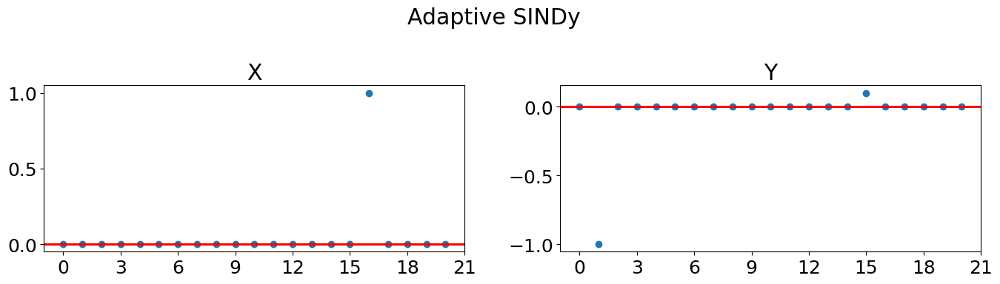

In [10]:
threshold = 0.0005
#****************************************************************************#
loc = plticker.MultipleLocator(base=3) # this locator puts ticks at regular intervals
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize =(14, 4))
fig.suptitle('Adaptive SINDy')

ax[0].plot(COEFF_ADT [:, 0].detach().cpu().numpy(), 'o') 
ax[0].set_title('X')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[0].xaxis.set_major_locator(loc)

ax[1].plot(COEFF_ADT [:, 1].detach().cpu().numpy(), 'o') 
ax[1].set_title('Y')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[1].xaxis.set_major_locator(loc)

fig.subplots_adjust(top=0.8)
fig.tight_layout()
plt.show()


In [11]:
print(COEFF_ADT)
print(SINE_ADT )
print(XSINE_ADT)
print(COSINE_ADT)
print(XCOSINE_ADT)
print(EXP_ADT)
print(XEXP_ADT)

tensor([[ 0.0000,  0.0000],
        [ 0.0000, -1.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.1000],
        [ 1.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', requires_grad=True)
tensor([[0.0000, 0.0000],
        [4.4174, 0.0000]], device='cuda:0', requires_grad=True)
tensor([[0., 0.],
        [0., 0.]], device='cuda:0', requires_grad=True)
tensor([[ 0.0000,  0.0000],
        [ 0.0000, -3.3592]], device='cuda:0', requires_grad=True)
tensor([[-2.7258,  0.7500],
        [ 0.0000, -2.6169]], device='cuda:0', requires_grad=True)
tensor([[-0.0417,  0.0

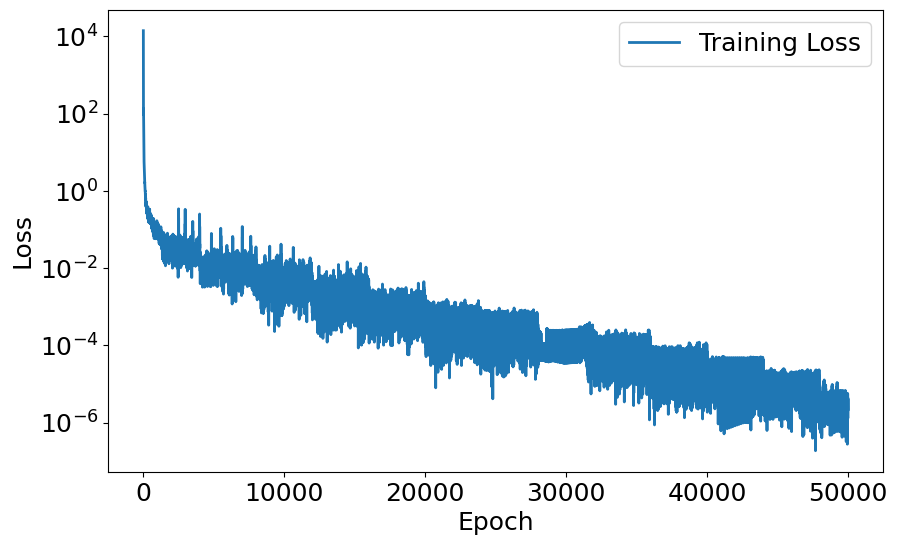

In [12]:
plt.figure(figsize=(10, 6))
plt.plot(Loss_data.numpy(), label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.legend()
plt.grid(False)
plt.savefig('Loss_plot.jpeg', dpi = 1200)
plt.show()

In [13]:
time = np.arange(Loss_data.size()[0], dtype=int)
data = np.column_stack((time, Loss_data.numpy().squeeze()))
np.savetxt('SGraD_SINDy_Harmonic_Oscillator.dat', data, fmt='%3.6e')